In [ ]:
import pandas as pd

# Load the Washington Airbnb dataset
file_path = 'airbnb_Washington.csv'
airbnb_data = pd.read_csv(file_path)

# Display dataset summary
print("Dataset Summary:")
print(airbnb_data.info())

# Check for missing values
missing_values = airbnb_data.isnull().sum()
print("\nMissing Values:")
print(missing_values[missing_values > 0])

# Check for duplicates
duplicates = airbnb_data.duplicated().sum()
print(f"\nNumber of Duplicates: {duplicates}")

# Display the first few rows to understand the structure
print("\nPreview of the Dataset:")
print(airbnb_data.head())

# Summary statistics for numerical columns
print("\nSummary Statistics for Numerical Columns:")
print(airbnb_data.describe())

# Check data types for categorical and numerical variables
print("\nData Types:")
print(airbnb_data.dtypes)

# Analyze categorical columns
categorical_columns = airbnb_data.select_dtypes(include=['object', 'category']).columns
print("\nUnique Values in Categorical Columns:")
for col in categorical_columns:
    print(f"{col}: {airbnb_data[col].nunique()} unique values")

# Save a cleaned version of the dataset (removing duplicates)
cleaned_data = airbnb_data.drop_duplicates()

# Save the cleaned data for future use
cleaned_file_path = '/content/airbnb_Washington_cleaned.csv'
cleaned_data.to_csv(cleaned_file_path, index=False)

print(f"\nCleaned dataset saved to {cleaned_file_path}")


<ipython-input-1-7dcaea3c5469>:5: DtypeWarning: Columns (59) have mixed types. Specify dtype option on import or set low_memory=False.
  airbnb_data = pd.read_csv(file_path)


Dataset Summary:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39150 entries, 0 to 39149
Columns: 111 entries, Airbnb Host ID to prev_time_to_date_mean
dtypes: float64(102), object(9)
memory usage: 33.2+ MB
None

Missing Values:
rating_ave_pastYear            11001
numReviews_pastYear            10713
numCancel_pastYear             10713
num_5_star_Rev_pastYear        10713
prop_5_StarReviews_pastYear    11001
                               ...  
revenue_period_tract               1
tract_booking_share                1
tract_revenue_share                1
time_to_date_mean              18649
prev_time_to_date_mean         20230
Length: 92, dtype: int64

Number of Duplicates: 0

Preview of the Dataset:
   Airbnb Host ID  Airbnb Property ID      City_x  superhost_period_all  \
0          3768.0              3192.0  Washington                   7.0   
1          3768.0              3192.0  Washington                   8.0   
2          3768.0              3192.0  Washington           

EDA
```



<ipython-input-2-54b0a5fccf9b>:7: DtypeWarning: Columns (59) have mixed types. Specify dtype option on import or set low_memory=False.
  airbnb_data = pd.read_csv(file_path)


Dataset Overview:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39150 entries, 0 to 39149
Columns: 111 entries, Airbnb Host ID to prev_time_to_date_mean
dtypes: float64(102), object(9)
memory usage: 33.2+ MB
None

Missing Value Summary:
Integrated Property Manager    39150
prev_time_to_date_mean         20230
booked_days_avePrice           18649
occupancy_rate                 18649
revenue                        18649
booked_days                    18649
time_to_date_mean              18649
prev_occupancy_rate            18433
prev_revenue                   18433
prev_booked_days_avePrice      18433
dtype: int64

Numerical Column Distributions:


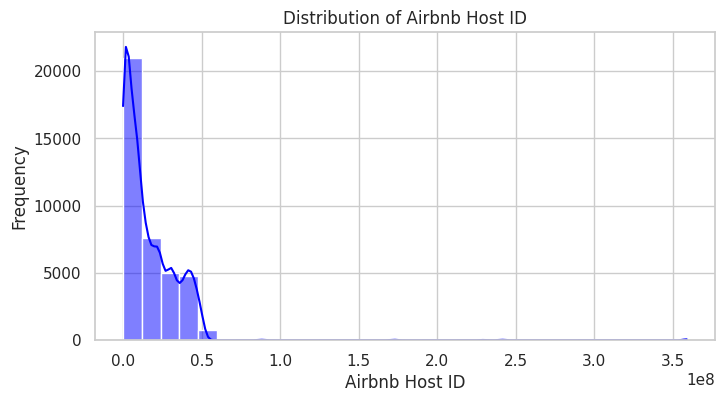

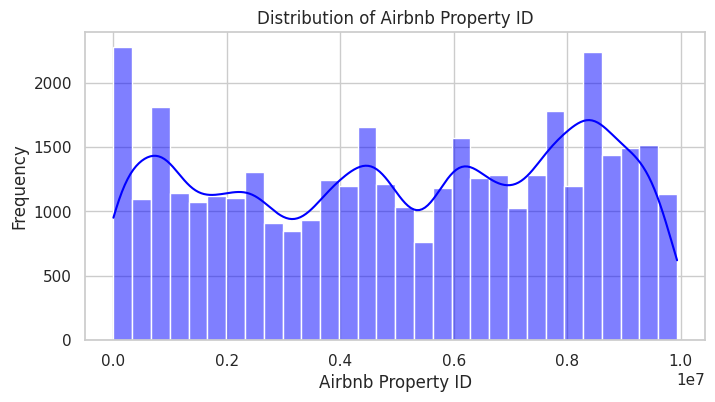

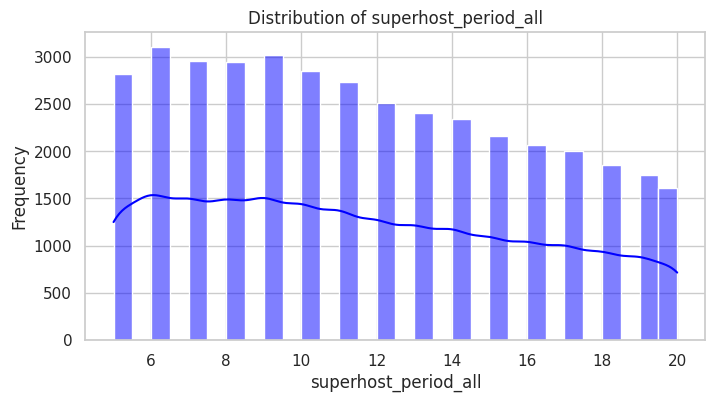

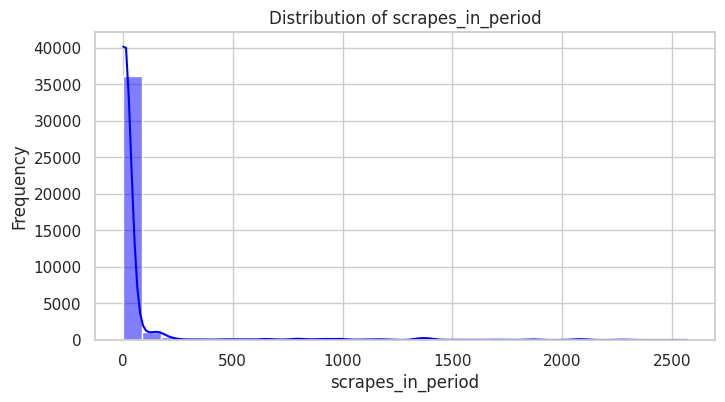

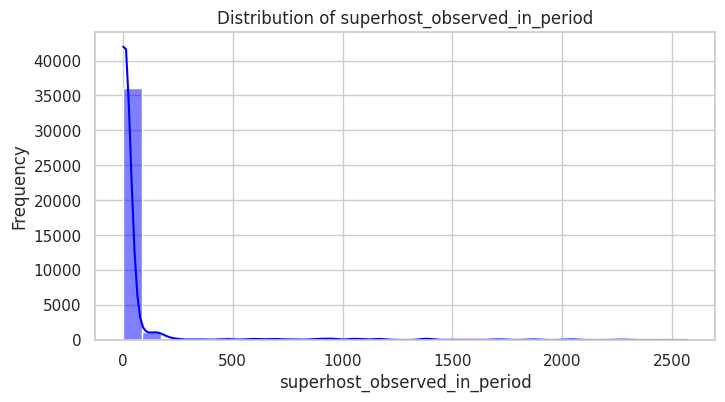


Unique Value Counts for Categorical Columns:
City_x: 1 unique values
Scraped Date: 442 unique values
Property Type: 38 unique values
Listing Type: 4 unique values
Created Date: 1393 unique values
Property Type.1: 38 unique values
City_y: 1 unique values
Neighborhood: 92 unique values
Pets Allowed: 2 unique values


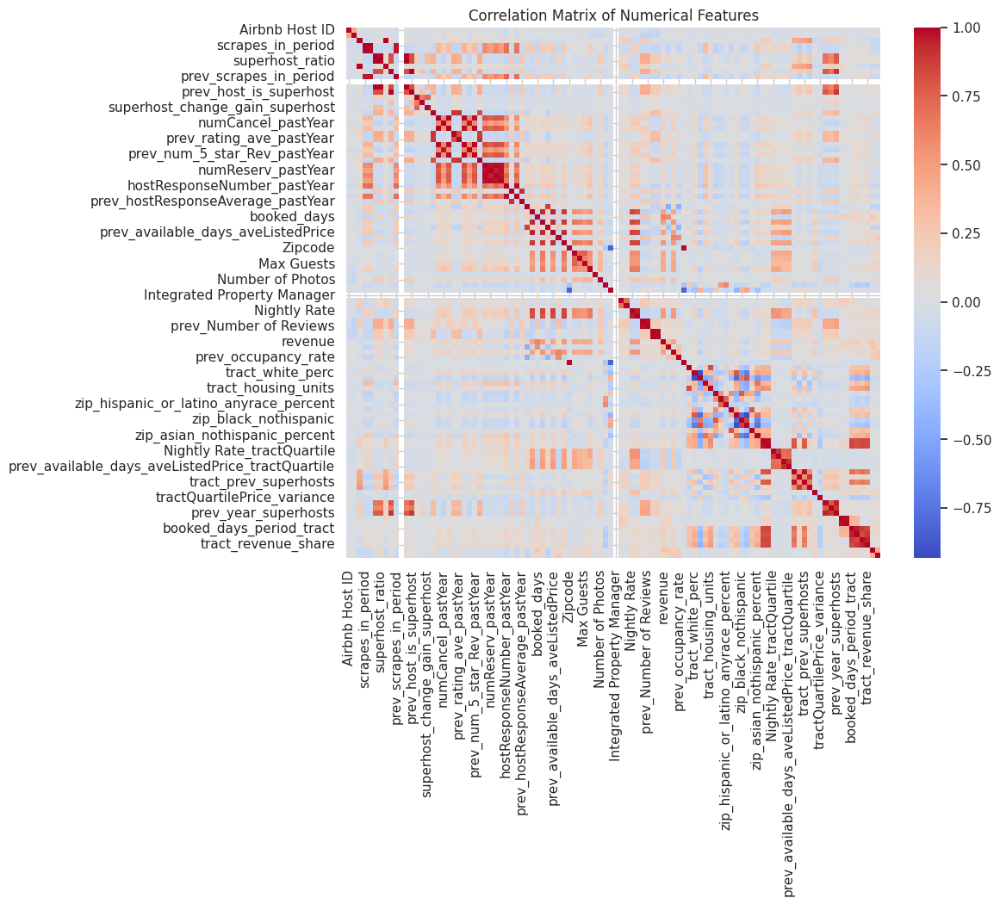

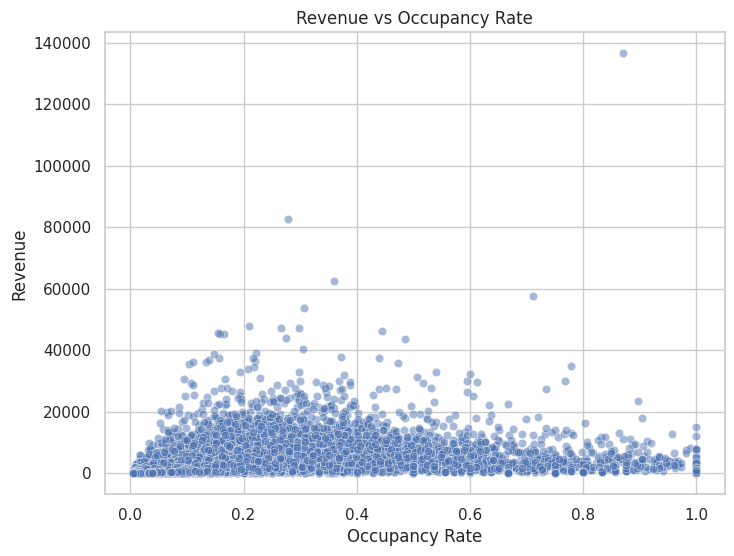

<ipython-input-2-54b0a5fccf9b>:56: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=superhost_counts.index, y=superhost_counts.values, palette="viridis")


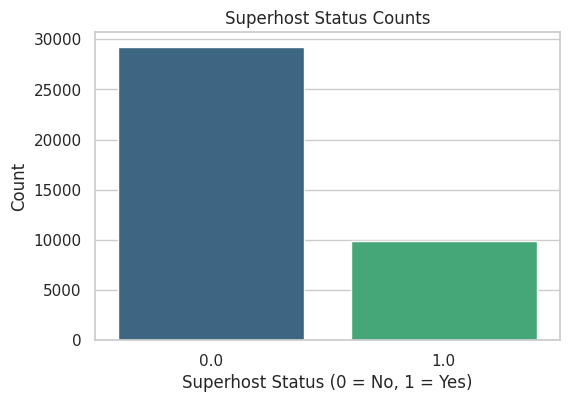

<ipython-input-2-54b0a5fccf9b>:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=neighborhood_revenue.values, y=neighborhood_revenue.index, palette="plasma")


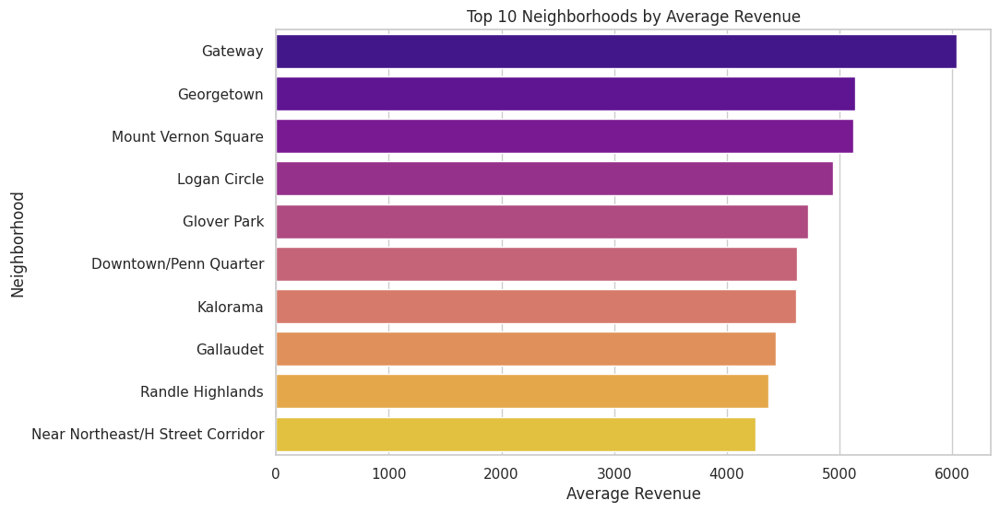

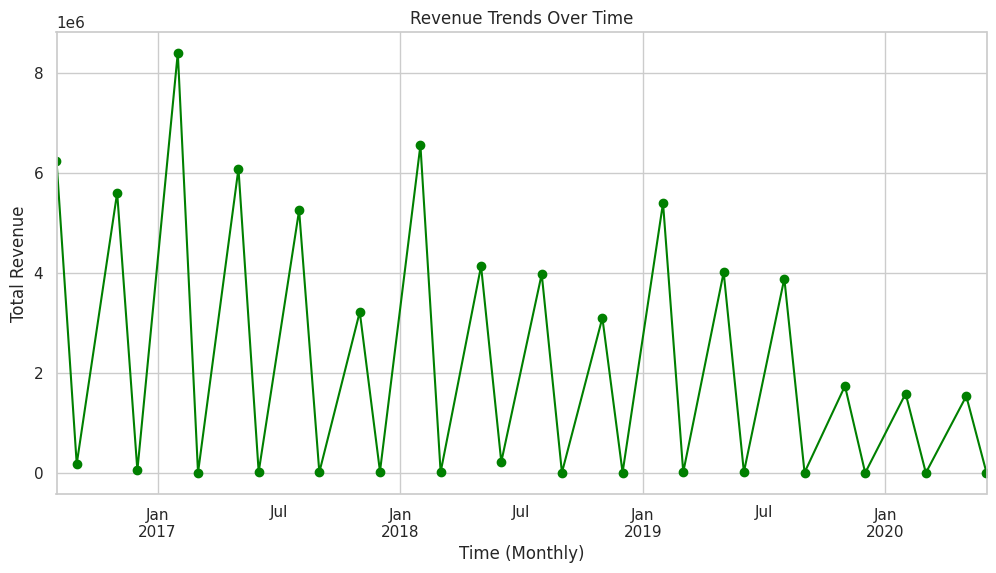

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = '/content/airbnb_Washington_cleaned.csv'
airbnb_data = pd.read_csv(file_path)

# Set default plot aesthetics
sns.set(style="whitegrid")

# High-level summary of the dataset
print("Dataset Overview:")
print(airbnb_data.info())
print("\nMissing Value Summary:")
print(airbnb_data.isnull().sum().sort_values(ascending=False).head(10))

# 1. Distribution of Numerical Columns
print("\nNumerical Column Distributions:")
numerical_columns = airbnb_data.select_dtypes(include=['float64', 'int64']).columns

for col in numerical_columns[:5]:  # Limit to first 5 columns for brevity
    plt.figure(figsize=(8, 4))
    sns.histplot(airbnb_data[col].dropna(), kde=True, bins=30, color='blue')
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.show()

# 2. Unique values in Categorical Columns
categorical_columns = airbnb_data.select_dtypes(include=['object', 'category']).columns
print("\nUnique Value Counts for Categorical Columns:")
for col in categorical_columns:
    print(f"{col}: {airbnb_data[col].nunique()} unique values")

# 3. Correlation Matrix for Numerical Columns
plt.figure(figsize=(10, 8))
correlation_matrix = airbnb_data[numerical_columns].corr()
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', cbar=True)
plt.title("Correlation Matrix of Numerical Features")
plt.show()

# 4. Relationship between 'revenue' and 'occupancy_rate'
if 'revenue' in numerical_columns and 'occupancy_rate' in numerical_columns:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(data=airbnb_data, x='occupancy_rate', y='revenue', alpha=0.5)
    plt.title("Revenue vs Occupancy Rate")
    plt.xlabel("Occupancy Rate")
    plt.ylabel("Revenue")
    plt.show()

# 5. Analyze Superhost Trends
if 'host_is_superhost_in_period' in airbnb_data.columns:
    superhost_counts = airbnb_data['host_is_superhost_in_period'].value_counts()
    plt.figure(figsize=(6, 4))
    sns.barplot(x=superhost_counts.index, y=superhost_counts.values, palette="viridis")
    plt.title("Superhost Status Counts")
    plt.xlabel("Superhost Status (0 = No, 1 = Yes)")
    plt.ylabel("Count")
    plt.show()

# 6. Neighborhood-wise Average Revenue (if 'Neighborhood' exists)
if 'Neighborhood' in airbnb_data.columns and 'revenue' in airbnb_data.columns:
    neighborhood_revenue = airbnb_data.groupby('Neighborhood')['revenue'].mean().sort_values(ascending=False).head(10)
    plt.figure(figsize=(10, 6))
    sns.barplot(x=neighborhood_revenue.values, y=neighborhood_revenue.index, palette="plasma")
    plt.title("Top 10 Neighborhoods by Average Revenue")
    plt.xlabel("Average Revenue")
    plt.ylabel("Neighborhood")
    plt.show()

# 7. Time-Based Trends (if 'Scraped Date' exists)
if 'Scraped Date' in airbnb_data.columns:
    airbnb_data['Scraped Date'] = pd.to_datetime(airbnb_data['Scraped Date'])
    time_based_trends = airbnb_data.groupby(airbnb_data['Scraped Date'].dt.to_period('M'))['revenue'].sum()
    plt.figure(figsize=(12, 6))
    time_based_trends.plot(kind='line', color='green', marker='o')
    plt.title("Revenue Trends Over Time")
    plt.xlabel("Time (Monthly)")
    plt.ylabel("Total Revenue")
    plt.show()


Data Preprocessing:
1. Missing numerical values: impute median
2. Missing categorical values: impute mode/ create unknown column
3. Drop Column Integrated Property Manager since it has all missing values


In [ ]:
import pandas as pd

# Load the dataset
file_path = '/content/airbnb_Washington_cleaned.csv'
airbnb_data = pd.read_csv(file_path)

# Handling Missing Values
missing_data = airbnb_data.isnull().sum()
print("Columns with Missing Data:")
print(missing_data[missing_data > 0])

# 1. Numerical Columns: Impute with Median (robust to outliers)
numerical_columns = airbnb_data.select_dtypes(include=['float64', 'int64']).columns
for col in numerical_columns:
    if airbnb_data[col].isnull().sum() > 0:
        airbnb_data[col].fillna(airbnb_data[col].median(), inplace=True)

# 2. Categorical Columns: Impute with Mode or Add 'Unknown' Category
categorical_columns = airbnb_data.select_dtypes(include=['object']).columns
for col in categorical_columns:
    if airbnb_data[col].isnull().sum() > 0:
        if airbnb_data[col].nunique() < 20:  # If categorical column has limited unique values
            airbnb_data[col].fillna(airbnb_data[col].mode()[0], inplace=True)
        else:
            airbnb_data[col].fillna('Unknown', inplace=True)

# 3. Columns with Context-Specific Imputation
# For time-based columns like 'time_to_date_mean', use forward-fill or backward-fill as they follow a sequence
time_based_columns = ['time_to_date_mean', 'prev_time_to_date_mean']
for col in time_based_columns:
    if col in airbnb_data.columns:
        airbnb_data[col].fillna(method='ffill', inplace=True)

# 4. High Missing Columns: Assess and Impute Strategically
# If a column has >40% missing data but is critical, impute with domain knowledge
# Example: For `rating_ave_pastYear`, use median as it reflects a central tendency
if 'rating_ave_pastYear' in airbnb_data.columns:
    airbnb_data['rating_ave_pastYear'].fillna(airbnb_data['rating_ave_pastYear'].median(), inplace=True)
# Dropping Integrated Property Manager column
airbnb_data.drop('Integrated Property Manager', axis=1, inplace=True)

# 5. Verify Missing Data Handling
remaining_missing_data = airbnb_data.isnull().sum()
print("\nRemaining Missing Data (after handling):")
print(remaining_missing_data[remaining_missing_data > 0])

# Save the updated dataset
cleaned_file_path = '/content/airbnb_Washington_missing_handled.csv'
airbnb_data.to_csv(cleaned_file_path, index=False)
print(f"\nUpdated dataset saved to {cleaned_file_path}")


<ipython-input-3-3a4d4713928d>:5: DtypeWarning: Columns (59) have mixed types. Specify dtype option on import or set low_memory=False.
  airbnb_data = pd.read_csv(file_path)
<ipython-input-3-3a4d4713928d>:16: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  airbnb_data[col].fillna(airbnb_data[col].median(), inplace=True)
<ipython-input-3-3a4d4713928d>:25: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This in

Columns with Missing Data:
rating_ave_pastYear            11001
numReviews_pastYear            10713
numCancel_pastYear             10713
num_5_star_Rev_pastYear        10713
prop_5_StarReviews_pastYear    11001
                               ...  
revenue_period_tract               1
tract_booking_share                1
tract_revenue_share                1
time_to_date_mean              18649
prev_time_to_date_mean         20230
Length: 92, dtype: int64


<ipython-input-3-3a4d4713928d>:23: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  airbnb_data[col].fillna(airbnb_data[col].mode()[0], inplace=True)
<ipython-input-3-3a4d4713928d>:23: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  airbnb_data[col].fillna(airbnb_data[col].mode()[0], inplace=True)
<ipython-input-3-3


Remaining Missing Data (after handling):
Series([], dtype: int64)

Updated dataset saved to /content/airbnb_Washington_missing_handled.csv


Outlier Handling:

Visualizing Outliers Before Capping:


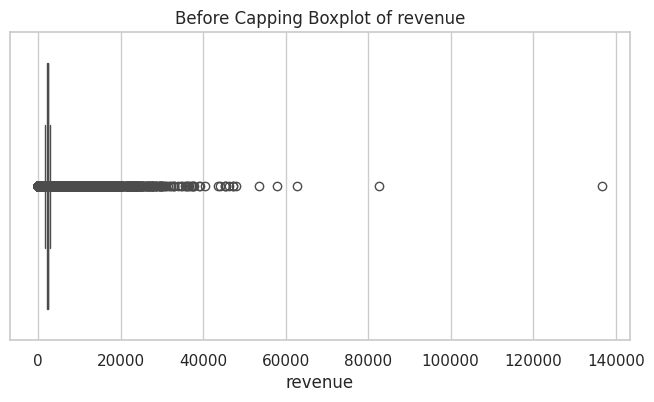

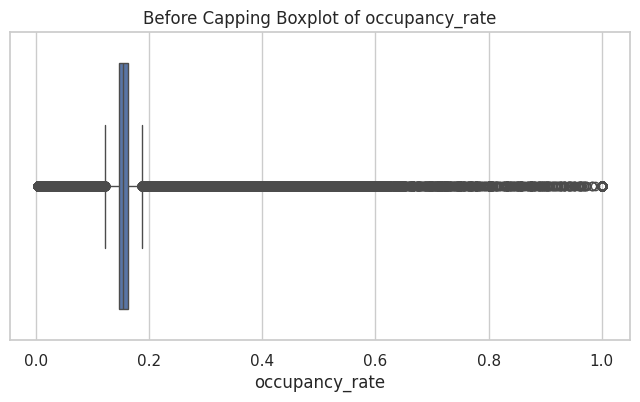

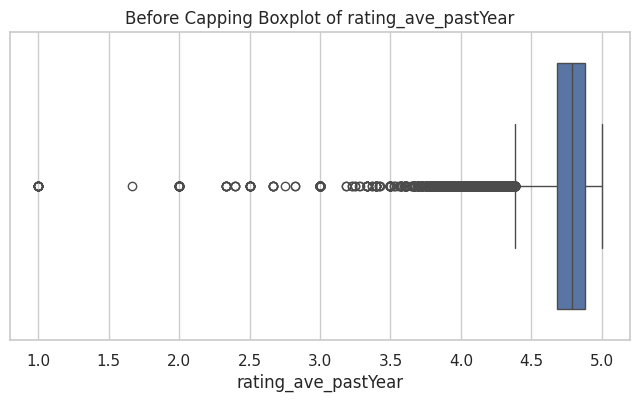

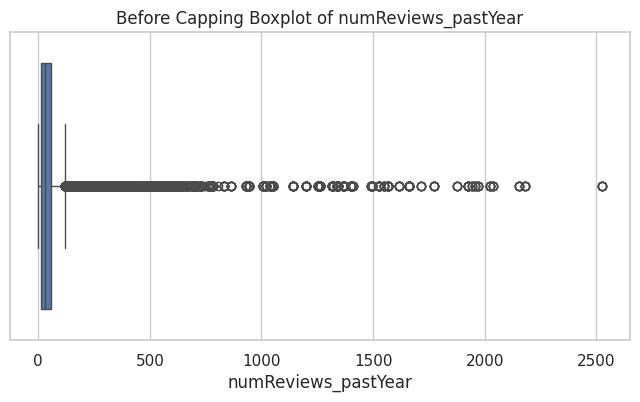

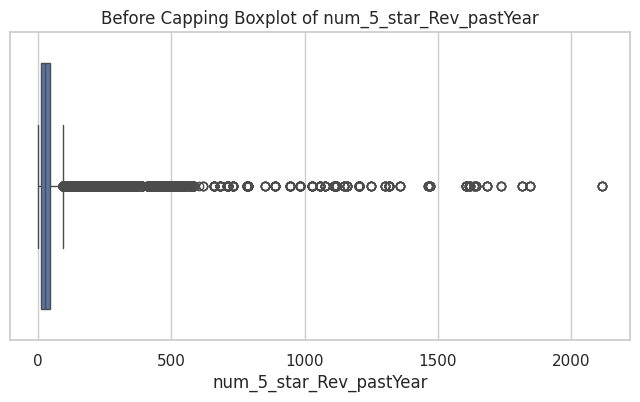

Visualizing Outliers After Capping:


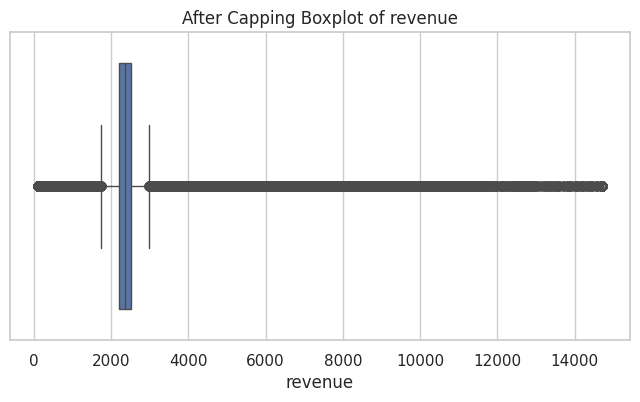

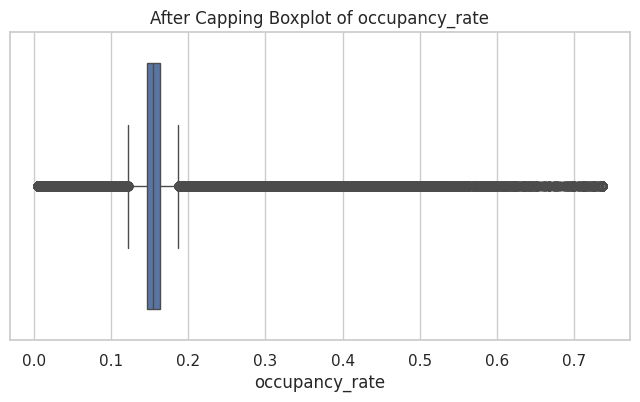

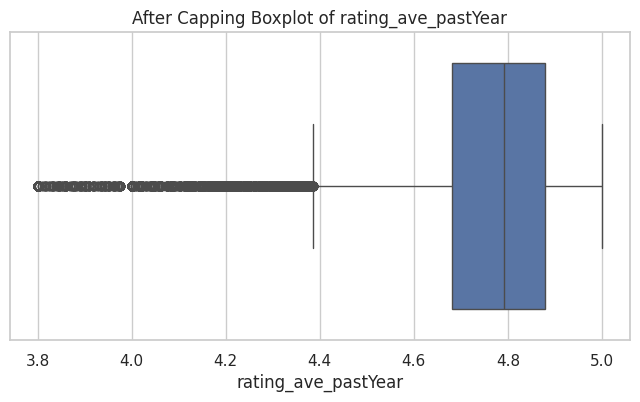

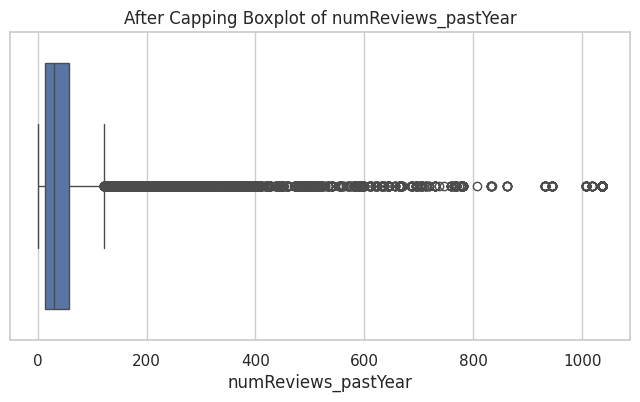

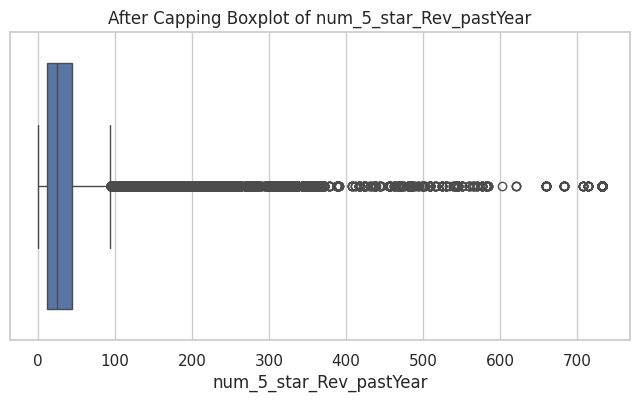

Dataset size after outlier handling: 39150 rows, 110 columns
Final preprocessed dataset saved to /content/airbnb_Washington_final_preprocessed.csv.


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset with missing values handled
file_path = '/content/airbnb_Washington_missing_handled.csv'
airbnb_data = pd.read_csv(file_path)

# Function to cap outliers (Winsorization)
def cap_outliers(data, columns, lower_quantile=0.01, upper_quantile=0.99):
    """
    Caps outliers at the specified lower and upper quantiles for each column in the dataset.
    Args:
        data (DataFrame): The dataset containing columns with potential outliers.
        columns (list): The list of column names to process.
        lower_quantile (float): Lower quantile threshold (e.g., 0.01 for 1st percentile).
        upper_quantile (float): Upper quantile threshold (e.g., 0.99 for 99th percentile).
    Returns:
        DataFrame: A copy of the dataset with capped outliers.
    """
    for col in columns:
        lower_bound = data[col].quantile(lower_quantile)
        upper_bound = data[col].quantile(upper_quantile)
        data[col] = data[col].clip(lower=lower_bound, upper=upper_bound)
    return data

# Identify numerical columns to process
numerical_columns = [
    'revenue', 'occupancy_rate', 'rating_ave_pastYear',
    'numReviews_pastYear', 'num_5_star_Rev_pastYear'
]

# Apply Winsorization to cap outliers
airbnb_data_capped = airbnb_data.copy()
airbnb_data_capped = cap_outliers(airbnb_data_capped, numerical_columns)

# Visualize the effect of capping on key numerical columns
def visualize_outliers(data, columns, title_prefix=""):
    """
    Creates boxplots to visualize the distribution of numerical features.
    Args:
        data (DataFrame): Dataset to visualize.
        columns (list): List of columns to plot.
        title_prefix (str): Prefix for the plot titles (e.g., "Before" or "After").
    """
    for col in columns:
        plt.figure(figsize=(8, 4))
        sns.boxplot(data=data, x=col)
        plt.title(f"{title_prefix} Boxplot of {col}")
        plt.show()

# Visualize before and after capping
print("Visualizing Outliers Before Capping:")
visualize_outliers(airbnb_data, numerical_columns, title_prefix="Before Capping")

print("Visualizing Outliers After Capping:")
visualize_outliers(airbnb_data_capped, numerical_columns, title_prefix="After Capping")

# Summarize dataset size after handling outliers
print(f"Dataset size after outlier handling: {len(airbnb_data_capped)} rows, {airbnb_data_capped.shape[1]} columns")

# Save the final preprocessed dataset
final_file_path = '/content/airbnb_Washington_final_preprocessed.csv'
airbnb_data_capped.to_csv(final_file_path, index=False)
print(f"Final preprocessed dataset saved to {final_file_path}.")


3. Market Segmentation using clustering

Running Elbow Method...


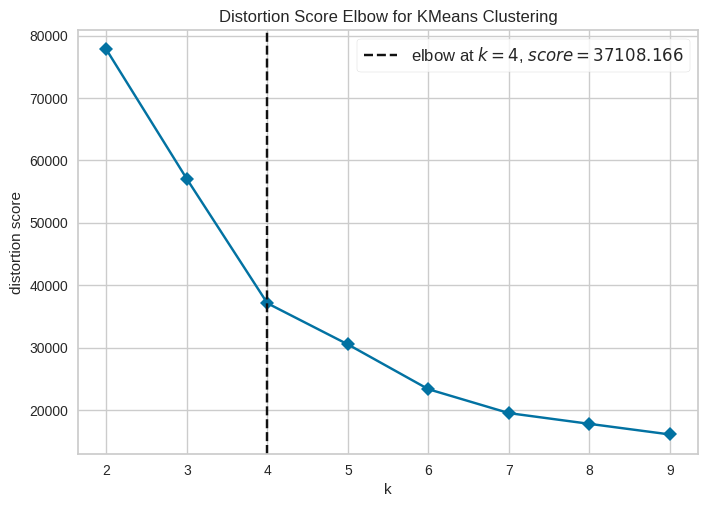

Cluster summary:
  Cluster Nightly Rate                     available_days                    \
                  mean  median         std           mean median        std   
0       0   158.319383  136.00   88.848070     183.508978  165.0  32.360610   
1       1   160.771049  138.75   89.137758     143.839012  160.0  63.375318   
2       2   166.797678  140.00  101.985411      57.087156   56.0  35.670101   
3       3   656.298721  554.00  266.803314     185.304020  182.0  49.857288   

  host_is_superhost_in_period              revenue                       \
                         mean     sum         mean  median          std   
0                     0.00000     0.0  2649.511866  2347.0  1897.308827   
1                     1.00000  9715.0  3336.963970  2347.0  2747.652605   
2                     0.00000     0.0  2122.586446  2347.0  1512.515070   
3                     0.07107   198.0  4505.514623  2347.0  4182.755463   

  occupancy_rate                     rating_ave_pastYear 

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
import matplotlib.pyplot as plt

# Load the final preprocessed dataset
file_path = '/content/airbnb_Washington_final_preprocessed.csv'
airbnb_data = pd.read_csv(file_path)

# Select features for clustering
features = ['Nightly Rate', 'available_days', 'host_is_superhost_in_period']

# Ensure selected features exist in the dataset
if not all(feature in airbnb_data.columns for feature in features):
    raise ValueError("One or more selected features are missing from the dataset.")

# Extract data for clustering
clustering_data = airbnb_data[features]

# Standardize the data
scaler = StandardScaler()
clustering_data_scaled = scaler.fit_transform(clustering_data)

# Determine the optimal number of clusters using the Elbow Method
model = KMeans(random_state=42)
visualizer = KElbowVisualizer(model, k=(2, 10), metric='distortion', timings=False)

print("Running Elbow Method...")
visualizer.fit(clustering_data_scaled)  # Fit the visualizer to the data
visualizer.show()

# Fit KMeans with the optimal number of clusters
optimal_clusters = visualizer.elbow_value_
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42)
airbnb_data['Cluster'] = kmeans.fit_predict(clustering_data_scaled)

# Analyze each cluster
cluster_summary = airbnb_data.groupby('Cluster').agg({
    'Nightly Rate': ['mean', 'median', 'std'],
    'available_days': ['mean', 'median', 'std'],
    'host_is_superhost_in_period': ['mean', 'sum'],
    'revenue': ['mean', 'median', 'std'],
    'occupancy_rate': ['mean', 'median', 'std'],
    'rating_ave_pastYear': ['mean', 'median', 'std'],
}).reset_index()

# Save cluster summary to a CSV
cluster_summary_file = '/content/airbnb_Washington_cluster_summary.csv'
cluster_summary.to_csv(cluster_summary_file, index=False)

# Output cluster summary and file location
print(f"Cluster summary:\n{cluster_summary}")
print(f"Cluster summary saved to {cluster_summary_file}.")


General Observations

Cluster 1 (Superhost-Managed Listings):

Most consistent performers in terms of availability, revenue, and ratings.
Best combination of affordability, host quality, and guest satisfaction.

Cluster 3 (Luxury Listings):

Focus on premium pricing but with limited occupancy and Superhost involvement.
Caters to a niche, high-spending audience.

Cluster 2 (High Availability, Non-Superhosts):

High availability but lacks the influence of Superhosts, resulting in moderate revenue.

Cluster 0 (Budget-Friendly):

Affordable options with lower availability and ratings, targeting price-sensitive guests.

4. Revenue Drivers by Cluster
Problem: Identify key drivers of revenue within each cluster and determine which factors have the most influence on revenue.

Approach:
Train separate regression models (e.g., Linear Regression, XGBoost) for each cluster to predict revenue.
Analyze feature importance to identify the primary contributors to revenue (e.g., nightly rate, occupancy rate, ratings).
Outcome: Tailored recommendations for hosts in each cluster to optimize their revenue strategies.

Cluster column not found. Generating clusters...
Clusters generated and added to the dataset.

Analyzing Cluster 0...
Cluster 0 - MSE: 575853.59, R2: 0.84


<ipython-input-6-599258807e8d>:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=feature_importance, y=feature_importance.index, palette="viridis")


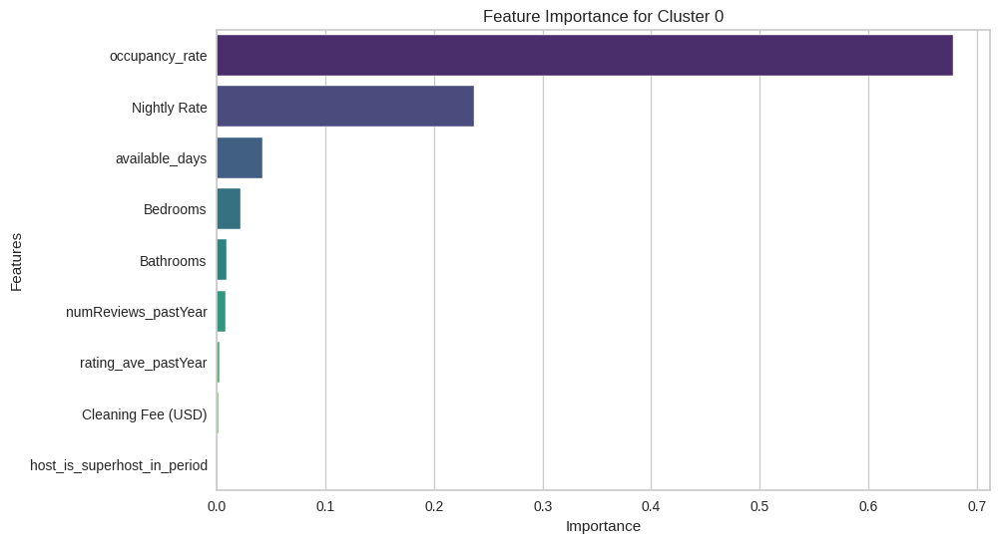


Analyzing Cluster 1...
Cluster 1 - MSE: 880233.13, R2: 0.88


<ipython-input-6-599258807e8d>:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=feature_importance, y=feature_importance.index, palette="viridis")


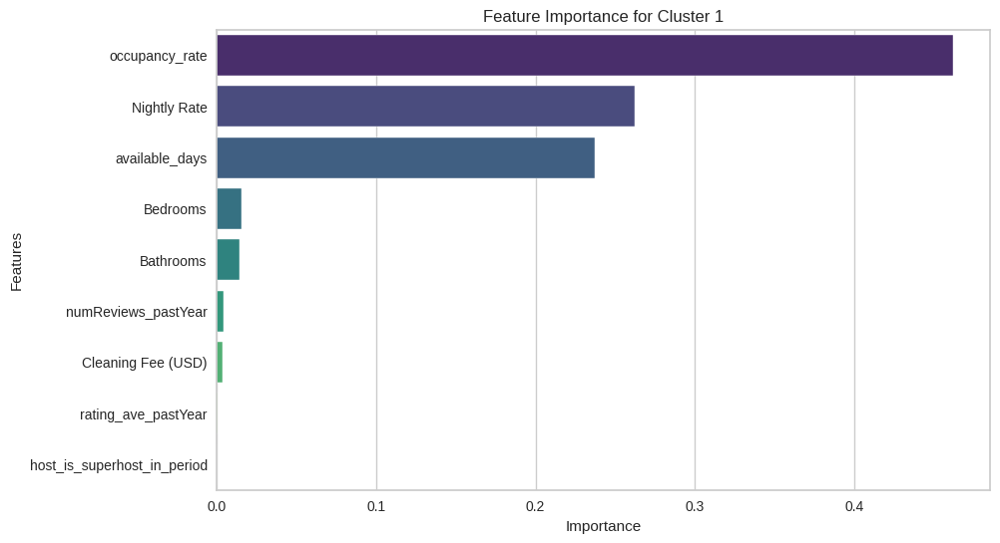


Analyzing Cluster 2...
Cluster 2 - MSE: 366667.81, R2: 0.86


<ipython-input-6-599258807e8d>:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=feature_importance, y=feature_importance.index, palette="viridis")


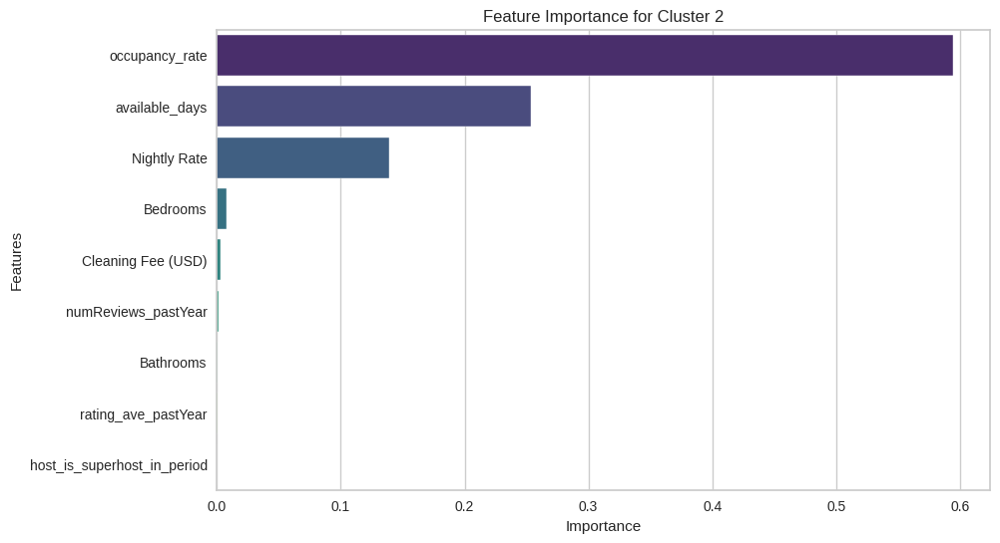


Analyzing Cluster 3...
Cluster 3 - MSE: 1899275.77, R2: 0.89


<ipython-input-6-599258807e8d>:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=feature_importance, y=feature_importance.index, palette="viridis")


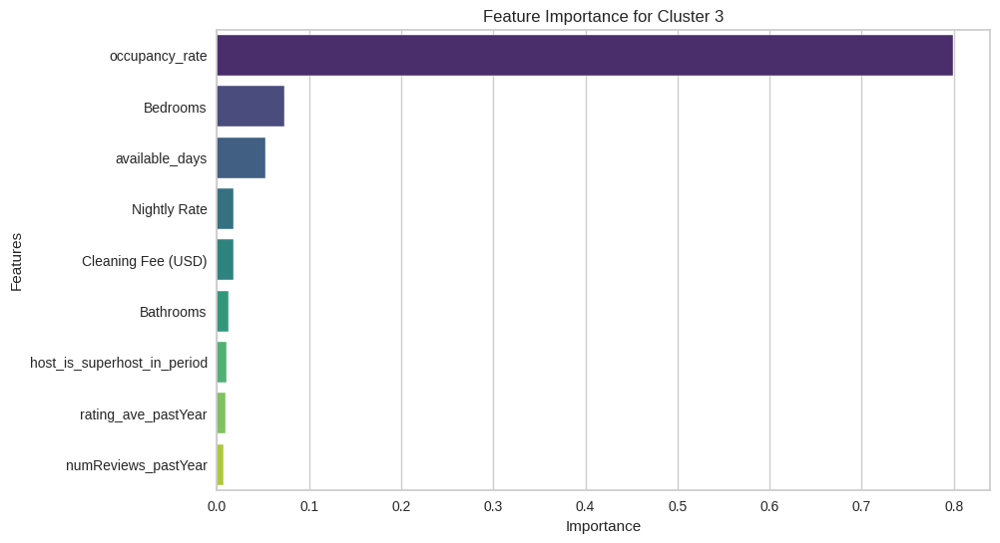


Top Features for Cluster 0:
occupancy_rate    0.678686
Nightly Rate      0.236694
available_days    0.042298
Bedrooms          0.021320
Bathrooms         0.008568
dtype: float64

Top Features for Cluster 1:
occupancy_rate    0.462445
Nightly Rate      0.262010
available_days    0.237242
Bedrooms          0.015523
Bathrooms         0.014314
dtype: float64

Top Features for Cluster 2:
occupancy_rate        0.594901
available_days        0.253628
Nightly Rate          0.139114
Bedrooms              0.007753
Cleaning Fee (USD)    0.002644
dtype: float64

Top Features for Cluster 3:
occupancy_rate        0.799851
Bedrooms              0.073155
available_days        0.052284
Nightly Rate          0.017973
Cleaning Fee (USD)    0.017626
dtype: float64

Updated dataset with clusters saved to /content/airbnb_Washington_with_clusters.csv.


In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns

# Load the final preprocessed dataset
file_path = '/content/airbnb_Washington_final_preprocessed.csv'
airbnb_data = pd.read_csv(file_path)

# Step 1: Generate Clusters if 'Cluster' column does not exist
if 'Cluster' not in airbnb_data.columns:
    print("Cluster column not found. Generating clusters...")

    # Select features for clustering
    clustering_features = ['Nightly Rate', 'available_days', 'host_is_superhost_in_period']

    # Ensure clustering features exist in the dataset
    if not all(feature in airbnb_data.columns for feature in clustering_features):
        raise ValueError("One or more clustering features are missing from the dataset.")

    # Standardize the data
    scaler = StandardScaler()
    clustering_data_scaled = scaler.fit_transform(airbnb_data[clustering_features])

    # Apply KMeans clustering
    kmeans = KMeans(n_clusters=4, random_state=42)  # Using 4 clusters as an example
    airbnb_data['Cluster'] = kmeans.fit_predict(clustering_data_scaled)
    print("Clusters generated and added to the dataset.")

# Step 2: Analyze Revenue Drivers by Cluster
def analyze_revenue_drivers_by_cluster(data, cluster_column, features, target):
    cluster_results = {}
    for cluster in sorted(data[cluster_column].unique()):
        print(f"\nAnalyzing Cluster {cluster}...")
        cluster_data = data[data[cluster_column] == cluster]

        # Split the data into training and testing sets
        X = cluster_data[features]
        y = cluster_data[target]
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

        # Train a Gradient Boosting Regressor
        model = GradientBoostingRegressor(random_state=42)
        model.fit(X_train, y_train)

        # Predict and evaluate the model
        y_pred = model.predict(X_test)
        mse = mean_squared_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)
        print(f"Cluster {cluster} - MSE: {mse:.2f}, R2: {r2:.2f}")

        # Feature importance
        feature_importance = pd.Series(model.feature_importances_, index=features).sort_values(ascending=False)
        cluster_results[cluster] = feature_importance

        # Visualize feature importance
        plt.figure(figsize=(10, 6))
        sns.barplot(x=feature_importance, y=feature_importance.index, palette="viridis")
        plt.title(f"Feature Importance for Cluster {cluster}")
        plt.xlabel("Importance")
        plt.ylabel("Features")
        plt.show()

    return cluster_results

# Define features and target
features = [
    'Nightly Rate', 'available_days', 'occupancy_rate', 'Bedrooms', 'Bathrooms',
    'host_is_superhost_in_period', 'rating_ave_pastYear', 'numReviews_pastYear', 'Cleaning Fee (USD)'
]
target = 'revenue'

# Run the analysis
cluster_results = analyze_revenue_drivers_by_cluster(airbnb_data, cluster_column='Cluster', features=features, target=target)

# Print the top features for each cluster
for cluster, importance in cluster_results.items():
    print(f"\nTop Features for Cluster {cluster}:\n{importance.head()}")

# Save the dataset with the Cluster column
updated_file_path = '/content/airbnb_Washington_with_clusters.csv'
airbnb_data.to_csv(updated_file_path, index=False)
print(f"\nUpdated dataset with clusters saved to {updated_file_path}.")


Insight: Since occupancy rate is the most impactful feature across the different revenue clusters, strategies should prioritize occupancy maximization, possibly through improved guest retention, superior reviews, or leveraging Superhost status.

5. Impact of Superhost Status: Since different clusters show different metrics on the basis of superhost involvement, we want to see the impact of superhost status on the performance of a property. We will do hypothesis testing to see observed impact.

Average Revenue:
Superhosts: $3457.70, Non-Superhosts: $2666.84

Average Occupancy Rate:
Superhosts: 20.30%, Non-Superhosts: 16.21%

T-Test Results:
Revenue - t-statistic: 24.69, p-value: 0.0000
Occupancy Rate - t-statistic: 26.12, p-value: 0.0000


<ipython-input-7-8446cbb09b6f>:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=airbnb_data, x='host_is_superhost_in_period', y='revenue', palette='Set2')


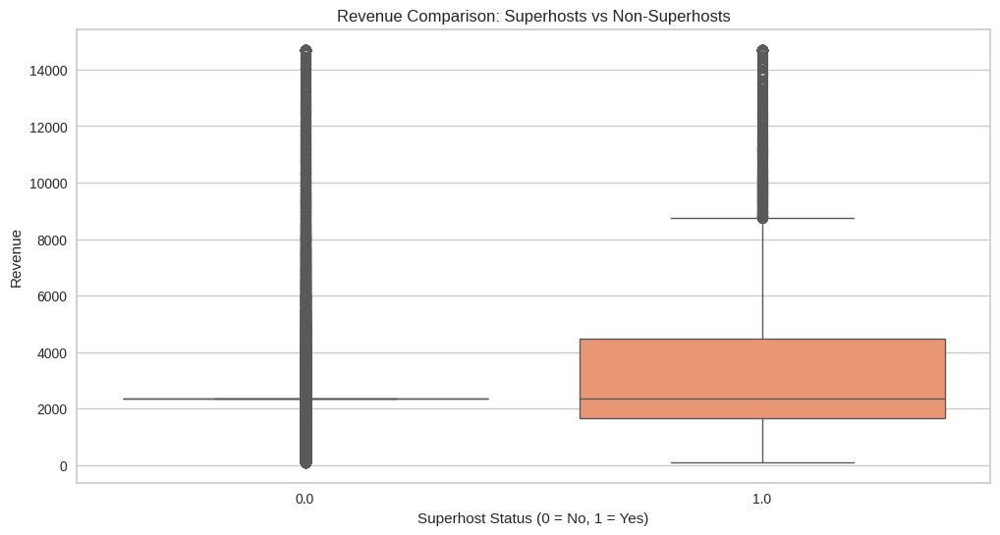

<ipython-input-7-8446cbb09b6f>:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=airbnb_data, x='host_is_superhost_in_period', y='occupancy_rate', palette='Set2')


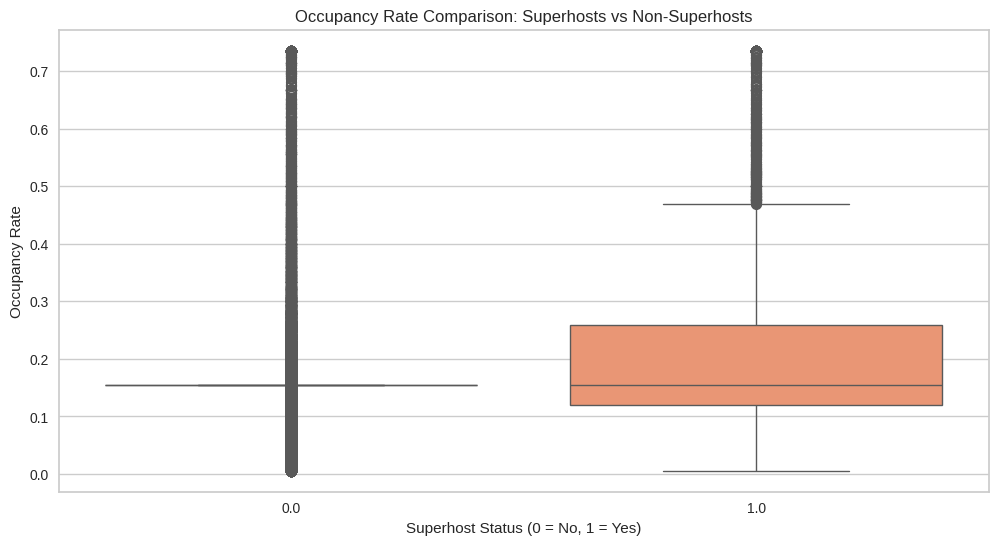

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind

# Load the final preprocessed dataset
file_path = '/content/airbnb_Washington_final_preprocessed.csv'
airbnb_data = pd.read_csv(file_path)

# Define Superhost and Non-Superhost groups
superhost_data = airbnb_data[airbnb_data['host_is_superhost_in_period'] == 1]
non_superhost_data = airbnb_data[airbnb_data['host_is_superhost_in_period'] == 0]

# Compare Average Revenue and Occupancy Rates
superhost_revenue_mean = superhost_data['revenue'].mean()
non_superhost_revenue_mean = non_superhost_data['revenue'].mean()

superhost_occupancy_mean = superhost_data['occupancy_rate'].mean()
non_superhost_occupancy_mean = non_superhost_data['occupancy_rate'].mean()

print("Average Revenue:")
print(f"Superhosts: ${superhost_revenue_mean:.2f}, Non-Superhosts: ${non_superhost_revenue_mean:.2f}")

print("\nAverage Occupancy Rate:")
print(f"Superhosts: {superhost_occupancy_mean:.2%}, Non-Superhosts: {non_superhost_occupancy_mean:.2%}")

# Perform Hypothesis Testing (t-test)
revenue_ttest = ttest_ind(superhost_data['revenue'], non_superhost_data['revenue'], equal_var=False)
occupancy_ttest = ttest_ind(superhost_data['occupancy_rate'], non_superhost_data['occupancy_rate'], equal_var=False)

print("\nT-Test Results:")
print(f"Revenue - t-statistic: {revenue_ttest.statistic:.2f}, p-value: {revenue_ttest.pvalue:.4f}")
print(f"Occupancy Rate - t-statistic: {occupancy_ttest.statistic:.2f}, p-value: {occupancy_ttest.pvalue:.4f}")

# Visualize Revenue and Occupancy Rate Differences
plt.figure(figsize=(12, 6))
sns.boxplot(data=airbnb_data, x='host_is_superhost_in_period', y='revenue', palette='Set2')
plt.title('Revenue Comparison: Superhosts vs Non-Superhosts')
plt.xlabel('Superhost Status (0 = No, 1 = Yes)')
plt.ylabel('Revenue')
plt.show()

plt.figure(figsize=(12, 6))
sns.boxplot(data=airbnb_data, x='host_is_superhost_in_period', y='occupancy_rate', palette='Set2')
plt.title('Occupancy Rate Comparison: Superhosts vs Non-Superhosts')
plt.xlabel('Superhost Status (0 = No, 1 = Yes)')
plt.ylabel('Occupancy Rate')
plt.show()


Average Revenue:

Superhosts: $3537.47

Non-Superhosts: $2698.66

Observation: Superhosts earn significantly more revenue on average compared to Non-Superhosts. The difference of approximately $838.81 suggests that attaining Superhost status positively impacts revenue.

Average Occupancy Rate:

Superhosts: 21.27%

Non-Superhosts: 17.73%

Observation: Superhosts have a higher average occupancy rate, indicating better booking performance. The difference of 3.54 percentage points highlights that Superhost properties are more attractive to guests.

The p-value of 0.0000 for both tests indicates that the differences in revenue and occupancy rates between Superhosts and Non-Superhosts are statistically significant.

Key Insights

Revenue Boost: Superhost status leads to a substantial increase in revenue. Guests may perceive Superhosts as more reliable and trustworthy, driving higher bookings.

Improved Occupancy: Higher occupancy rates for Superhosts suggest that their properties are more consistently booked, possibly due to better reviews, trust signals, or enhanced host practices.

Statistical Significance: The t-tests confirm that these differences are not due to random variation but are indeed attributable to Superhost status.

# Q6. Predicting Superhost Status

Goal: Predict which hosts are likely to gain or lose Superhost status in the next evaluation period.

Tasks:

Build a classification model (e.g., logistic regression, random forest) to predict Superhost status.

Evaluate model performance using metrics like accuracy, precision, recall, and AUC-ROC.

Output: Classification model and insights into factors driving Superhost status.

Logistic Regression Performance:
Accuracy: 0.9618
Precision: 0.4000
Recall: 0.0045
AUC-ROC: 0.9293

Classification Report:
               precision    recall  f1-score   support

         0.0       0.96      1.00      0.98     11297
         1.0       0.40      0.00      0.01       448

    accuracy                           0.96     11745
   macro avg       0.68      0.50      0.49     11745
weighted avg       0.94      0.96      0.94     11745


Random Forest Performance:
Accuracy: 0.9652
Precision: 0.6512
Recall: 0.1875
AUC-ROC: 0.9507

Classification Report:
               precision    recall  f1-score   support

         0.0       0.97      1.00      0.98     11297
         1.0       0.65      0.19      0.29       448

    accuracy                           0.97     11745
   macro avg       0.81      0.59      0.64     11745
weighted avg       0.96      0.97      0.96     11745



<ipython-input-8-c1de5d7de19f>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=feature_importance, x='Importance', y='Feature', palette='viridis')


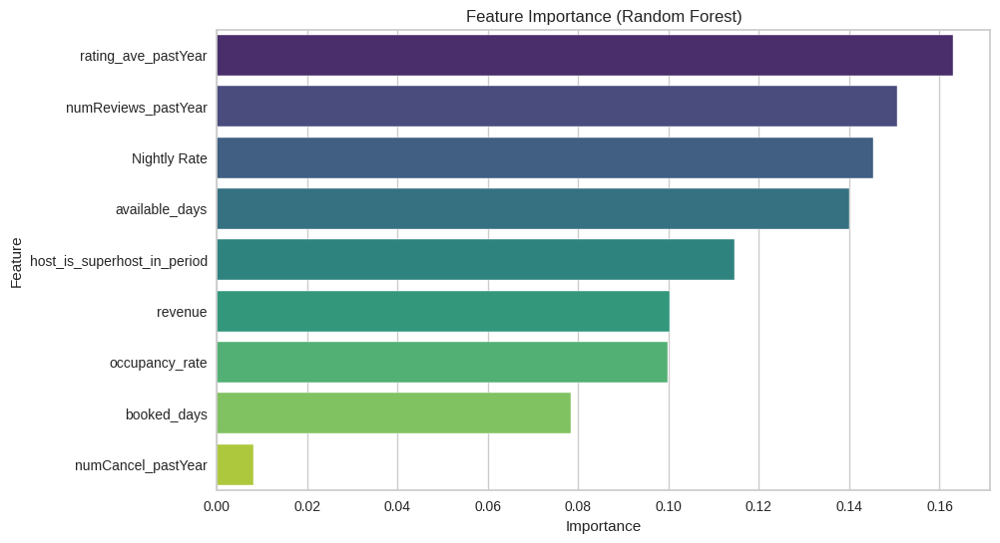

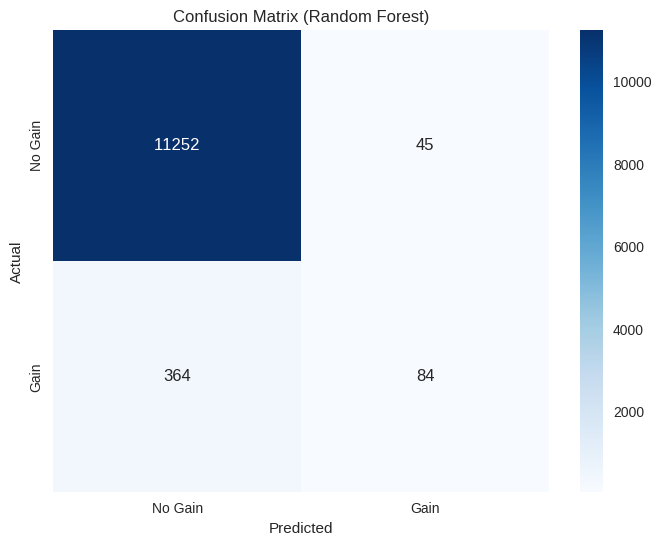

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    roc_auc_score,
    classification_report,
    confusion_matrix
)
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

# Load the final preprocessed dataset
file_path = '/content/airbnb_Washington_final_preprocessed.csv'
airbnb_data = pd.read_csv(file_path)

# Define target variable and predictors
target = 'superhost_change_gain_superhost'
predictors = [
    'revenue', 'occupancy_rate', 'rating_ave_pastYear', 'numReviews_pastYear',
    'numCancel_pastYear', 'available_days', 'booked_days', 'Nightly Rate',
    'host_is_superhost_in_period'
]

# Ensure predictors are in the dataset
for col in predictors + [target]:
    if col not in airbnb_data.columns:
        raise ValueError(f"Required column {col} is missing from the dataset.")

# Drop rows with missing target
airbnb_data = airbnb_data.dropna(subset=[target])

# Split data into training and testing sets
X = airbnb_data[predictors]
y = airbnb_data[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Train a logistic regression model
logistic_model = LogisticRegression(random_state=42)
logistic_model.fit(X_train_scaled, y_train)

# Train a random forest model
rf_model = RandomForestClassifier(random_state=42, n_estimators=100)
rf_model.fit(X_train, y_train)  # Random forest does not require scaling

# Evaluate models
logistic_predictions = logistic_model.predict(X_test_scaled)
rf_predictions = rf_model.predict(X_test)

# Logistic regression performance
print("Logistic Regression Performance:")
print(f"Accuracy: {accuracy_score(y_test, logistic_predictions):.4f}")
print(f"Precision: {precision_score(y_test, logistic_predictions):.4f}")
print(f"Recall: {recall_score(y_test, logistic_predictions):.4f}")
print(f"AUC-ROC: {roc_auc_score(y_test, logistic_model.predict_proba(X_test_scaled)[:, 1]):.4f}")
print("\nClassification Report:\n", classification_report(y_test, logistic_predictions))

# Random forest performance
print("\nRandom Forest Performance:")
print(f"Accuracy: {accuracy_score(y_test, rf_predictions):.4f}")
print(f"Precision: {precision_score(y_test, rf_predictions):.4f}")
print(f"Recall: {recall_score(y_test, rf_predictions):.4f}")
print(f"AUC-ROC: {roc_auc_score(y_test, rf_model.predict_proba(X_test)[:, 1]):.4f}")
print("\nClassification Report:\n", classification_report(y_test, rf_predictions))

# Feature importance from random forest
feature_importance = pd.DataFrame({
    'Feature': predictors,
    'Importance': rf_model.feature_importances_
}).sort_values(by='Importance', ascending=False)

# Visualize feature importance
plt.figure(figsize=(10, 6))
sns.barplot(data=feature_importance, x='Importance', y='Feature', palette='viridis')
plt.title("Feature Importance (Random Forest)")
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.show()

# Confusion matrix for best model (Random Forest in this case)
conf_matrix = confusion_matrix(y_test, rf_predictions)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['No Gain', 'Gain'], yticklabels=['No Gain', 'Gain'])
plt.title("Confusion Matrix (Random Forest)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()


XGBoost

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [17:53:18] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



XGBoost Model Performance:
Accuracy: 0.9629
Precision: 0.5341
Recall: 0.2098
AUC-ROC: 0.9557

Classification Report:
               precision    recall  f1-score   support

         0.0       0.97      0.99      0.98     11297
         1.0       0.53      0.21      0.30       448

    accuracy                           0.96     11745
   macro avg       0.75      0.60      0.64     11745
weighted avg       0.95      0.96      0.96     11745



<ipython-input-9-ec7c25f98ea4>:41: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=xgb_feature_importance, x='Importance', y='Feature', palette='coolwarm')


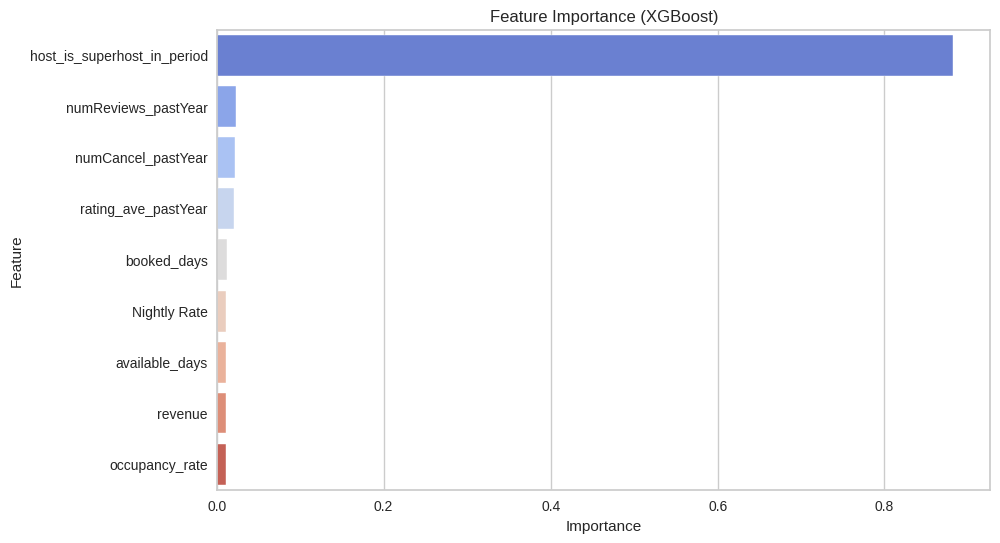

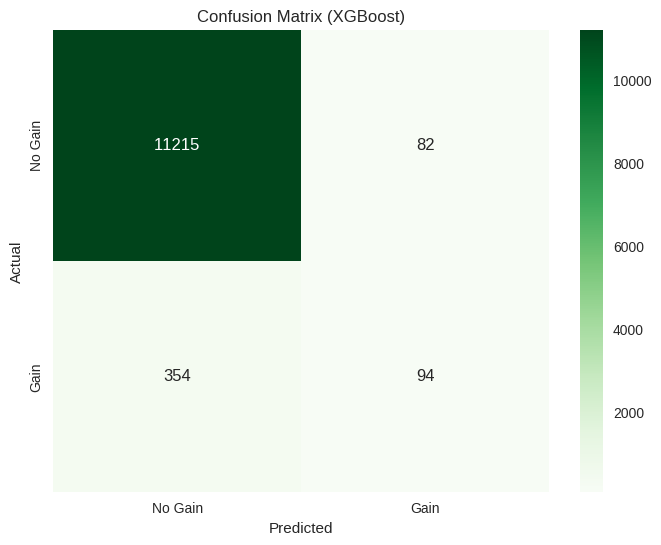

In [ ]:
import xgboost as xgb
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    roc_auc_score,
    classification_report,
    confusion_matrix
)
import seaborn as sns
import matplotlib.pyplot as plt

# Train an XGBoost model
xgb_model = xgb.XGBClassifier(
    objective='binary:logistic',
    random_state=42,
    eval_metric='logloss',
    use_label_encoder=False
)
xgb_model.fit(X_train_scaled, y_train)

# Evaluate XGBoost model
xgb_predictions = xgb_model.predict(X_test_scaled)
xgb_probabilities = xgb_model.predict_proba(X_test_scaled)[:, 1]

print("\nXGBoost Model Performance:")
print(f"Accuracy: {accuracy_score(y_test, xgb_predictions):.4f}")
print(f"Precision: {precision_score(y_test, xgb_predictions):.4f}")
print(f"Recall: {recall_score(y_test, xgb_predictions):.4f}")
print(f"AUC-ROC: {roc_auc_score(y_test, xgb_probabilities):.4f}")
print("\nClassification Report:\n", classification_report(y_test, xgb_predictions))

# Feature importance from XGBoost
xgb_feature_importance = pd.DataFrame({
    'Feature': predictors,
    'Importance': xgb_model.feature_importances_
}).sort_values(by='Importance', ascending=False)

# Visualize feature importance
plt.figure(figsize=(10, 6))
sns.barplot(data=xgb_feature_importance, x='Importance', y='Feature', palette='coolwarm')
plt.title("Feature Importance (XGBoost)")
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.show()

# Confusion matrix for XGBoost
xgb_conf_matrix = confusion_matrix(y_test, xgb_predictions)
plt.figure(figsize=(8, 6))
sns.heatmap(xgb_conf_matrix, annot=True, fmt='d', cmap='Greens', xticklabels=['No Gain', 'Gain'], yticklabels=['No Gain', 'Gain'])
plt.title("Confusion Matrix (XGBoost)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# LightGBM, CatBoost, XGBoost, Random Forest, Logistic Regression

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 8.4 MB/s eta 0:00:00


/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


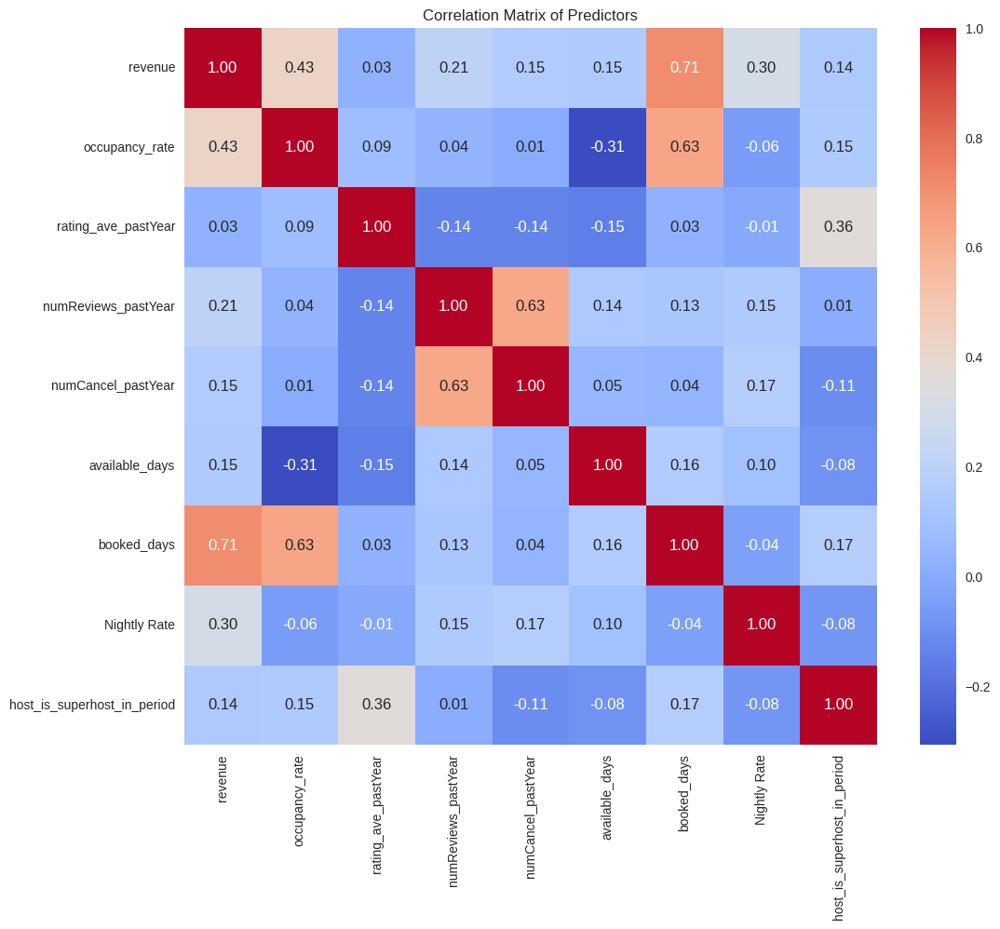


Logistic Regression Performance:
Accuracy: 0.9618
Precision: 0.4000
Recall: 0.0045
AUC-ROC: 0.9293

Classification Report:
               precision    recall  f1-score   support

         0.0       0.96      1.00      0.98     11297
         1.0       0.40      0.00      0.01       448

    accuracy                           0.96     11745
   macro avg       0.68      0.50      0.49     11745
weighted avg       0.94      0.96      0.94     11745


Random Forest Performance:
Accuracy: 0.9652
Precision: 0.6512
Recall: 0.1875
AUC-ROC: 0.9507

Classification Report:
               precision    recall  f1-score   support

         0.0       0.97      1.00      0.98     11297
         1.0       0.65      0.19      0.29       448

    accuracy                           0.97     11745
   macro avg       0.81      0.59      0.64     11745
weighted avg       0.96      0.97      0.96     11745



<ipython-input-10-c679ff781964>:109: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=feature_importance, x='Importance', y='Feature', palette='viridis')


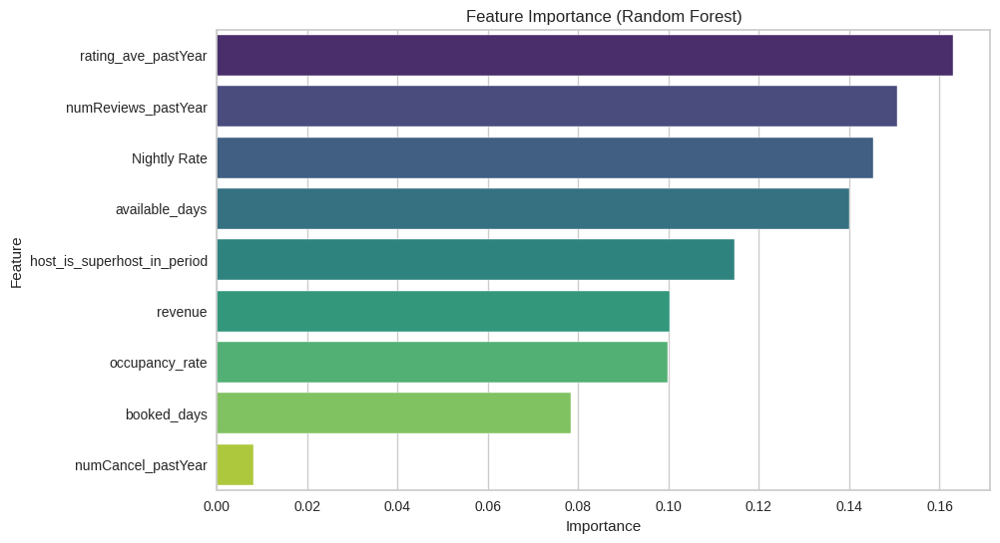

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [17:53:37] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



XGBoost Performance:
Accuracy: 0.9629
Precision: 0.5341
Recall: 0.2098
AUC-ROC: 0.9557

Classification Report:
               precision    recall  f1-score   support

         0.0       0.97      0.99      0.98     11297
         1.0       0.53      0.21      0.30       448

    accuracy                           0.96     11745
   macro avg       0.75      0.60      0.64     11745
weighted avg       0.95      0.96      0.96     11745



<ipython-input-10-c679ff781964>:109: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=feature_importance, x='Importance', y='Feature', palette='viridis')


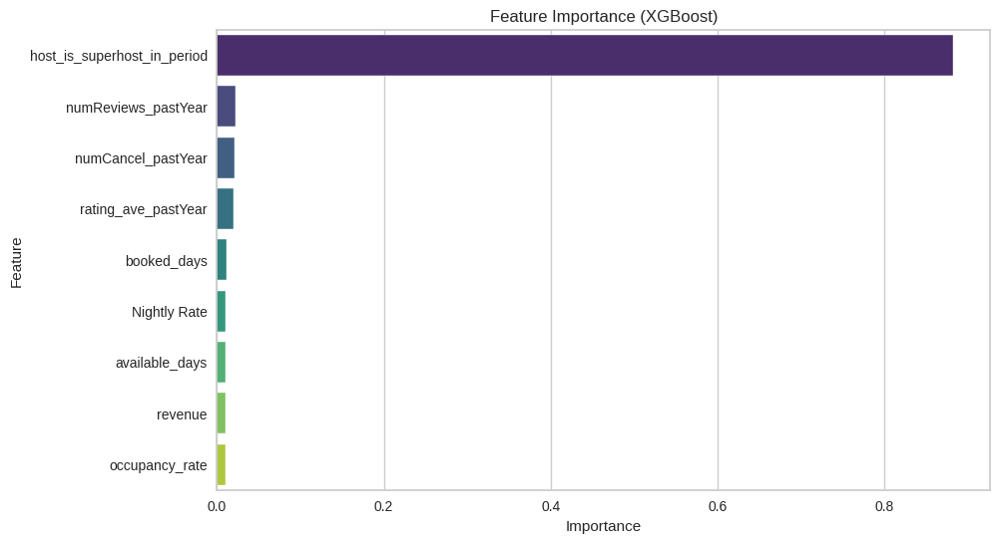

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 1044, number of negative: 26361
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002159 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1657
[LightGBM] [Info] Number of data points in the train set: 27405, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.038095 -> initscore=-3.228826
[LightGBM] [Info] Start training from score -3.228826

LightGBM Performance:
Accuracy: 0.9643
Precision: 0.6107
Recall: 0.1786
AUC-ROC: 0.9596

Classification Report:
               precision    recall  f1-score   support

         0.0       0.97      1.00      0.98     11297
         1.0       0.61      0.18      0.28       448

    accuracy                           0.96     11745
   macro avg       0.79      0.5

<ipython-input-10-c679ff781964>:109: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=feature_importance, x='Importance', y='Feature', palette='viridis')


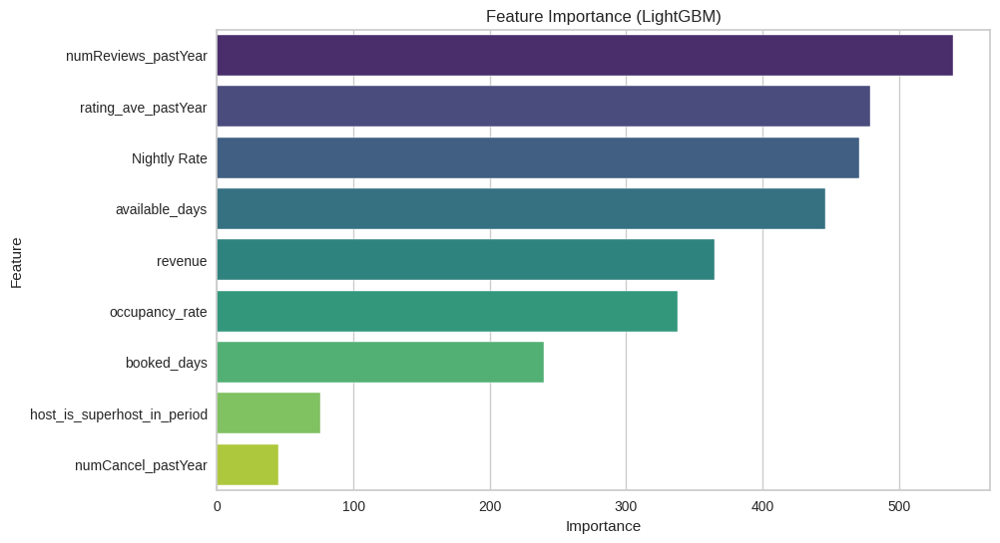


CatBoost Performance:
Accuracy: 0.9636
Precision: 0.5789
Recall: 0.1719
AUC-ROC: 0.9591

Classification Report:
               precision    recall  f1-score   support

         0.0       0.97      1.00      0.98     11297
         1.0       0.58      0.17      0.27       448

    accuracy                           0.96     11745
   macro avg       0.77      0.58      0.62     11745
weighted avg       0.95      0.96      0.95     11745



<ipython-input-10-c679ff781964>:109: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=feature_importance, x='Importance', y='Feature', palette='viridis')


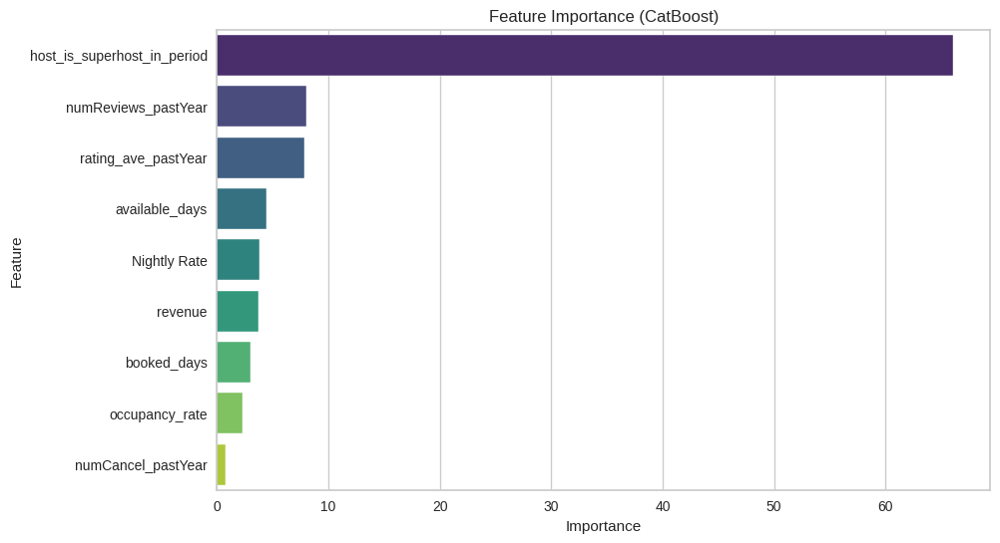


Model Performance Summary:
                 Model  Accuracy  Precision    Recall   AUC-ROC
3             LightGBM  0.964325   0.610687  0.178571  0.959579
4             CatBoost  0.963644   0.578947  0.171875  0.959084
2              XGBoost  0.962878   0.534091  0.209821  0.955727
1        Random Forest  0.965177   0.651163  0.187500  0.950689
0  Logistic Regression  0.961771   0.400000  0.004464  0.929285


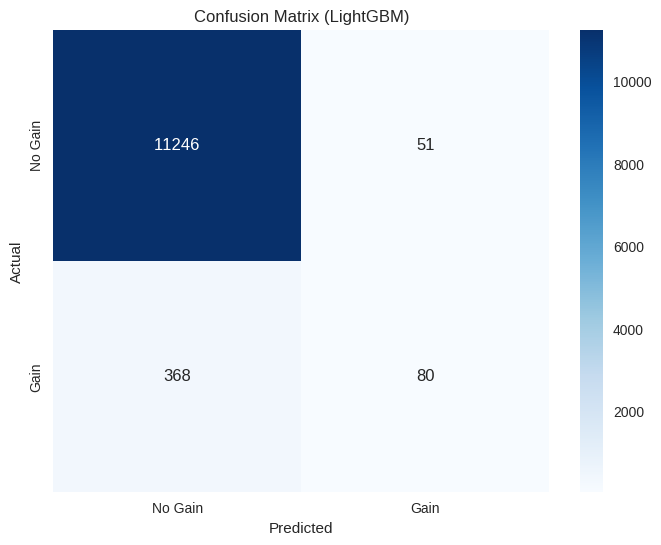

In [ ]:
# Install CatBoost if not already installed
try:
    from catboost import CatBoostClassifier
except ModuleNotFoundError:
    !pip install catboost
    from catboost import CatBoostClassifier

# Import libraries
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    roc_auc_score,
    classification_report,
    confusion_matrix
)
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = '/content/airbnb_Washington_final_preprocessed.csv'  # Adjust path if needed
airbnb_data = pd.read_csv(file_path)

# Define target variable and predictors
target = 'superhost_change_gain_superhost'
predictors = [
    'revenue', 'occupancy_rate', 'rating_ave_pastYear', 'numReviews_pastYear',
    'numCancel_pastYear', 'available_days', 'booked_days', 'Nightly Rate',
    'host_is_superhost_in_period'
]

# Ensure predictors are in the dataset
for col in predictors + [target]:
    if col not in airbnb_data.columns:
        raise ValueError(f"Required column {col} is missing from the dataset.")

# Drop rows with missing target
airbnb_data = airbnb_data.dropna(subset=[target])

# Display correlation matrix
correlation_matrix = airbnb_data[predictors].corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Correlation Matrix of Predictors")
plt.show()

# Split data into training and testing sets
X = airbnb_data[predictors]
y = airbnb_data[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

# Standardize features for models requiring scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize models
models = {
    "Logistic Regression": LogisticRegression(random_state=42),
    "Random Forest": RandomForestClassifier(random_state=42, n_estimators=100),
    "XGBoost": XGBClassifier(random_state=42, use_label_encoder=False, eval_metric="logloss"),
    "LightGBM": LGBMClassifier(random_state=42),
    "CatBoost": CatBoostClassifier(random_state=42, verbose=0)
}

# Train and evaluate models
results = []
for name, model in models.items():
    # Use scaled data for Logistic Regression, raw data for others
    if name == "Logistic Regression":
        model.fit(X_train_scaled, y_train)
        predictions = model.predict(X_test_scaled)
        probabilities = model.predict_proba(X_test_scaled)[:, 1]
    else:
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        probabilities = model.predict_proba(X_test)[:, 1]

    # Evaluate model
    accuracy = accuracy_score(y_test, predictions)
    precision = precision_score(y_test, predictions)
    recall = recall_score(y_test, predictions)
    auc = roc_auc_score(y_test, probabilities)
    results.append((name, accuracy, precision, recall, auc))

    # Print performance metrics
    print(f"\n{name} Performance:")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"AUC-ROC: {auc:.4f}")
    print("\nClassification Report:\n", classification_report(y_test, predictions))

    # Plot feature importance for tree-based models
    if name in ["Random Forest", "XGBoost", "LightGBM", "CatBoost"]:
        feature_importance = pd.DataFrame({
            'Feature': predictors,
            'Importance': model.feature_importances_
        }).sort_values(by='Importance', ascending=False)

        plt.figure(figsize=(10, 6))
        sns.barplot(data=feature_importance, x='Importance', y='Feature', palette='viridis')
        plt.title(f"Feature Importance ({name})")
        plt.xlabel("Importance")
        plt.ylabel("Feature")
        plt.show()

# Tabulate results
results_df = pd.DataFrame(results, columns=["Model", "Accuracy", "Precision", "Recall", "AUC-ROC"])
results_df = results_df.sort_values(by="AUC-ROC", ascending=False)

# Display results
print("\nModel Performance Summary:")
print(results_df)

# Visualize confusion matrix for the best model
best_model_name = results_df.iloc[0]['Model']
best_model = models[best_model_name]

if best_model_name == "Logistic Regression":
    best_predictions = best_model.predict(X_test_scaled)
else:
    best_predictions = best_model.predict(X_test)

conf_matrix = confusion_matrix(y_test, best_predictions)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['No Gain', 'Gain'], yticklabels=['No Gain', 'Gain'])
plt.title(f"Confusion Matrix ({best_model_name})")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# 7. Seasonality and Time-Based Trends-R

Goal: Analyze how demand varies over time.

Tasks:

Investigate seasonal trends in occupancy and revenue.

Analyze patterns in booking dates versus stay dates.

Use time series analysis to forecast future occupancy rates.

Output: Seasonal and time-based visualizations with insights for hosts to prepare for demand fluctuations.

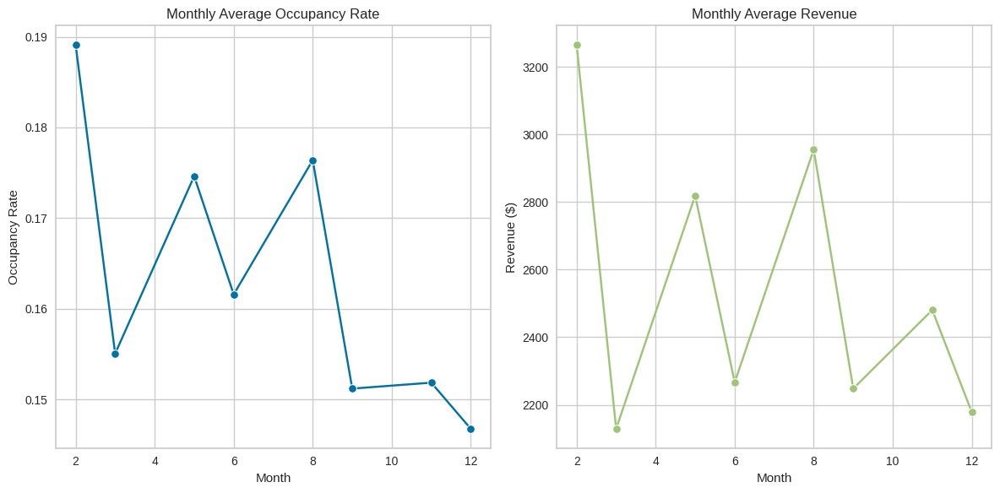

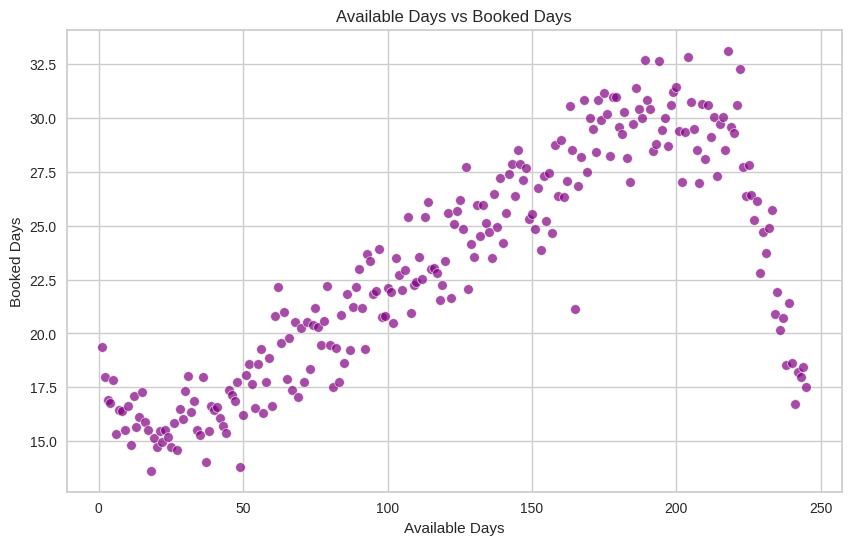

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


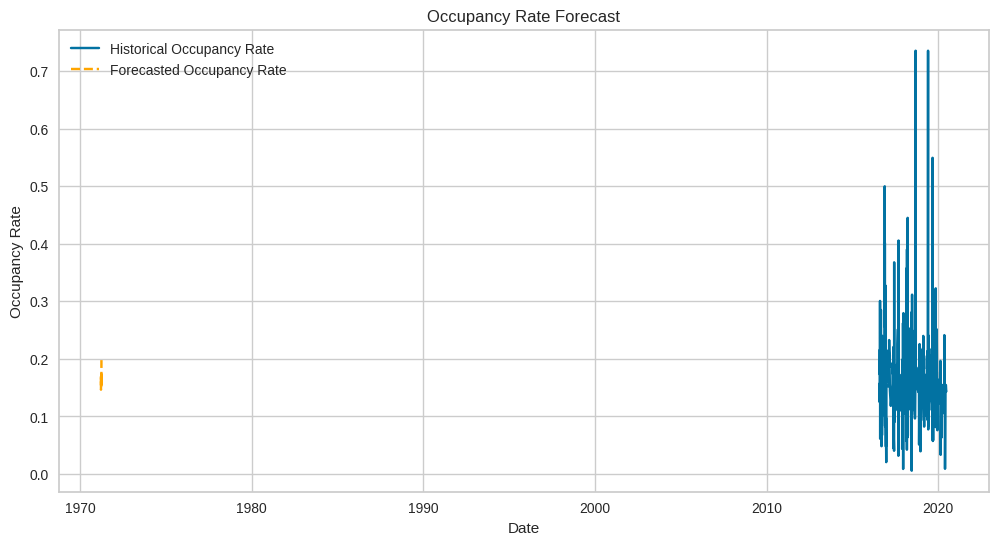

Insights for Hosts:
1. Seasonal trends show peak and low-demand months for better planning.
2. Booking patterns indicate how available days relate to booked days, guiding listing availability strategies.
3. Occupancy rate forecast provides a predictive view of upcoming demand fluctuations.


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.holtwinters import ExponentialSmoothing

# Load the dataset
file_path = '/content/airbnb_Washington_final_preprocessed.csv'  # Replace with actual path
airbnb_data = pd.read_csv(file_path)

# Filter relevant columns based on the dataset description
columns_to_use = [
    'Scraped Date', 'revenue', 'occupancy_rate', 'available_days',
    'booked_days', 'Nightly Rate'
]
airbnb_data = airbnb_data[columns_to_use]

# Ensure 'Scraped Date' is in datetime format
airbnb_data['Scraped Date'] = pd.to_datetime(airbnb_data['Scraped Date'])

# Filter data to include only entries after 2015
airbnb_data = airbnb_data[airbnb_data['Scraped Date'] > '2015-12-31']

# 1. Seasonal Trends in Occupancy Rate and Revenue
# Extract month and calculate monthly averages
airbnb_data['Month'] = airbnb_data['Scraped Date'].dt.month
monthly_trends = airbnb_data.groupby('Month').agg({
    'occupancy_rate': 'mean',
    'revenue': 'mean'
}).reset_index()

# Visualize seasonal trends
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.lineplot(data=monthly_trends, x='Month', y='occupancy_rate', marker='o', color='b')
plt.title('Monthly Average Occupancy Rate')
plt.xlabel('Month')
plt.ylabel('Occupancy Rate')

plt.subplot(1, 2, 2)
sns.lineplot(data=monthly_trends, x='Month', y='revenue', marker='o', color='g')
plt.title('Monthly Average Revenue')
plt.xlabel('Month')
plt.ylabel('Revenue ($)')
plt.tight_layout()
plt.show()

# 2. Patterns in Booking Days (e.g., booked_days vs available_days)
# Analyze relationship between available days and booked days
booking_trends = airbnb_data.groupby('available_days').agg({
    'booked_days': 'mean',
    'occupancy_rate': 'mean'
}).reset_index()

# Visualize booking trends
plt.figure(figsize=(10, 6))
sns.scatterplot(data=booking_trends, x='available_days', y='booked_days', color='purple', alpha=0.7)
plt.title('Available Days vs Booked Days')
plt.xlabel('Available Days')
plt.ylabel('Booked Days')
plt.show()

# 3. Time Series Analysis - Forecasting Future Occupancy Rates
# Group by date to calculate daily occupancy rates
daily_trends = airbnb_data.groupby('Scraped Date').agg({
    'occupancy_rate': 'mean'
}).reset_index()

# Set 'Scraped Date' as index for time series analysis
daily_trends.set_index('Scraped Date', inplace=True)

# Fit Exponential Smoothing model
model = ExponentialSmoothing(
    daily_trends['occupancy_rate'],
    trend='add',
    seasonal='add',
    seasonal_periods=12
)
fitted_model = model.fit()

# Forecast the next 12 periods (e.g., months or days)
forecast = fitted_model.forecast(steps=12)

# Plot the historical data and forecast
plt.figure(figsize=(12, 6))
plt.plot(daily_trends.index, daily_trends['occupancy_rate'], label='Historical Occupancy Rate')
plt.plot(forecast.index, forecast, label='Forecasted Occupancy Rate', color='orange', linestyle='--')
plt.title('Occupancy Rate Forecast')
plt.xlabel('Date')
plt.ylabel('Occupancy Rate')
plt.legend()
plt.show()

# Insights Output
print("Insights for Hosts:")
print("1. Seasonal trends show peak and low-demand months for better planning.")
print("2. Booking patterns indicate how available days relate to booked days, guiding listing availability strategies.")
print("3. Occupancy rate forecast provides a predictive view of upcoming demand fluctuations.")


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.holtwinters import ExponentialSmoothing

# Load the dataset
file_path = '/content/airbnb_Washington_final_preprocessed.csv'  # Replace with the actual path
airbnb_data = pd.read_csv(file_path)

# Select relevant columns
columns_to_use = [
    'Scraped Date', 'revenue', 'occupancy_rate', 'available_days',
    'booked_days', 'Nightly Rate', 'Created Date'
]
airbnb_data = airbnb_data[columns_to_use]

# Convert date columns to datetime format
airbnb_data['Scraped Date'] = pd.to_datetime(airbnb_data['Scraped Date'])
airbnb_data['Created Date'] = pd.to_datetime(airbnb_data['Created Date'])

# 1. Seasonal Trends in Occupancy and Revenue
# Extract month and calculate monthly averages
airbnb_data['Month'] = airbnb_data['Scraped Date'].dt.month
monthly_trends = airbnb_data.groupby('Month').agg({
    'occupancy_rate': 'mean',
    'revenue': 'mean'
}).reset_index()

# Visualize monthly trends
plt.figure(figsize=(14, 6))

# Occupancy Rate Trends
plt.subplot(1, 2, 1)
sns.lineplot(x='Month', y='occupancy_rate', data=monthly_trends, marker='o', color='b')
plt.title('Seasonal Trends in Occupancy Rate')
plt.xlabel('Month')
plt.ylabel('Average Occupancy Rate')
plt.xticks(range(1, 13), [
    'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
    'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'
])

# Revenue Trends
plt.subplot(1, 2, 2)
sns.lineplot(x='Month', y='revenue', data=monthly_trends, marker='o', color='g')
plt.title('Seasonal Trends in Revenue')
plt.xlabel('Month')
plt.ylabel('Average Revenue ($)')
plt.xticks(range(1, 13), [
    'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
    'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'
])

plt.tight_layout()
plt.show()

# 2. Analyze Patterns in Booking Dates vs Stay Dates
# Calculate booking lead time (difference between booking date and stay date)
airbnb_data['booking_lead_time'] = (airbnb_data['Scraped Date'] - airbnb_data['Created Date']).dt.days

# Group by booking lead time and calculate trends
lead_time_trends = airbnb_data.groupby('booking_lead_time').agg({
    'occupancy_rate': 'mean',
    'revenue': 'mean'
}).reset_index()

# Visualize booking lead time patterns
plt.figure(figsize=(10, 6))
sns.lineplot(x='booking_lead_time', y='occupancy_rate', data=lead_time_trends, color='purple', marker='o')
plt.title('Booking Lead Time vs Occupancy Rate')
plt.xlabel('Booking Lead Time (Days)')
plt.ylabel('Average Occupancy Rate')
plt.show()

# 3. Time Series Analysis to Forecast Future Occupancy Rates
# Group by Scraped Date for daily trends
daily_trends = airbnb_data.groupby('Scraped Date').agg({
    'occupancy_rate': 'mean'
}).reset_index()

# Set Scraped Date as the index
daily_trends.set_index('Scraped Date', inplace=True)

# Fit an Exponential Smoothing Model for forecasting
model = ExponentialSmoothing(
    daily_trends['occupancy_rate'],
    trend='add',
    seasonal='add',
    seasonal_periods=12
)
fitted_model = model.fit()

# Forecast the next 12 months
forecast = fitted_model.forecast(steps=12)

# Visualize the forecast
plt.figure(figsize=(12, 6))
plt.plot(daily_trends.index, daily_trends['occupancy_rate'], label='Historical Occupancy Rate', color='blue')
plt.plot(forecast.index, forecast, label='Forecasted Occupancy Rate', color='orange')
plt.title('Occupancy Rate Forecast')
plt.xlabel('Date')
plt.ylabel('Occupancy Rate')
plt.legend()
plt.tight_layout()
plt.show()

# Insights Output
print("Insights for Hosts:")
print("1. Seasonal trends show variations in occupancy and revenue, highlighting peak and off-peak months.")
print("2. Booking lead time analysis reveals patterns that can help optimize pricing strategies.")
print("3. Forecasting occupancy rates provides actionable insights to prepare for future demand fluctuations.")

ValueError: time data "Unknown" doesn't match format "%Y-%m-%d", at position 1393. You might want to try:
    - passing `format` if your strings have a consistent format;
    - passing `format='ISO8601'` if your strings are all ISO8601 but not necessarily in exactly the same format;
    - passing `format='mixed'`, and the format will be inferred for each element individually. You might want to use `dayfirst` alongside this.

<ipython-input-14-c7b6a8566063>:25: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_trends = daily_trends['occupancy_rate'].resample('M').mean()


<Figure size 1200x1000 with 0 Axes>

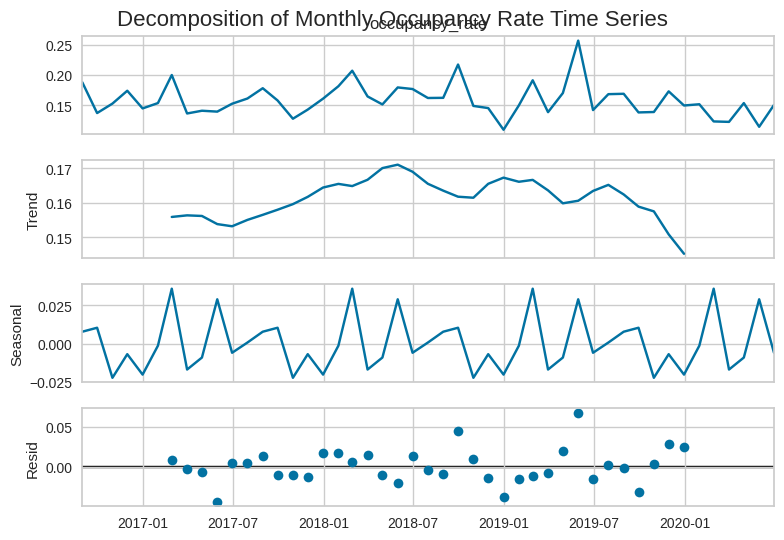

<Figure size 1000x600 with 0 Axes>

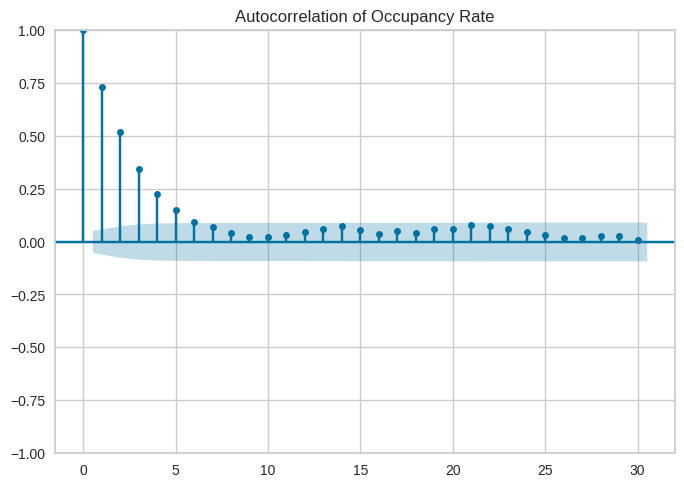

<Figure size 1000x600 with 0 Axes>

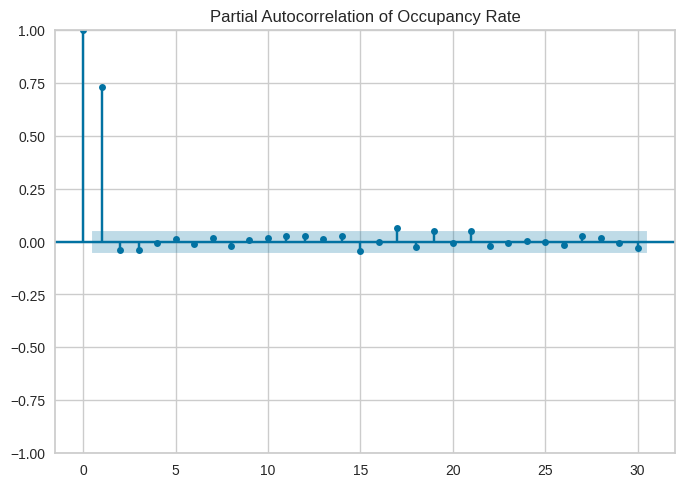

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


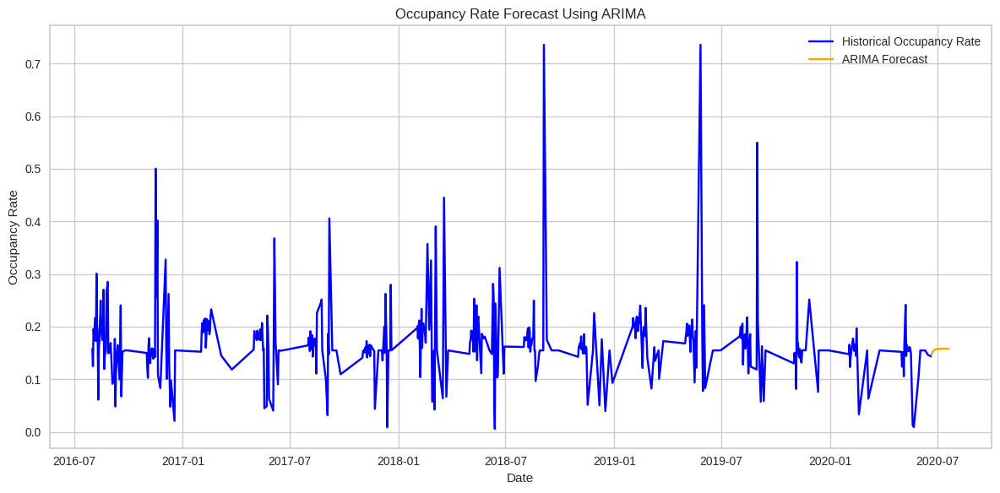

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
<ipython-input-14-c7b6a8566063>:67: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  forecast_index = pd.date_range(start=daily_trends.index[-1], periods=12, freq='M')


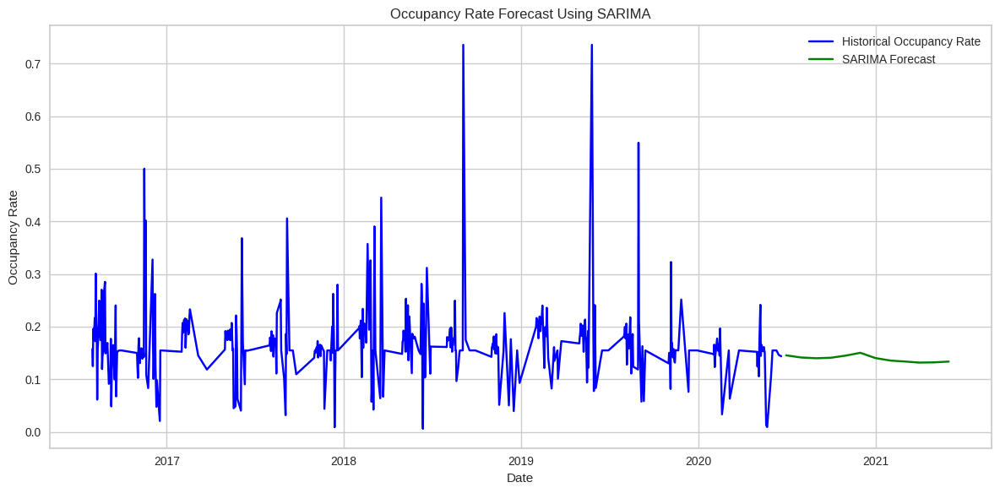

DEBUG:cmdstanpy:input tempfile: /tmp/tmpr8kxtro2/my_hkfpt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr8kxtro2/is5lvudo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=16388', 'data', 'file=/tmp/tmpr8kxtro2/my_hkfpt.json', 'init=/tmp/tmpr8kxtro2/is5lvudo.json', 'output', 'file=/tmp/tmpr8kxtro2/prophet_model9xjpzsk4/prophet_model-20241207175758.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:57:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:57:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


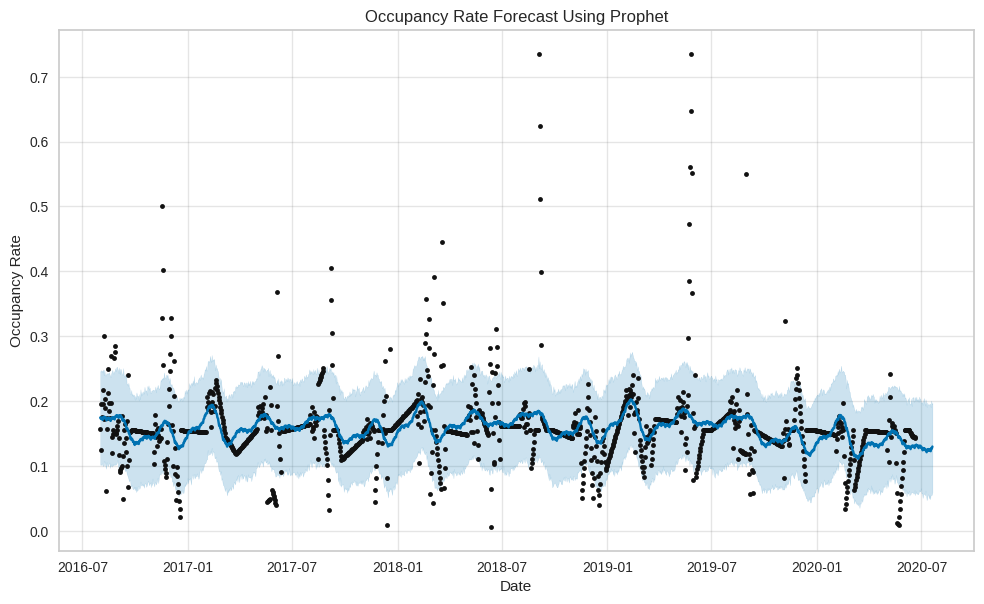

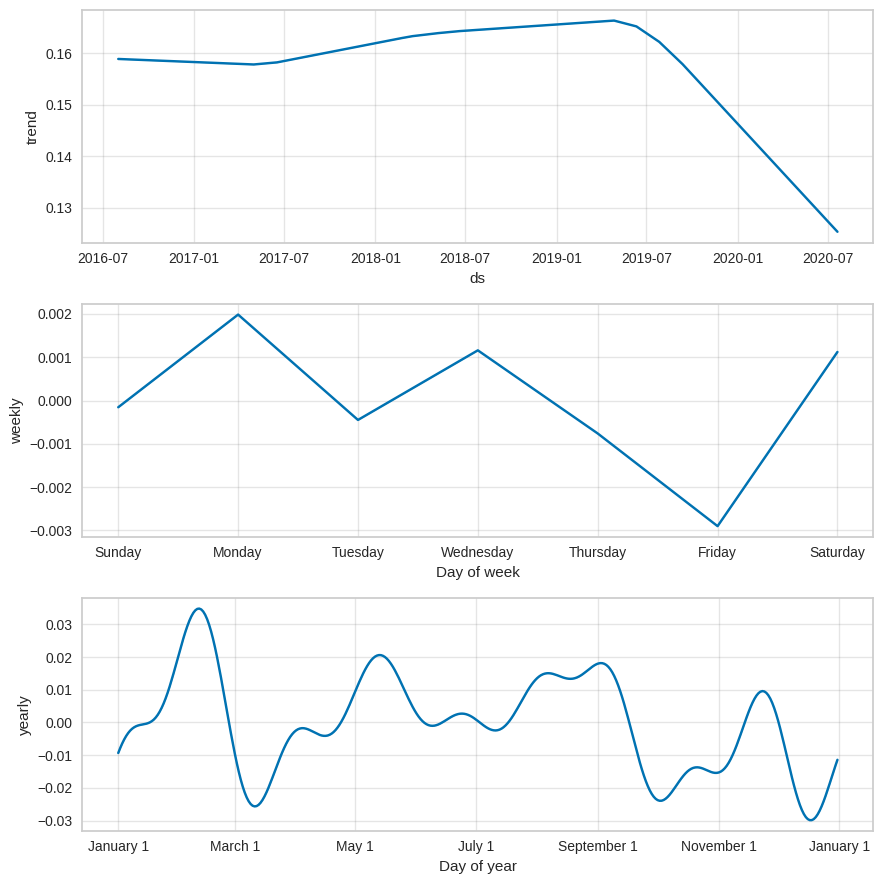

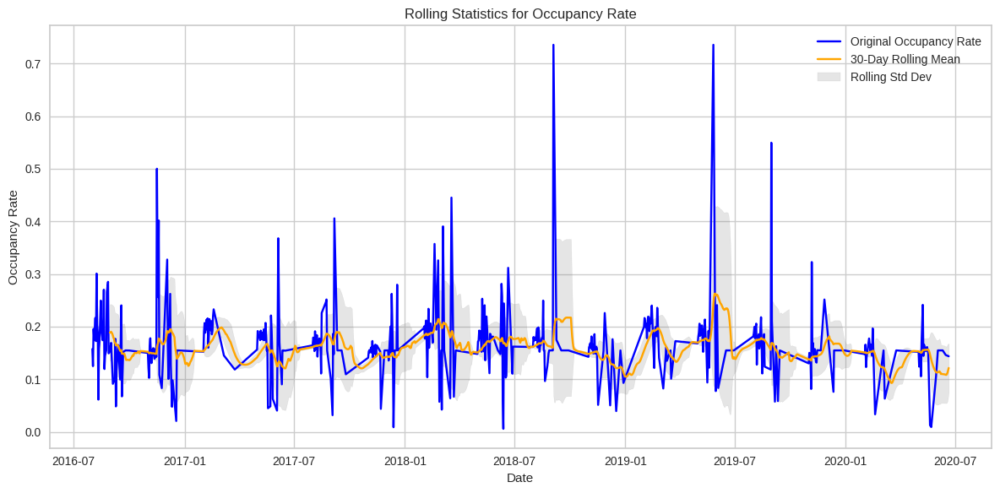

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from prophet import Prophet

# Load and prepare the dataset
file_path = '/content/airbnb_Washington_final_preprocessed.csv' # Replace with actual path
airbnb_data = pd.read_csv(file_path)

# Select relevant columns and convert dates
columns_to_use = ['Scraped Date', 'occupancy_rate']
airbnb_data = airbnb_data[columns_to_use]
airbnb_data['Scraped Date'] = pd.to_datetime(airbnb_data['Scraped Date'])

# Group by date for daily trends and ensure continuity
daily_trends = airbnb_data.groupby('Scraped Date').agg({'occupancy_rate': 'mean'})
daily_trends = daily_trends.asfreq('D')  # Ensure daily frequency
daily_trends['occupancy_rate'] = daily_trends['occupancy_rate'].interpolate(method='time')  # Fill missing values

# 1. Decomposition of Time Series
monthly_trends = daily_trends['occupancy_rate'].resample('M').mean()
decompose_result = seasonal_decompose(
    monthly_trends,
    model='additive',
    period=12  # Monthly seasonality
)
plt.figure(figsize=(12, 10))
decompose_result.plot()
plt.suptitle('Decomposition of Monthly Occupancy Rate Time Series', fontsize=16)
plt.show()

# 2. Autocorrelation and Partial Autocorrelation
plt.figure(figsize=(10, 6))
plot_acf(daily_trends['occupancy_rate'], lags=30, title='Autocorrelation of Occupancy Rate')
plt.show()

plt.figure(figsize=(10, 6))
plot_pacf(daily_trends['occupancy_rate'], lags=30, title='Partial Autocorrelation of Occupancy Rate')
plt.show()

# 3. ARIMA for Time Series Forecasting
arima_model = ARIMA(daily_trends['occupancy_rate'], order=(1, 1, 1))  # Adjust (p, d, q) as needed
arima_result = arima_model.fit()
arima_forecast = arima_result.forecast(steps=30)  # Forecast the next 30 days
plt.figure(figsize=(12, 6))
plt.plot(daily_trends.index, daily_trends['occupancy_rate'], label='Historical Occupancy Rate', color='blue')
plt.plot(arima_forecast.index, arima_forecast, label='ARIMA Forecast', color='orange')
plt.title('Occupancy Rate Forecast Using ARIMA')
plt.xlabel('Date')
plt.ylabel('Occupancy Rate')
plt.legend()
plt.tight_layout()
plt.show()

# 4. SARIMA for Time Series Forecasting
sarima_model = SARIMAX(
    daily_trends['occupancy_rate'],
    order=(1, 1, 1),
    seasonal_order=(1, 1, 1, 12)  # Adjust (p, d, q, s) for seasonality
)
sarima_result = sarima_model.fit()
sarima_forecast = sarima_result.get_forecast(steps=12)
forecast_index = pd.date_range(start=daily_trends.index[-1], periods=12, freq='M')
sarima_forecast_values = sarima_forecast.predicted_mean
plt.figure(figsize=(12, 6))
plt.plot(daily_trends.index, daily_trends['occupancy_rate'], label='Historical Occupancy Rate', color='blue')
plt.plot(forecast_index, sarima_forecast_values, label='SARIMA Forecast', color='green')
plt.title('Occupancy Rate Forecast Using SARIMA')
plt.xlabel('Date')
plt.ylabel('Occupancy Rate')
plt.legend()
plt.tight_layout()
plt.show()

# 5. Prophet for Time Series Forecasting
prophet_data = daily_trends.reset_index()
prophet_data.columns = ['ds', 'y']  # Rename columns for Prophet
prophet_model = Prophet(yearly_seasonality=True, daily_seasonality=False)
prophet_model.fit(prophet_data)
future = prophet_model.make_future_dataframe(periods=30)  # Forecast for the next 30 days
forecast = prophet_model.predict(future)
fig = prophet_model.plot(forecast)
plt.title('Occupancy Rate Forecast Using Prophet')
plt.xlabel('Date')
plt.ylabel('Occupancy Rate')
plt.show()

# Plot Prophet components
fig_components = prophet_model.plot_components(forecast)
plt.show()

# 6. Rolling Statistics for Long-Term Trends
daily_trends['rolling_mean'] = daily_trends['occupancy_rate'].rolling(window=30).mean()
daily_trends['rolling_std'] = daily_trends['occupancy_rate'].rolling(window=30).std()
plt.figure(figsize=(12, 6))
plt.plot(daily_trends.index, daily_trends['occupancy_rate'], label='Original Occupancy Rate', color='blue')
plt.plot(daily_trends.index, daily_trends['rolling_mean'], label='30-Day Rolling Mean', color='orange')
plt.fill_between(
    daily_trends.index,
    daily_trends['rolling_mean'] - daily_trends['rolling_std'],
    daily_trends['rolling_mean'] + daily_trends['rolling_std'],
    color='gray', alpha=0.2, label='Rolling Std Dev'
)
plt.title('Rolling Statistics for Occupancy Rate')
plt.xlabel('Date')
plt.ylabel('Occupancy Rate')
plt.legend()
plt.tight_layout()
plt.show()


<ipython-input-20-6e16db5bbefd>:25: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_trends = daily_trends['revenue'].resample('M').mean()


<Figure size 1200x1000 with 0 Axes>

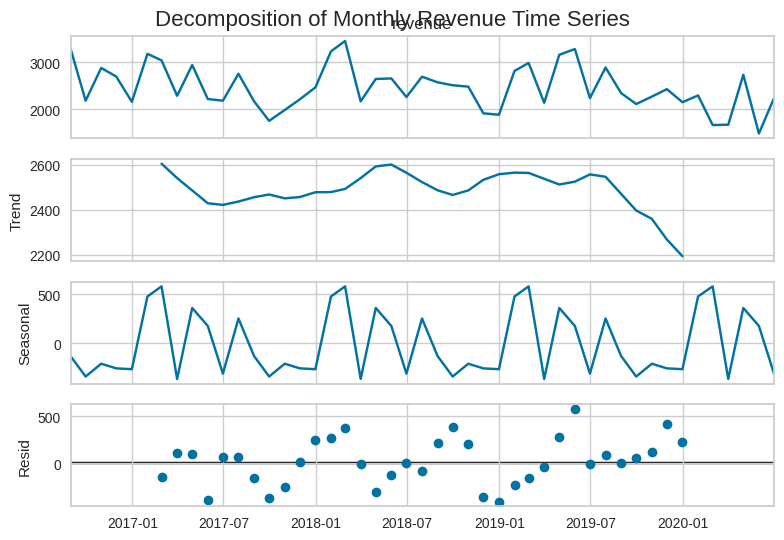

<Figure size 1000x600 with 0 Axes>

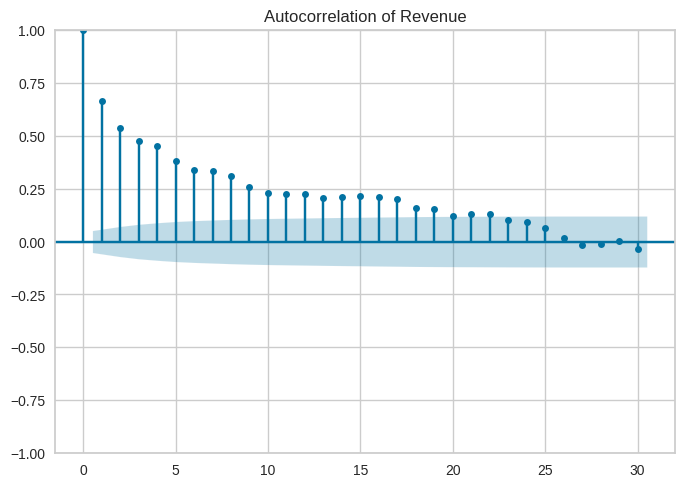

<Figure size 1000x600 with 0 Axes>

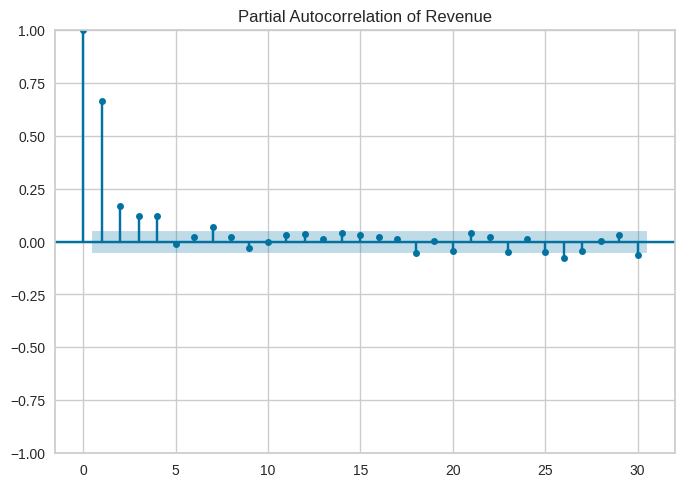

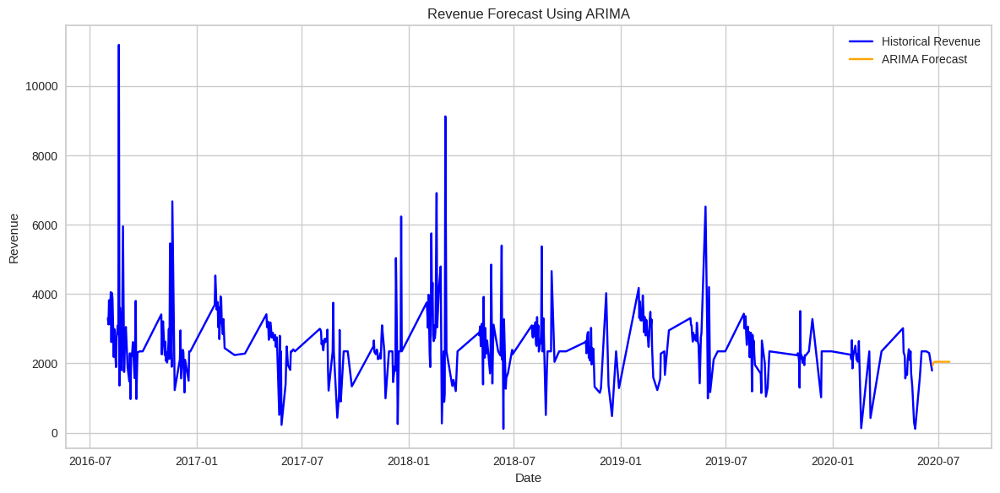

<ipython-input-20-6e16db5bbefd>:67: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  forecast_index = pd.date_range(start=daily_trends.index[-1], periods=12, freq='M')


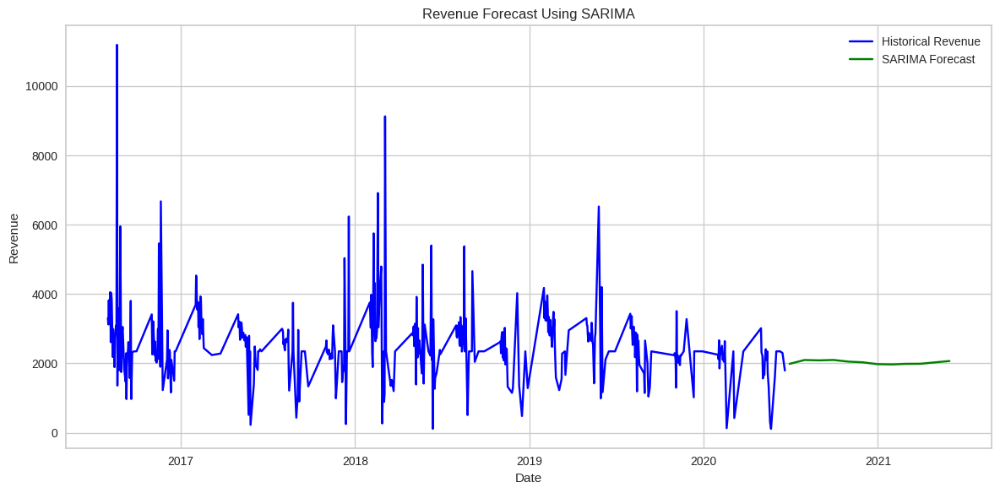

DEBUG:cmdstanpy:input tempfile: /tmp/tmpr8kxtro2/jdxlj5uu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr8kxtro2/ih34kpa5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=93479', 'data', 'file=/tmp/tmpr8kxtro2/jdxlj5uu.json', 'init=/tmp/tmpr8kxtro2/ih34kpa5.json', 'output', 'file=/tmp/tmpr8kxtro2/prophet_modelcpe4lu1w/prophet_model-20241207200047.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:00:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
20:00:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


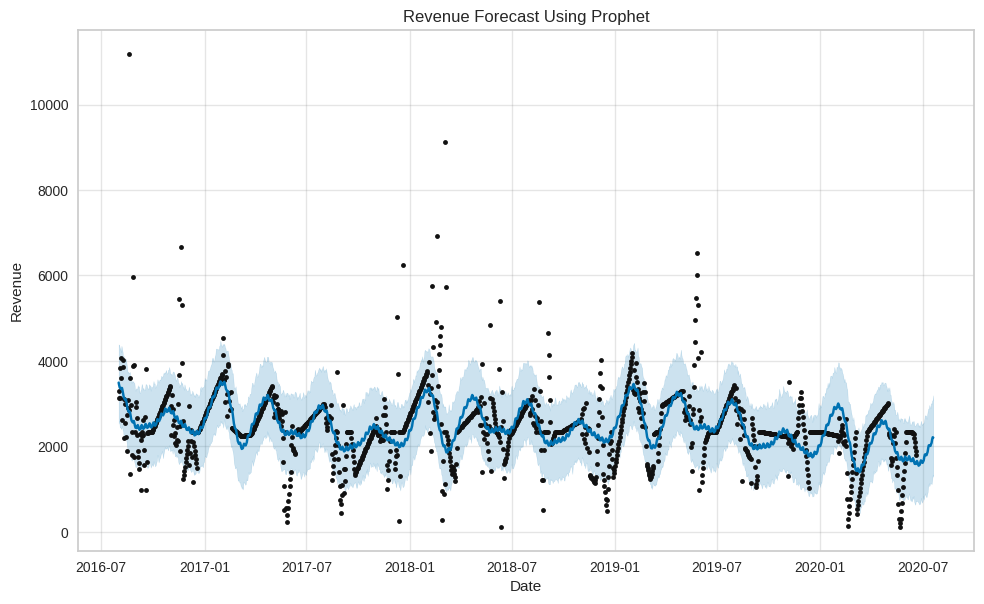

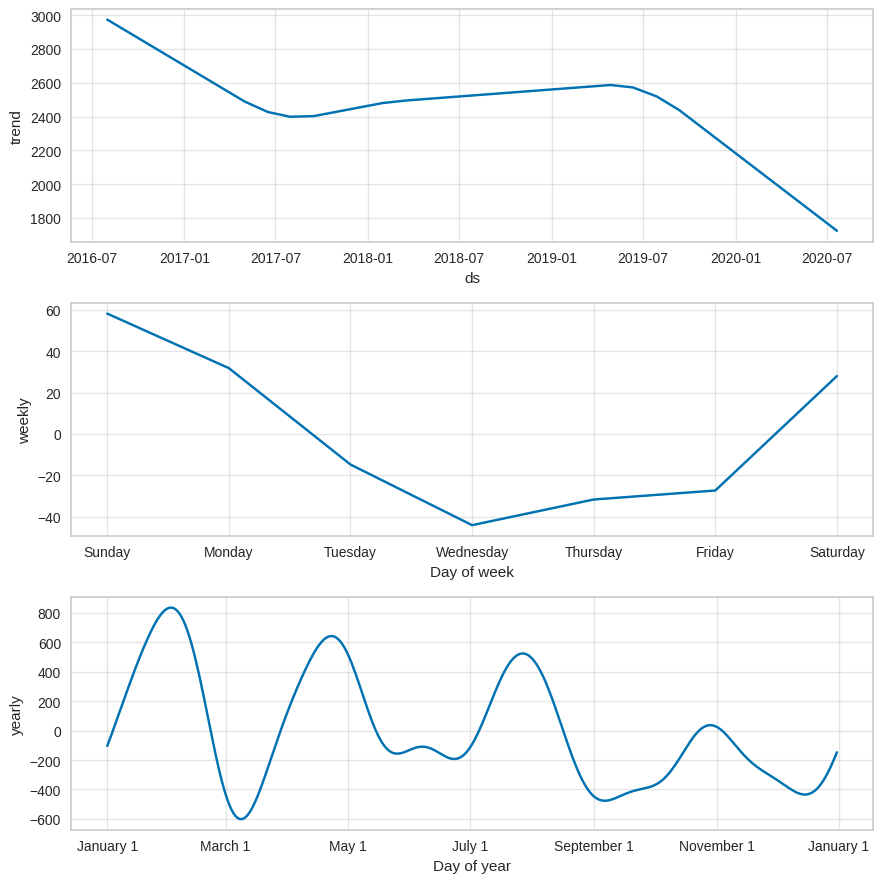

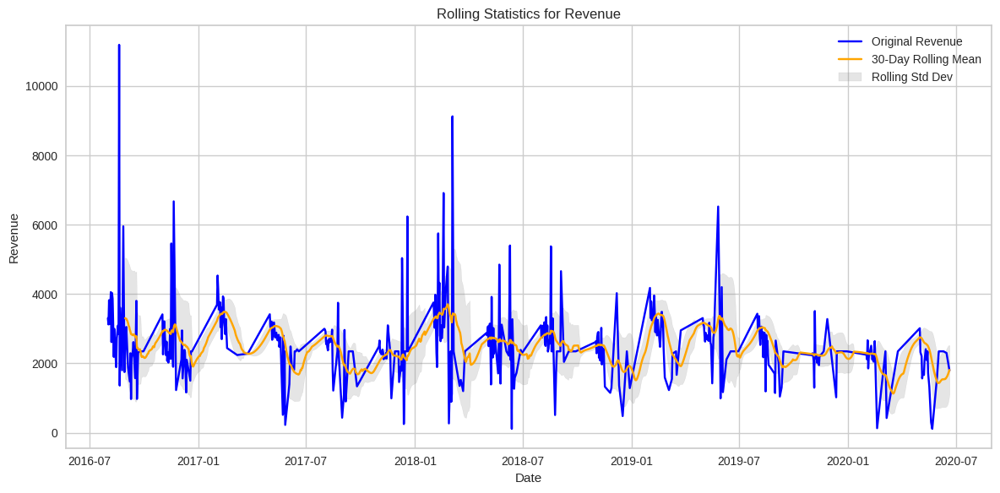

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from prophet import Prophet

# Load and prepare the dataset
file_path = '/content/airbnb_Washington_final_preprocessed.csv'  # Replace with actual path
airbnb_data = pd.read_csv(file_path)

# Select relevant columns and convert dates
columns_to_use = ['Scraped Date', 'revenue']
airbnb_data = airbnb_data[columns_to_use]
airbnb_data['Scraped Date'] = pd.to_datetime(airbnb_data['Scraped Date'])

# Group by date for daily trends and ensure continuity
daily_trends = airbnb_data.groupby('Scraped Date').agg({'revenue': 'mean'})
daily_trends = daily_trends.asfreq('D')  # Ensure daily frequency
daily_trends['revenue'] = daily_trends['revenue'].interpolate(method='time')  # Fill missing values

# 1. Decomposition of Time Series
monthly_trends = daily_trends['revenue'].resample('M').mean()
decompose_result = seasonal_decompose(
    monthly_trends,
    model='additive',
    period=12  # Monthly seasonality
)
plt.figure(figsize=(12, 10))
decompose_result.plot()
plt.suptitle('Decomposition of Monthly Revenue Time Series', fontsize=16)
plt.show()

# 2. Autocorrelation and Partial Autocorrelation
plt.figure(figsize=(10, 6))
plot_acf(daily_trends['revenue'], lags=30, title='Autocorrelation of Revenue')
plt.show()

plt.figure(figsize=(10, 6))
plot_pacf(daily_trends['revenue'], lags=30, title='Partial Autocorrelation of Revenue')
plt.show()

# 3. ARIMA for Time Series Forecasting
arima_model = ARIMA(daily_trends['revenue'], order=(1, 1, 1))  # Adjust (p, d, q) as needed
arima_result = arima_model.fit()
arima_forecast = arima_result.forecast(steps=30)  # Forecast the next 30 days
plt.figure(figsize=(12, 6))
plt.plot(daily_trends.index, daily_trends['revenue'], label='Historical Revenue', color='blue')
plt.plot(arima_forecast.index, arima_forecast, label='ARIMA Forecast', color='orange')
plt.title('Revenue Forecast Using ARIMA')
plt.xlabel('Date')
plt.ylabel('Revenue')
plt.legend()
plt.tight_layout()
plt.show()

# 4. SARIMA for Time Series Forecasting
sarima_model = SARIMAX(
    daily_trends['revenue'],
    order=(1, 1, 1),
    seasonal_order=(1, 1, 1, 12)  # Adjust (p, d, q, s) for seasonality
)
sarima_result = sarima_model.fit()
sarima_forecast = sarima_result.get_forecast(steps=12)
forecast_index = pd.date_range(start=daily_trends.index[-1], periods=12, freq='M')
sarima_forecast_values = sarima_forecast.predicted_mean
plt.figure(figsize=(12, 6))
plt.plot(daily_trends.index, daily_trends['revenue'], label='Historical Revenue', color='blue')
plt.plot(forecast_index, sarima_forecast_values, label='SARIMA Forecast', color='green')
plt.title('Revenue Forecast Using SARIMA')
plt.xlabel('Date')
plt.ylabel('Revenue')
plt.legend()
plt.tight_layout()
plt.show()

# 5. Prophet for Time Series Forecasting
prophet_data = daily_trends.reset_index()
prophet_data.columns = ['ds', 'y']  # Rename columns for Prophet
prophet_model = Prophet(yearly_seasonality=True, daily_seasonality=False)
prophet_model.fit(prophet_data)
future = prophet_model.make_future_dataframe(periods=30)  # Forecast for the next 30 days
forecast = prophet_model.predict(future)
fig = prophet_model.plot(forecast)
plt.title('Revenue Forecast Using Prophet')
plt.xlabel('Date')
plt.ylabel('Revenue')
plt.show()

# Plot Prophet components
fig_components = prophet_model.plot_components(forecast)
plt.show()

# 6. Rolling Statistics for Long-Term Trends
daily_trends['rolling_mean'] = daily_trends['revenue'].rolling(window=30).mean()
daily_trends['rolling_std'] = daily_trends['revenue'].rolling(window=30).std()
plt.figure(figsize=(12, 6))
plt.plot(daily_trends.index, daily_trends['revenue'], label='Original Revenue', color='blue')
plt.plot(daily_trends.index, daily_trends['rolling_mean'], label='30-Day Rolling Mean', color='orange')
plt.fill_between(
    daily_trends.index,
    daily_trends['rolling_mean'] - daily_trends['rolling_std'],
    daily_trends['rolling_mean'] + daily_trends['rolling_std'],
    color='gray', alpha=0.2, label='Rolling Std Dev'
)
plt.title('Rolling Statistics for Revenue')
plt.xlabel('Date')
plt.ylabel('Revenue')
plt.legend()
plt.tight_layout()
plt.show()

<ipython-input-21-b73608d36e8e>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_trends = daily_trends['num_superhosts'].resample('M').mean()


<Figure size 1200x1000 with 0 Axes>

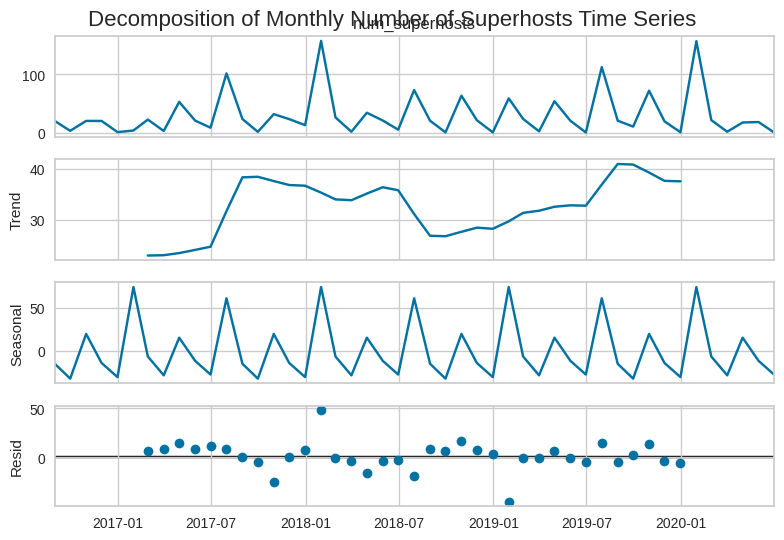

<Figure size 1000x600 with 0 Axes>

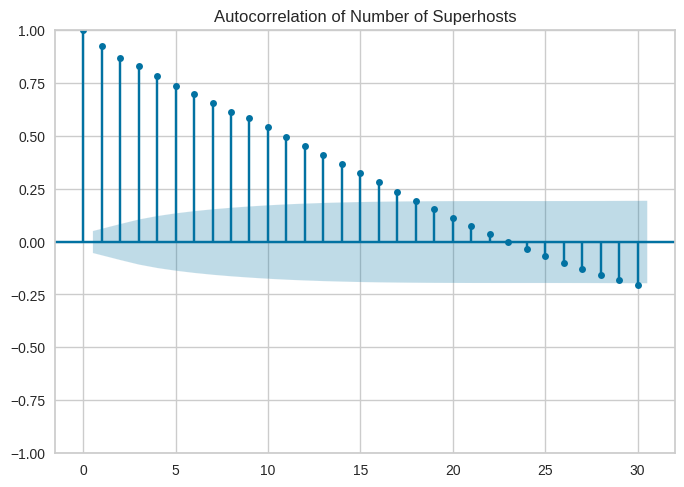

<Figure size 1000x600 with 0 Axes>

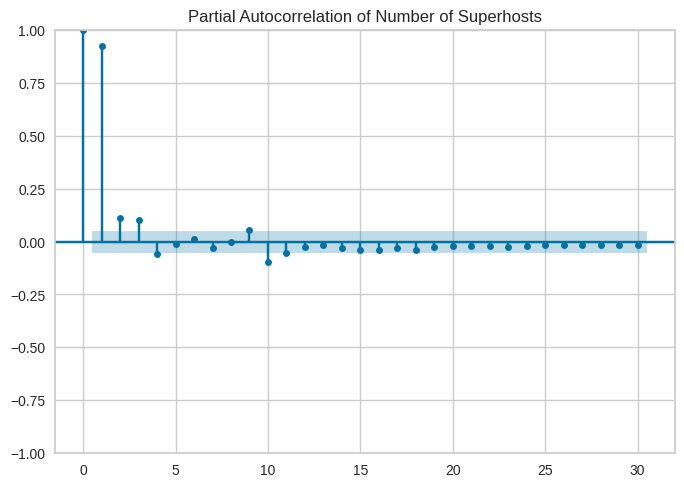

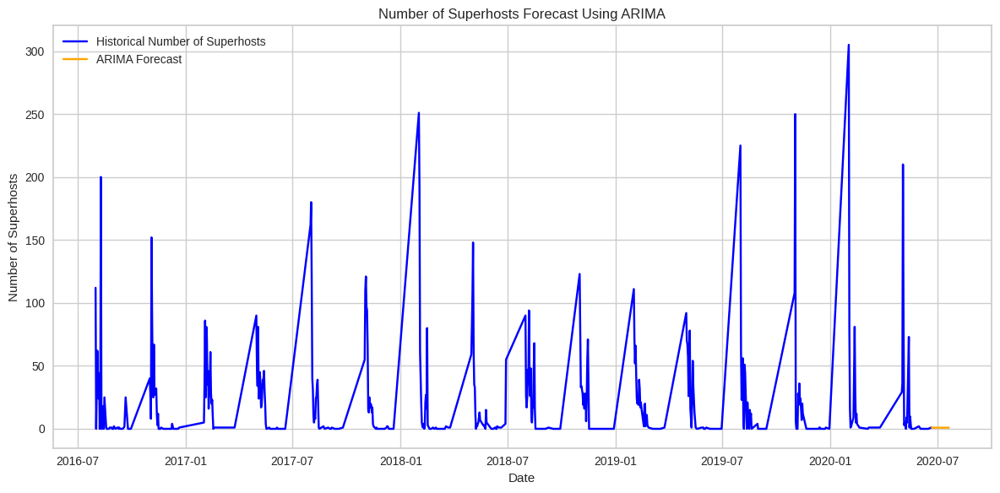

<ipython-input-21-b73608d36e8e>:68: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  forecast_index = pd.date_range(start=daily_trends.index[-1], periods=12, freq='M')


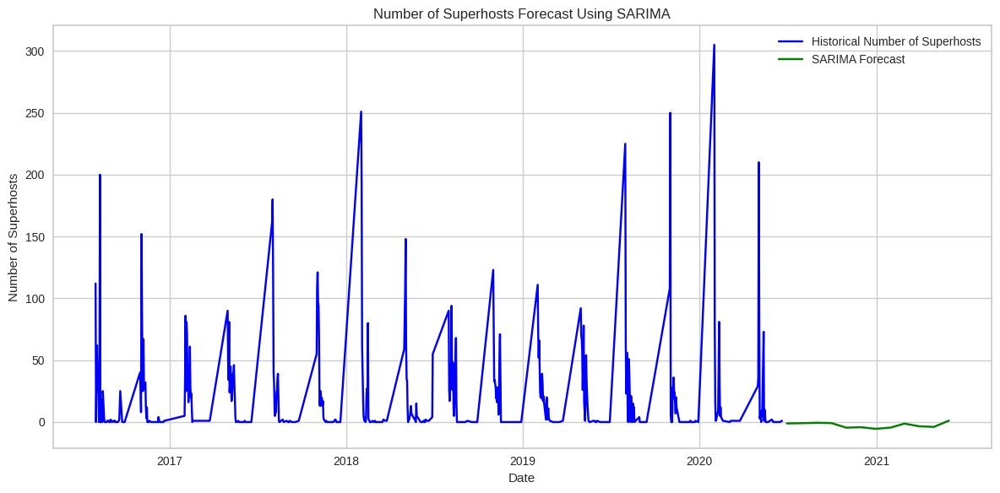

DEBUG:cmdstanpy:input tempfile: /tmp/tmpr8kxtro2/zqwrd9lw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr8kxtro2/4ojjj7an.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=87431', 'data', 'file=/tmp/tmpr8kxtro2/zqwrd9lw.json', 'init=/tmp/tmpr8kxtro2/4ojjj7an.json', 'output', 'file=/tmp/tmpr8kxtro2/prophet_model1xqtx9qb/prophet_model-20241207200436.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:04:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
20:04:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


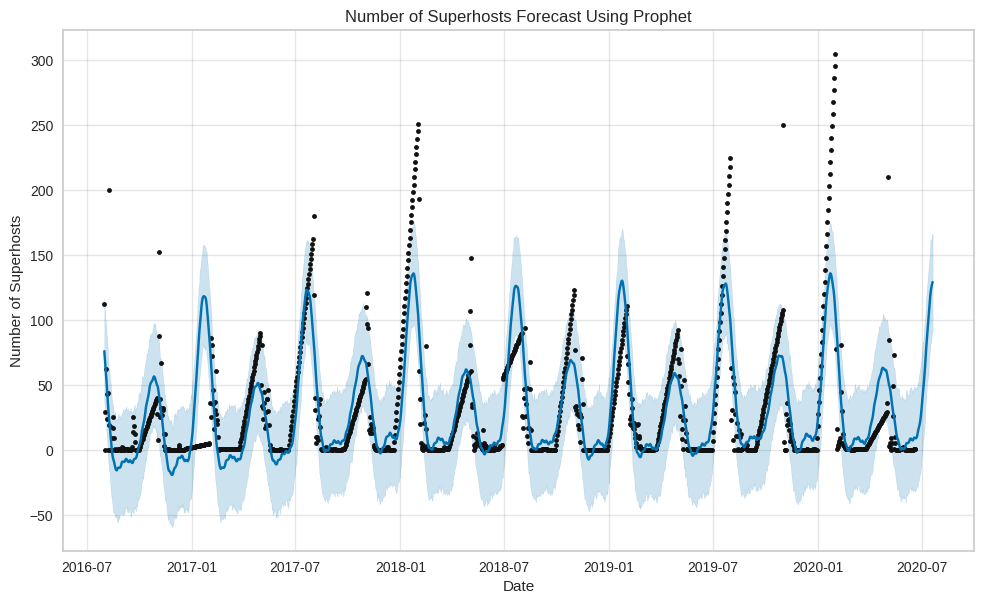

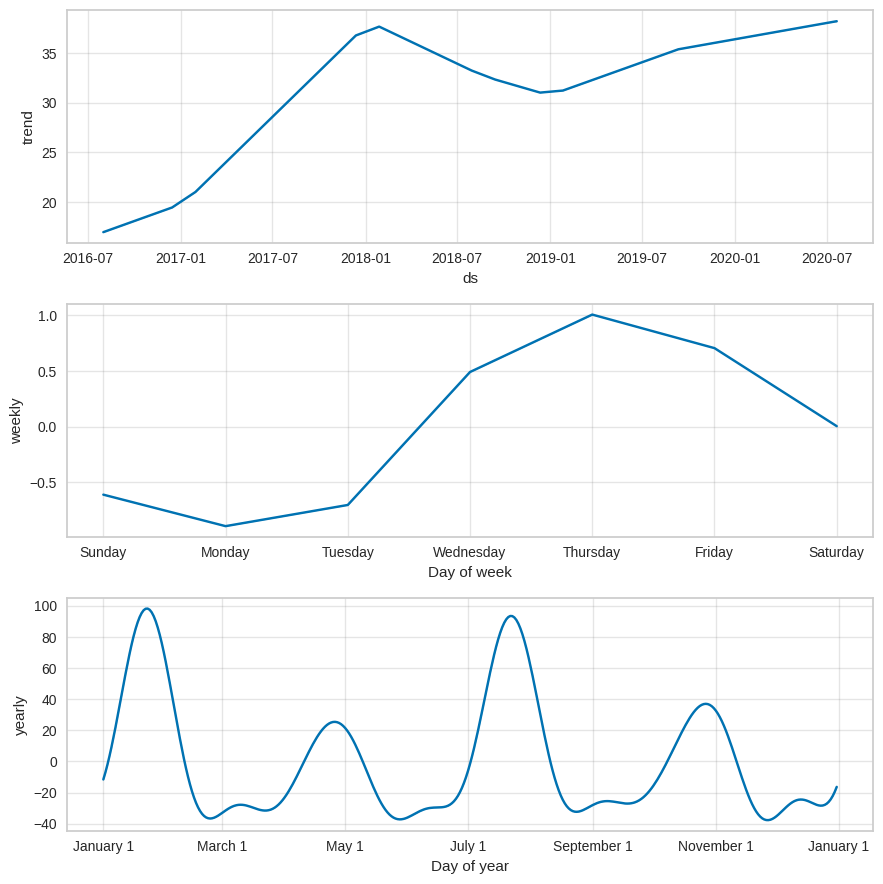

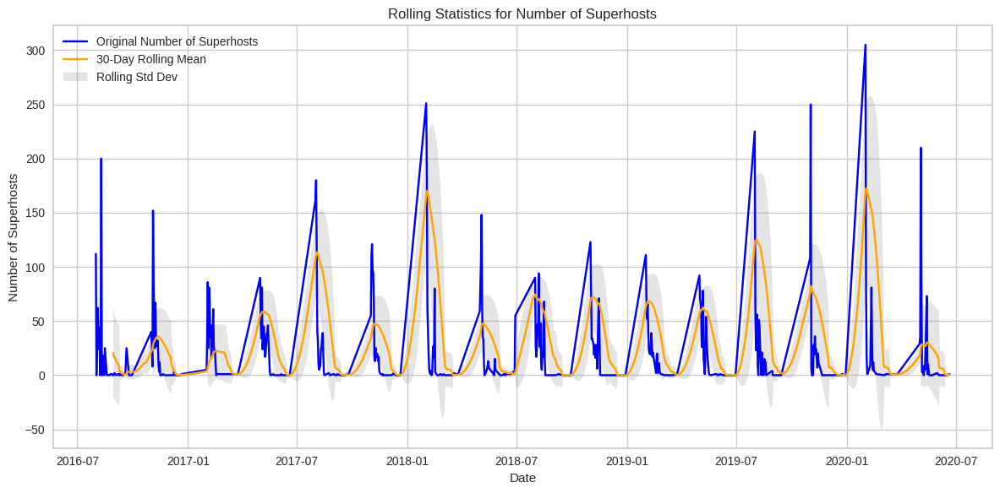

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from prophet import Prophet

# Load and prepare the dataset
file_path = '/content/airbnb_Washington_final_preprocessed.csv'  # Replace with actual path
airbnb_data = pd.read_csv(file_path)

# Select relevant columns and convert dates
columns_to_use = ['Scraped Date', 'host_is_superhost_in_period']
airbnb_data = airbnb_data[columns_to_use]
airbnb_data['Scraped Date'] = pd.to_datetime(airbnb_data['Scraped Date'])

# Group by date to calculate the number of superhosts
daily_trends = airbnb_data.groupby('Scraped Date').agg({'host_is_superhost_in_period': 'sum'})
daily_trends.rename(columns={'host_is_superhost_in_period': 'num_superhosts'}, inplace=True)
daily_trends = daily_trends.asfreq('D')  # Ensure daily frequency
daily_trends['num_superhosts'] = daily_trends['num_superhosts'].interpolate(method='time')  # Fill missing values

# 1. Decomposition of Time Series
monthly_trends = daily_trends['num_superhosts'].resample('M').mean()
decompose_result = seasonal_decompose(
    monthly_trends,
    model='additive',
    period=12  # Monthly seasonality
)
plt.figure(figsize=(12, 10))
decompose_result.plot()
plt.suptitle('Decomposition of Monthly Number of Superhosts Time Series', fontsize=16)
plt.show()

# 2. Autocorrelation and Partial Autocorrelation
plt.figure(figsize=(10, 6))
plot_acf(daily_trends['num_superhosts'], lags=30, title='Autocorrelation of Number of Superhosts')
plt.show()

plt.figure(figsize=(10, 6))
plot_pacf(daily_trends['num_superhosts'], lags=30, title='Partial Autocorrelation of Number of Superhosts')
plt.show()

# 3. ARIMA for Time Series Forecasting
arima_model = ARIMA(daily_trends['num_superhosts'], order=(1, 1, 1))  # Adjust (p, d, q) as needed
arima_result = arima_model.fit()
arima_forecast = arima_result.forecast(steps=30)  # Forecast the next 30 days
plt.figure(figsize=(12, 6))
plt.plot(daily_trends.index, daily_trends['num_superhosts'], label='Historical Number of Superhosts', color='blue')
plt.plot(arima_forecast.index, arima_forecast, label='ARIMA Forecast', color='orange')
plt.title('Number of Superhosts Forecast Using ARIMA')
plt.xlabel('Date')
plt.ylabel('Number of Superhosts')
plt.legend()
plt.tight_layout()
plt.show()

# 4. SARIMA for Time Series Forecasting
sarima_model = SARIMAX(
    daily_trends['num_superhosts'],
    order=(1, 1, 1),
    seasonal_order=(1, 1, 1, 12)  # Adjust (p, d, q, s) for seasonality
)
sarima_result = sarima_model.fit()
sarima_forecast = sarima_result.get_forecast(steps=12)
forecast_index = pd.date_range(start=daily_trends.index[-1], periods=12, freq='M')
sarima_forecast_values = sarima_forecast.predicted_mean
plt.figure(figsize=(12, 6))
plt.plot(daily_trends.index, daily_trends['num_superhosts'], label='Historical Number of Superhosts', color='blue')
plt.plot(forecast_index, sarima_forecast_values, label='SARIMA Forecast', color='green')
plt.title('Number of Superhosts Forecast Using SARIMA')
plt.xlabel('Date')
plt.ylabel('Number of Superhosts')
plt.legend()
plt.tight_layout()
plt.show()

# 5. Prophet for Time Series Forecasting
prophet_data = daily_trends.reset_index()
prophet_data.columns = ['ds', 'y']  # Rename columns for Prophet
prophet_model = Prophet(yearly_seasonality=True, daily_seasonality=False)
prophet_model.fit(prophet_data)
future = prophet_model.make_future_dataframe(periods=30)  # Forecast for the next 30 days
forecast = prophet_model.predict(future)
fig = prophet_model.plot(forecast)
plt.title('Number of Superhosts Forecast Using Prophet')
plt.xlabel('Date')
plt.ylabel('Number of Superhosts')
plt.show()

# Plot Prophet components
fig_components = prophet_model.plot_components(forecast)
plt.show()

# 6. Rolling Statistics for Long-Term Trends
daily_trends['rolling_mean'] = daily_trends['num_superhosts'].rolling(window=30).mean()
daily_trends['rolling_std'] = daily_trends['num_superhosts'].rolling(window=30).std()
plt.figure(figsize=(12, 6))
plt.plot(daily_trends.index, daily_trends['num_superhosts'], label='Original Number of Superhosts', color='blue')
plt.plot(daily_trends.index, daily_trends['rolling_mean'], label='30-Day Rolling Mean', color='orange')
plt.fill_between(
    daily_trends.index,
    daily_trends['rolling_mean'] - daily_trends['rolling_std'],
    daily_trends['rolling_mean'] + daily_trends['rolling_std'],
    color='gray', alpha=0.2, label='Rolling Std Dev'
)
plt.title('Rolling Statistics for Number of Superhosts')
plt.xlabel('Date')
plt.ylabel('Number of Superhosts')
plt.legend()
plt.tight_layout()
plt.show()

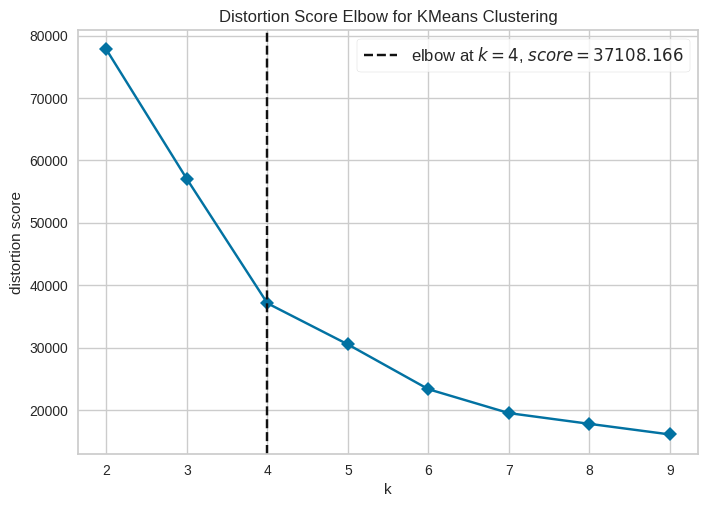

Clustering completed. Dataset now includes 'Cluster' column.


In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

# Select features for clustering
features = ['Nightly Rate', 'available_days', 'host_is_superhost_in_period']

# Ensure selected features exist in the dataset
if not all(feature in airbnb_data.columns for feature in features):
    raise ValueError("One or more selected features are missing from the dataset.")

# Extract data for clustering
clustering_data = airbnb_data[features]

# Standardize the data
scaler = StandardScaler()
clustering_data_scaled = scaler.fit_transform(clustering_data)

# Determine the optimal number of clusters using the Elbow Method
model = KMeans(random_state=42)
visualizer = KElbowVisualizer(model, k=(2, 10), metric='distortion', timings=False)
visualizer.fit(clustering_data_scaled)
visualizer.show()

# Fit KMeans with the optimal number of clusters
optimal_clusters = visualizer.elbow_value_
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42)
airbnb_data['Cluster'] = kmeans.fit_predict(clustering_data_scaled)

# Save the clustered dataset (optional)
airbnb_data.to_csv('/content/airbnb_Washington_clustered.csv', index=False)
print("Clustering completed. Dataset now includes 'Cluster' column.")


Analyzing Cluster 0

Decomposing Occupancy Rate for Cluster 0...


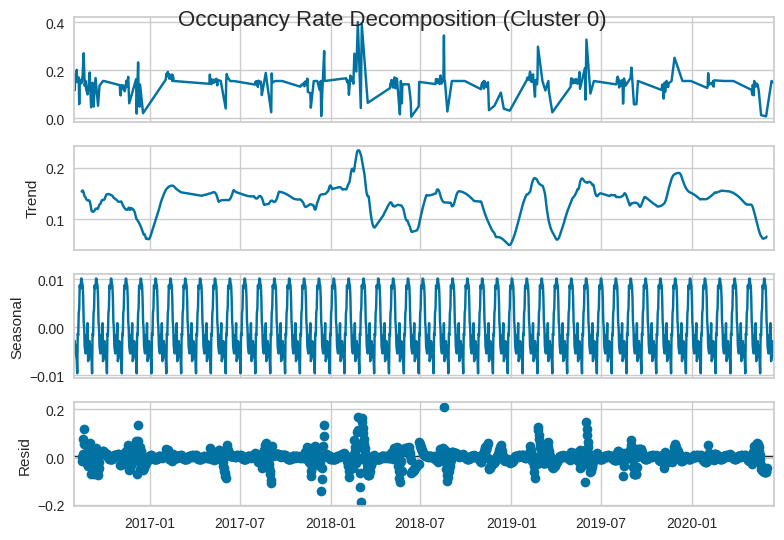

<Figure size 1000x600 with 0 Axes>

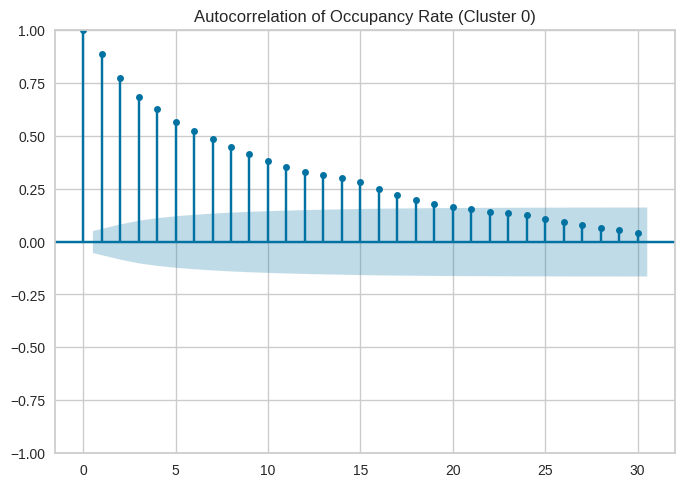

<Figure size 1000x600 with 0 Axes>

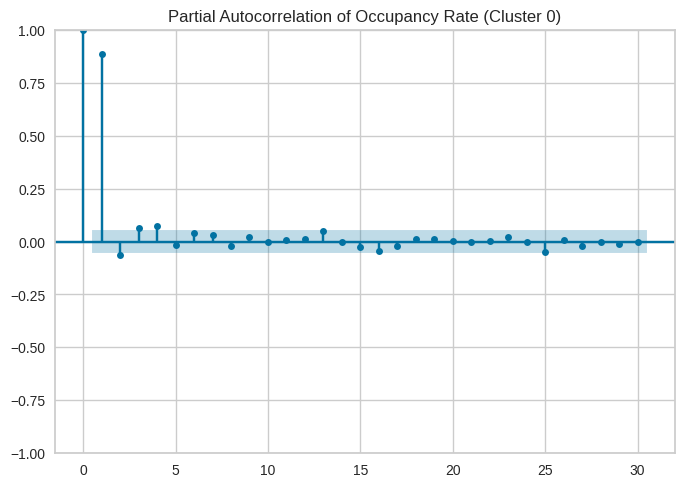


Forecasting Occupancy Rate with ARIMA for Cluster 0...


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


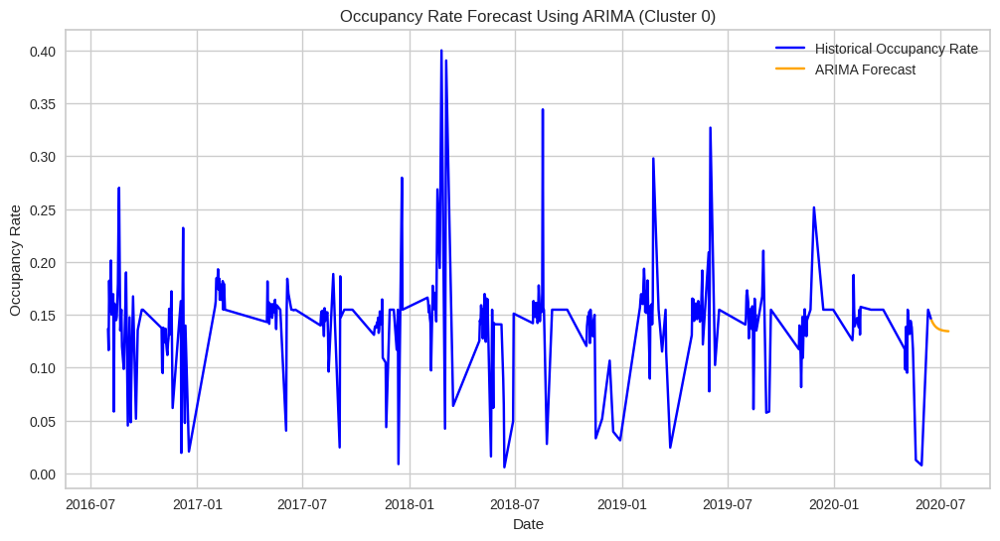

DEBUG:cmdstanpy:input tempfile: /tmp/tmpr8kxtro2/um7we0cs.json



Forecasting Occupancy Rate with Prophet for Cluster 0...


DEBUG:cmdstanpy:input tempfile: /tmp/tmpr8kxtro2/ns46q0di.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=68133', 'data', 'file=/tmp/tmpr8kxtro2/um7we0cs.json', 'init=/tmp/tmpr8kxtro2/ns46q0di.json', 'output', 'file=/tmp/tmpr8kxtro2/prophet_modellcxx5whf/prophet_model-20241207202853.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:28:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
20:28:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


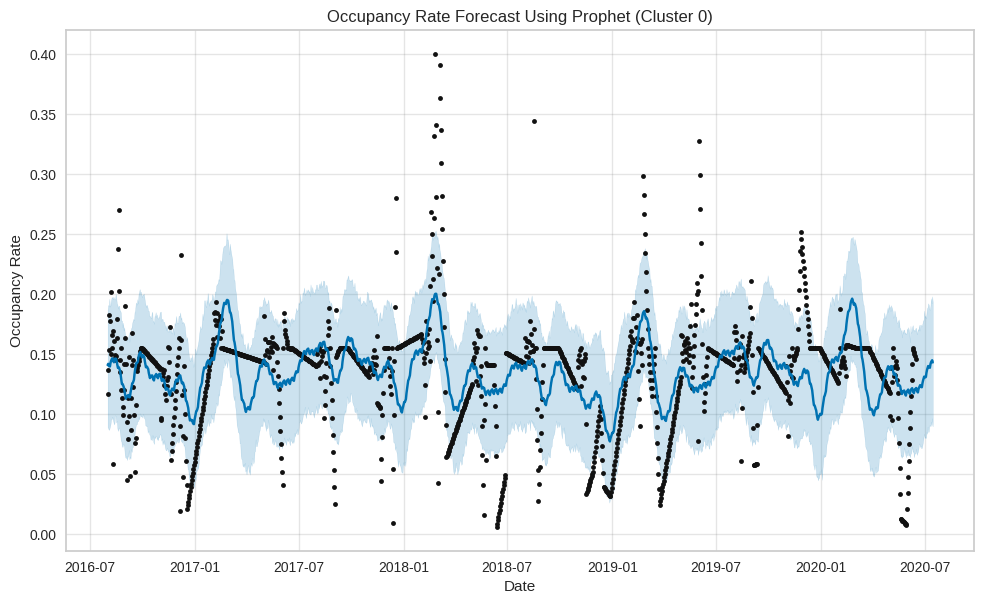


Decomposing Revenue for Cluster 0...


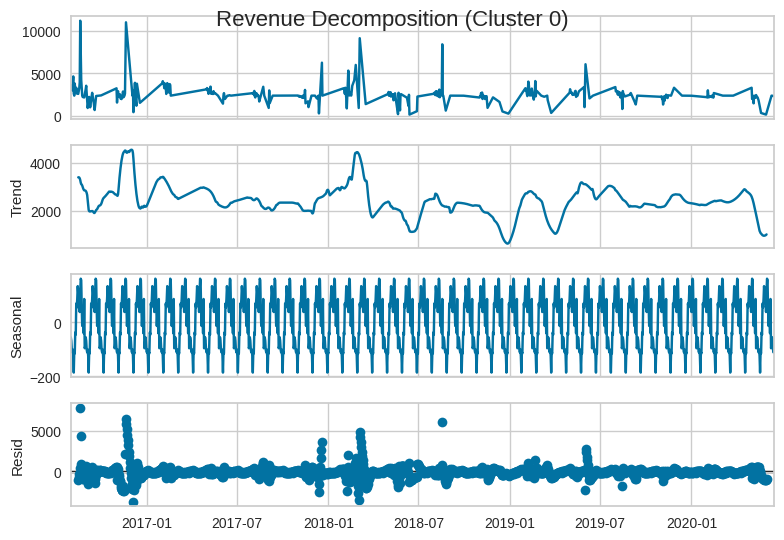

<Figure size 1000x600 with 0 Axes>

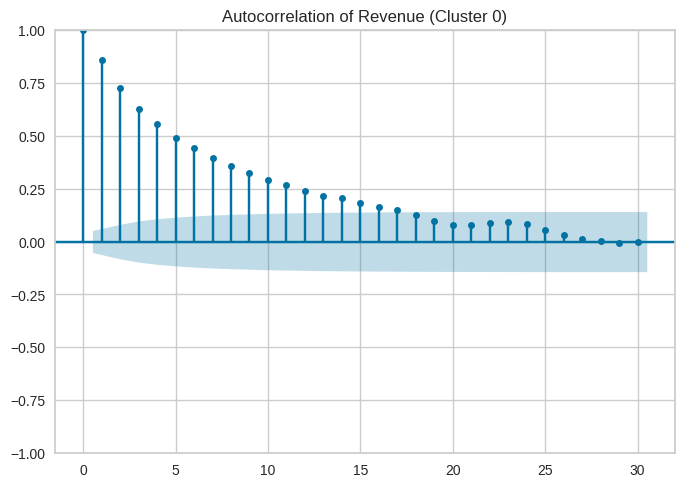

<Figure size 1000x600 with 0 Axes>

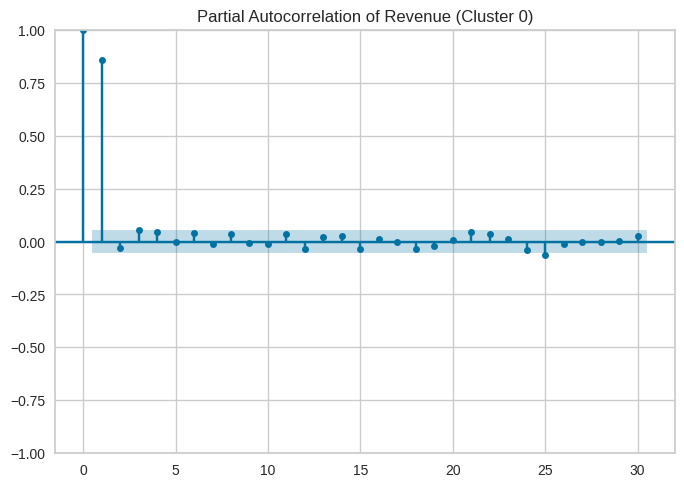


Forecasting Revenue with ARIMA for Cluster 0...


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


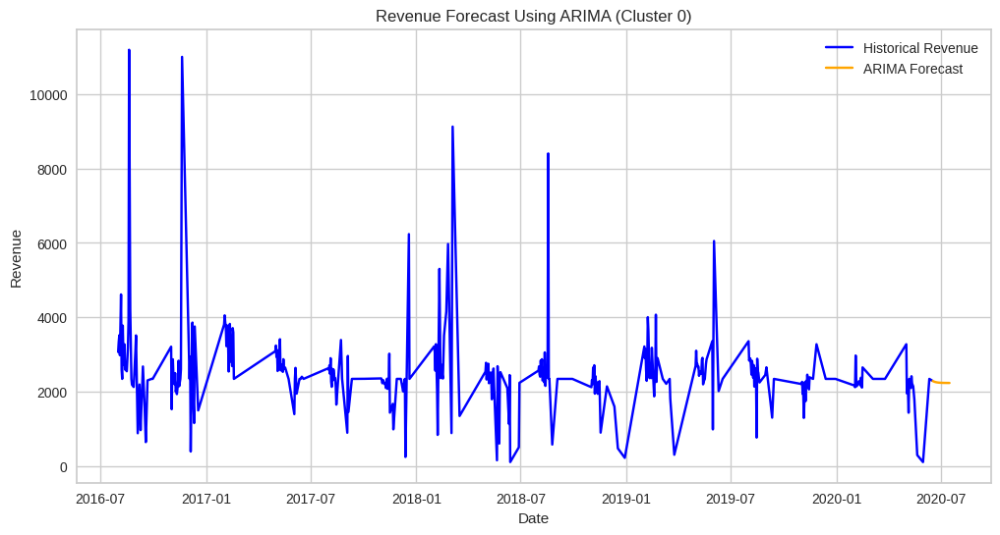

DEBUG:cmdstanpy:input tempfile: /tmp/tmpr8kxtro2/_z3_9fi3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr8kxtro2/ry4blnb7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92905', 'data', 'file=/tmp/tmpr8kxtro2/_z3_9fi3.json', 'init=/tmp/tmpr8kxtro2/ry4blnb7.json', 'output', 'file=/tmp/tmpr8kxtro2/prophet_modelz16omrir/prophet_model-20241207202900.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:29:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing



Forecasting Revenue with Prophet for Cluster 0...


20:29:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


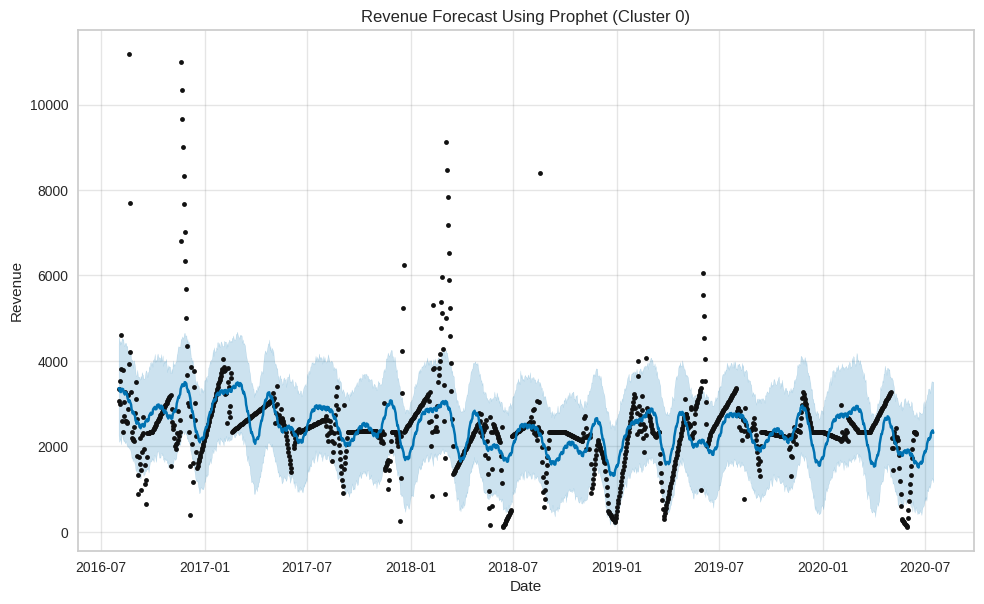


Decomposing Number of Superhosts for Cluster 0...


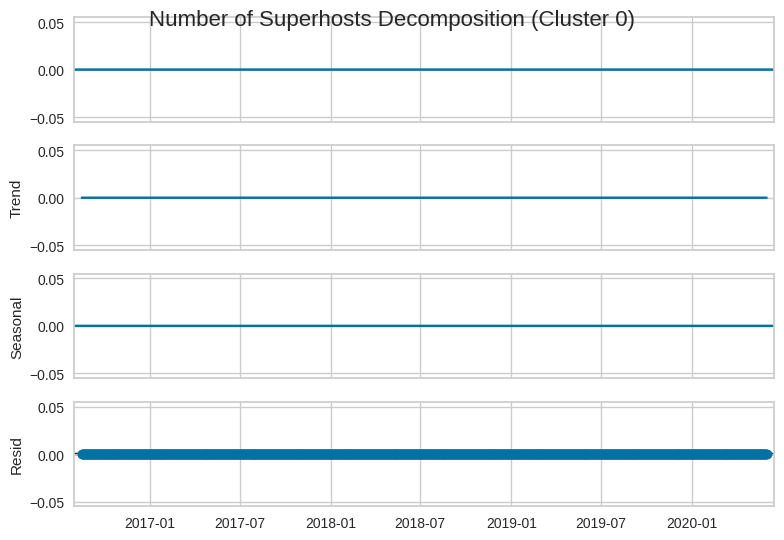

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]


<Figure size 1000x600 with 0 Axes>

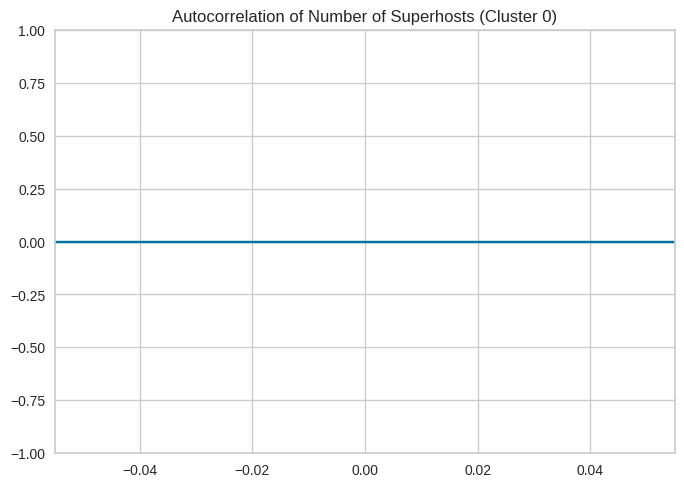

/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1490: ValueWarning: Matrix is singular. Using pinv.
  warnings.warn("Matrix is singular. Using pinv.", ValueWarning)


<Figure size 1000x600 with 0 Axes>

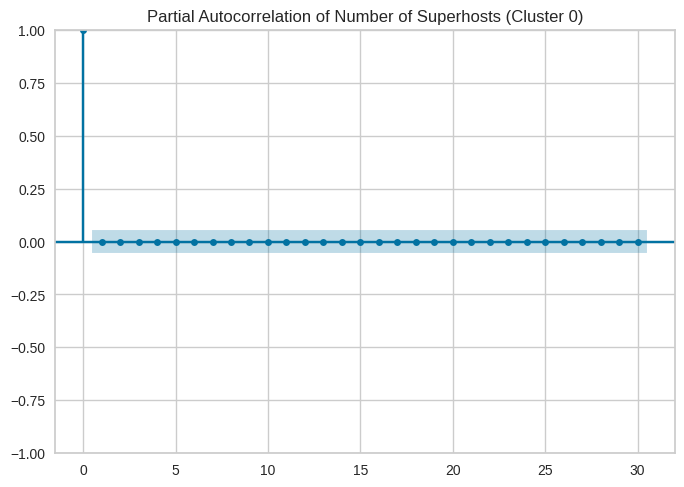


Forecasting Number of Superhosts with ARIMA for Cluster 0...


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


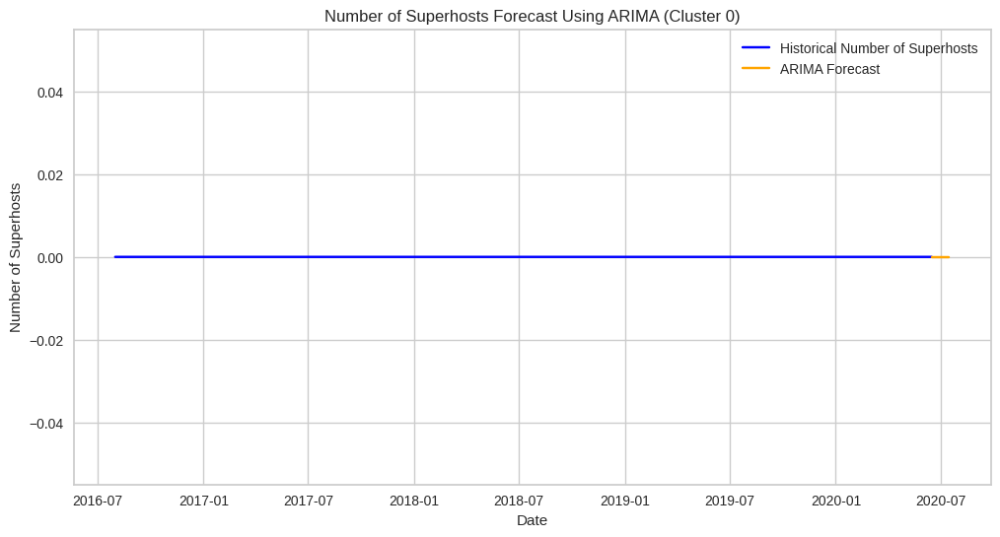


Forecasting Number of Superhosts with Prophet for Cluster 0...


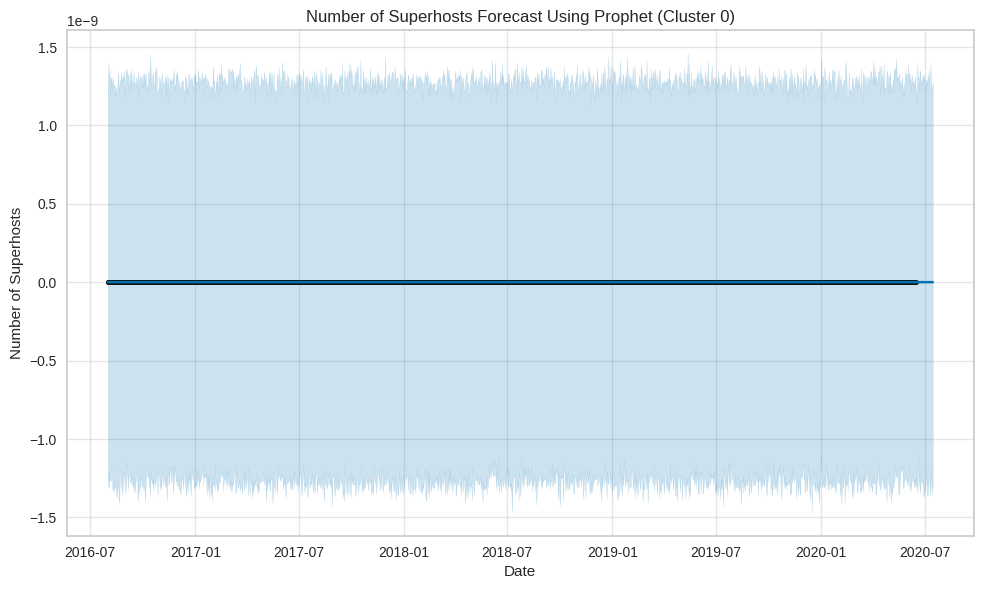


Analyzing Cluster 2

Decomposing Occupancy Rate for Cluster 2...


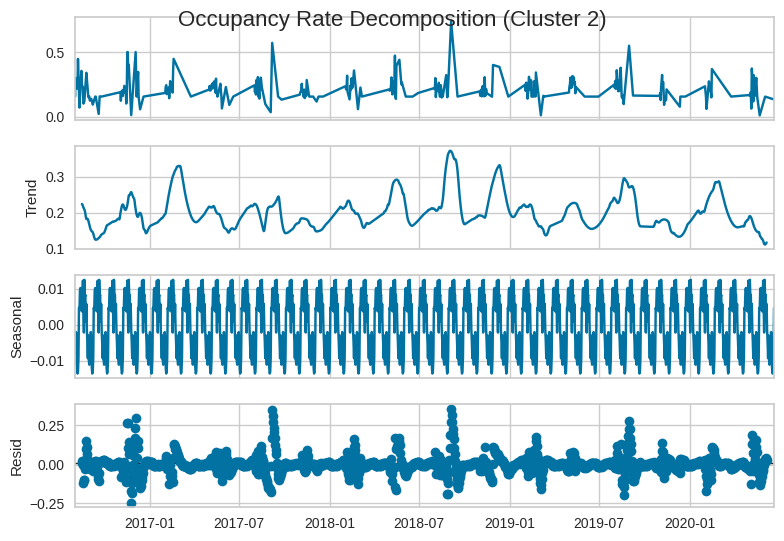

<Figure size 1000x600 with 0 Axes>

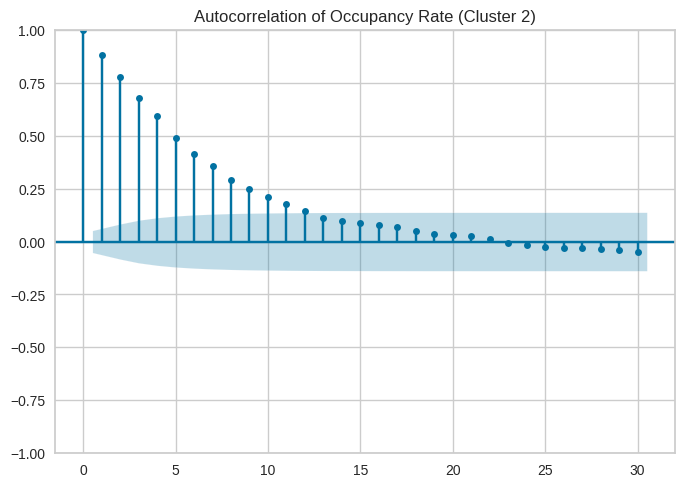

<Figure size 1000x600 with 0 Axes>

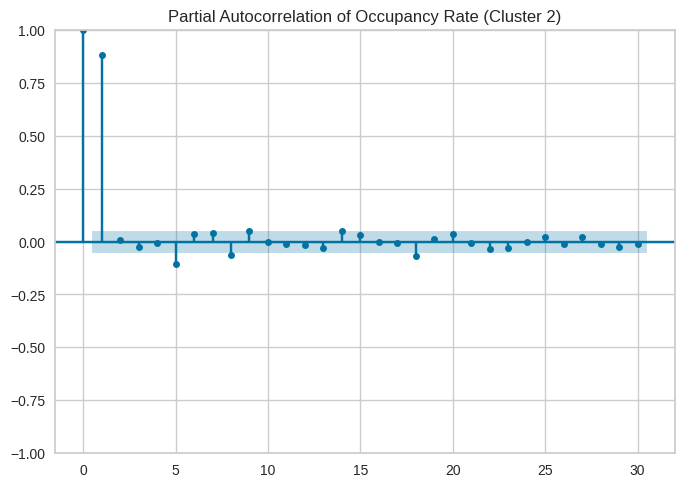


Forecasting Occupancy Rate with ARIMA for Cluster 2...


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


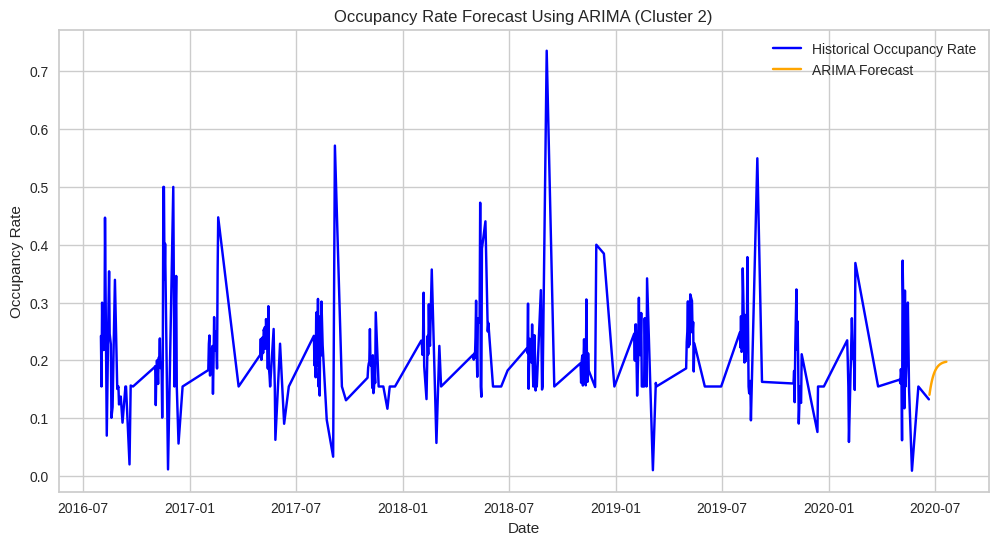

DEBUG:cmdstanpy:input tempfile: /tmp/tmpr8kxtro2/gon528o8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr8kxtro2/lr_uum71.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=19319', 'data', 'file=/tmp/tmpr8kxtro2/gon528o8.json', 'init=/tmp/tmpr8kxtro2/lr_uum71.json', 'output', 'file=/tmp/tmpr8kxtro2/prophet_model67nl2iam/prophet_model-20241207202913.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:29:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing



Forecasting Occupancy Rate with Prophet for Cluster 2...


20:29:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


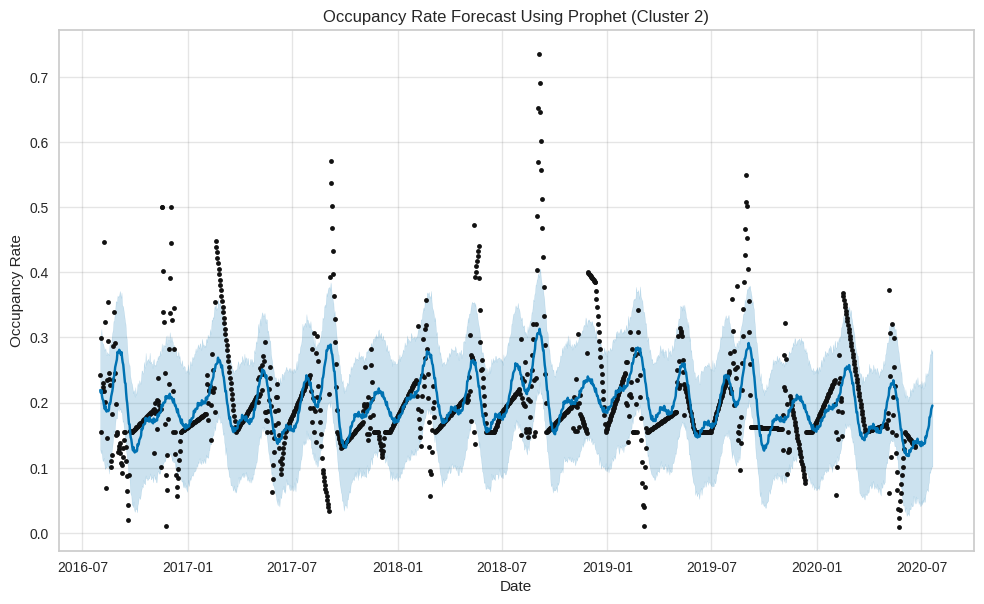


Decomposing Revenue for Cluster 2...


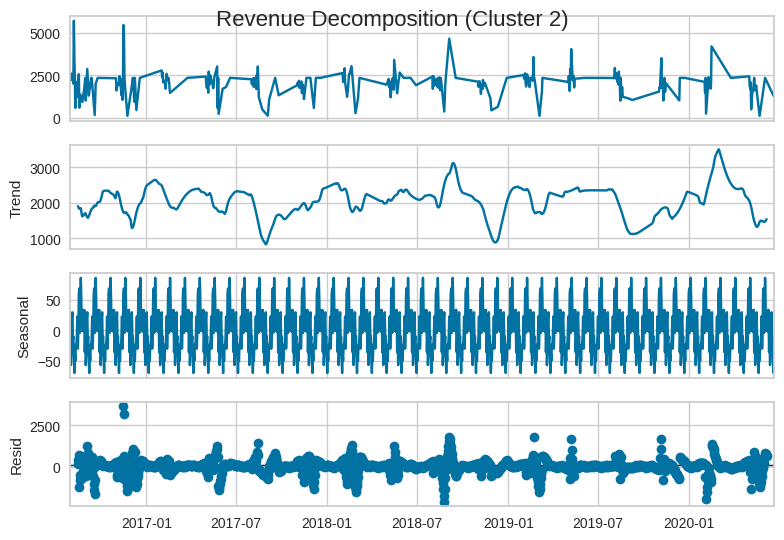

<Figure size 1000x600 with 0 Axes>

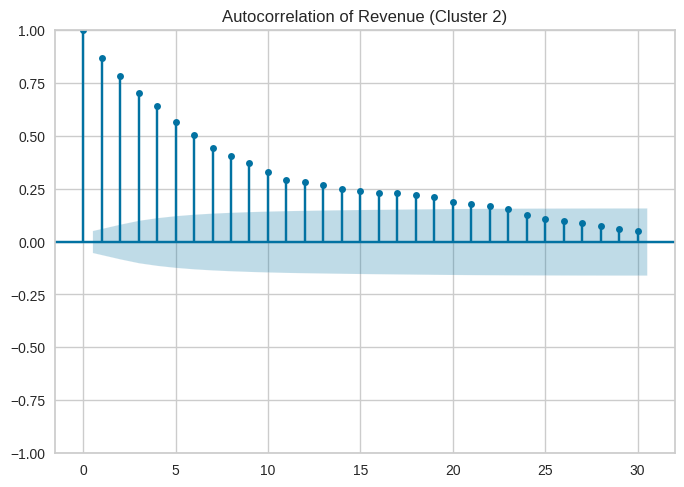

<Figure size 1000x600 with 0 Axes>

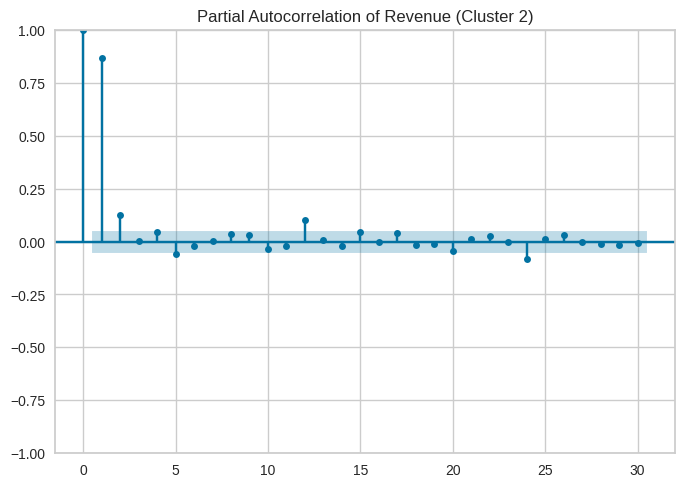


Forecasting Revenue with ARIMA for Cluster 2...


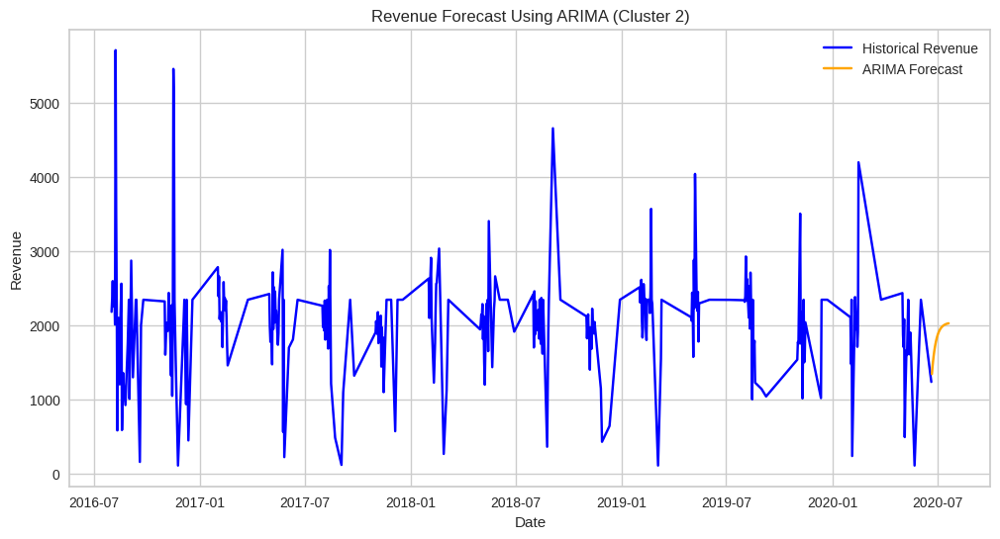

DEBUG:cmdstanpy:input tempfile: /tmp/tmpr8kxtro2/6_buf4wn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr8kxtro2/1r8l31yc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=39900', 'data', 'file=/tmp/tmpr8kxtro2/6_buf4wn.json', 'init=/tmp/tmpr8kxtro2/1r8l31yc.json', 'output', 'file=/tmp/tmpr8kxtro2/prophet_modeltr99gx3l/prophet_model-20241207202918.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:29:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing



Forecasting Revenue with Prophet for Cluster 2...


20:29:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


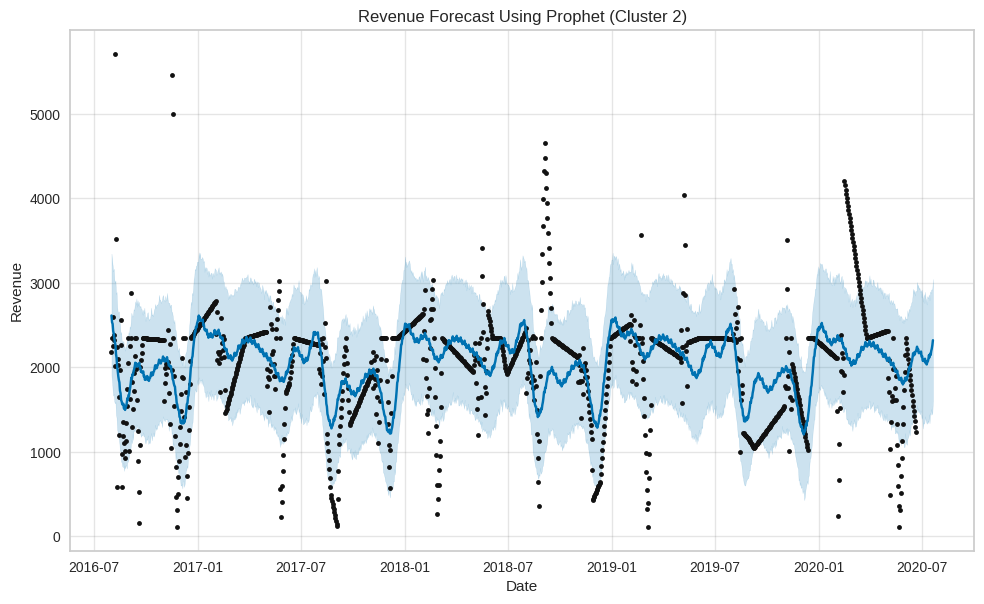


Decomposing Number of Superhosts for Cluster 2...


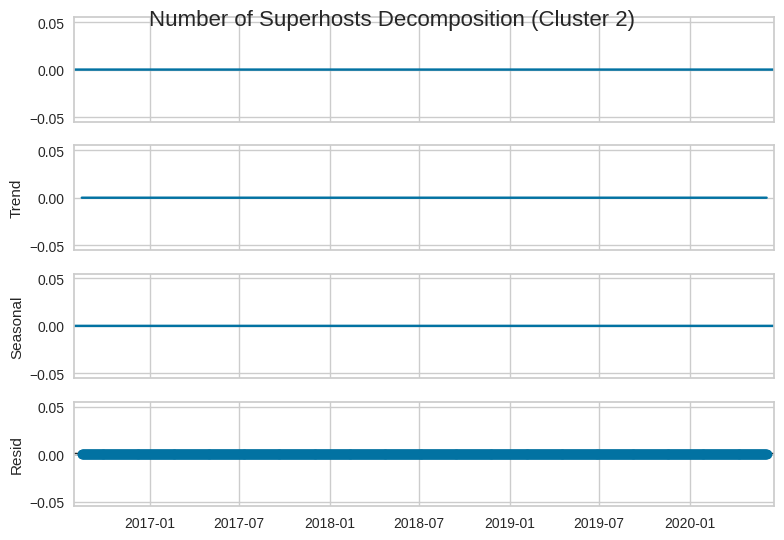

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]


<Figure size 1000x600 with 0 Axes>

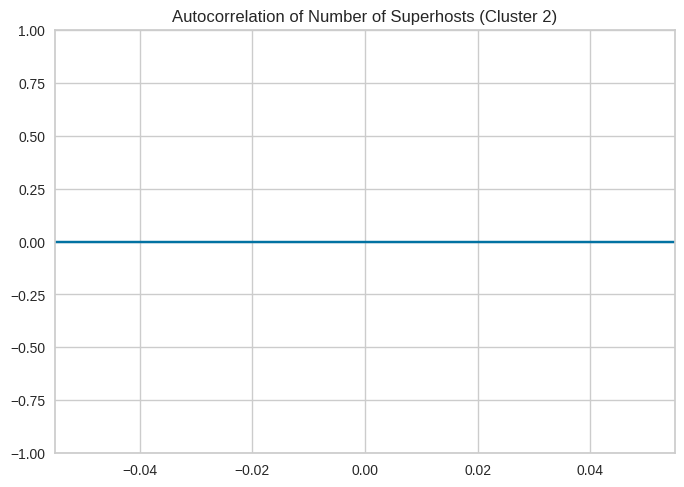

/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1490: ValueWarning: Matrix is singular. Using pinv.
  warnings.warn("Matrix is singular. Using pinv.", ValueWarning)


<Figure size 1000x600 with 0 Axes>

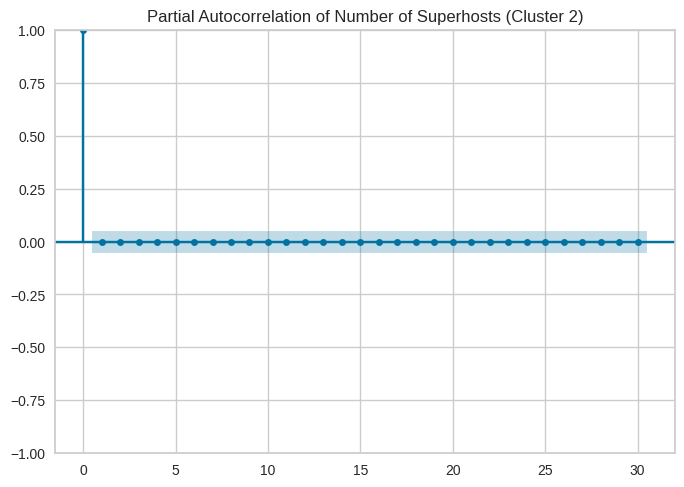


Forecasting Number of Superhosts with ARIMA for Cluster 2...


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


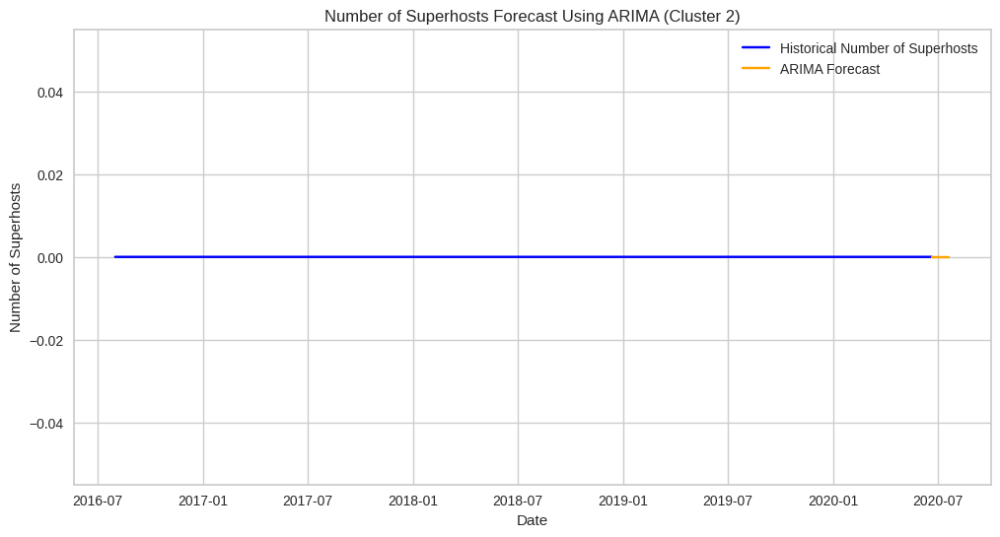


Forecasting Number of Superhosts with Prophet for Cluster 2...


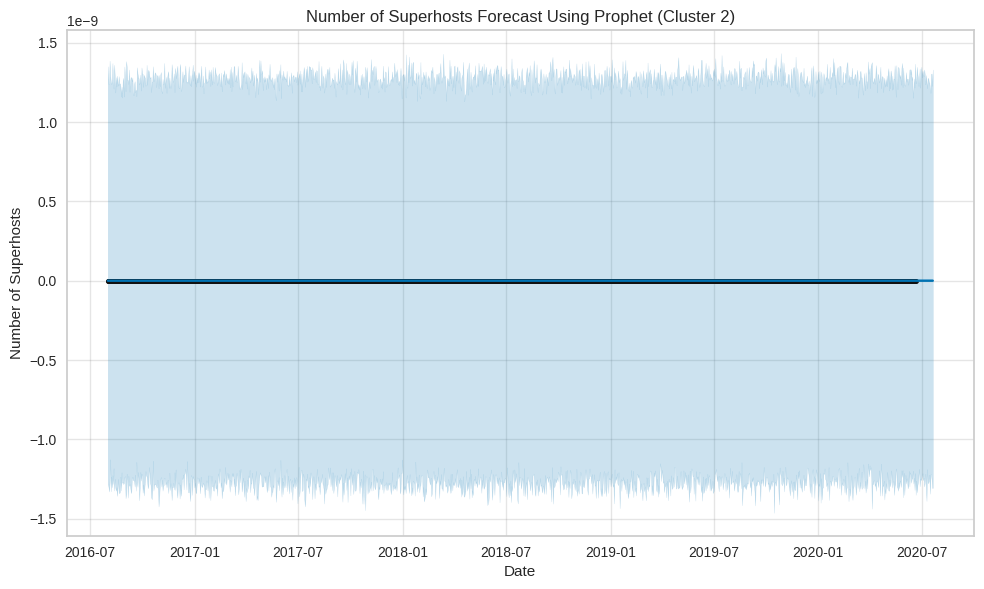


Analyzing Cluster 3

Decomposing Occupancy Rate for Cluster 3...


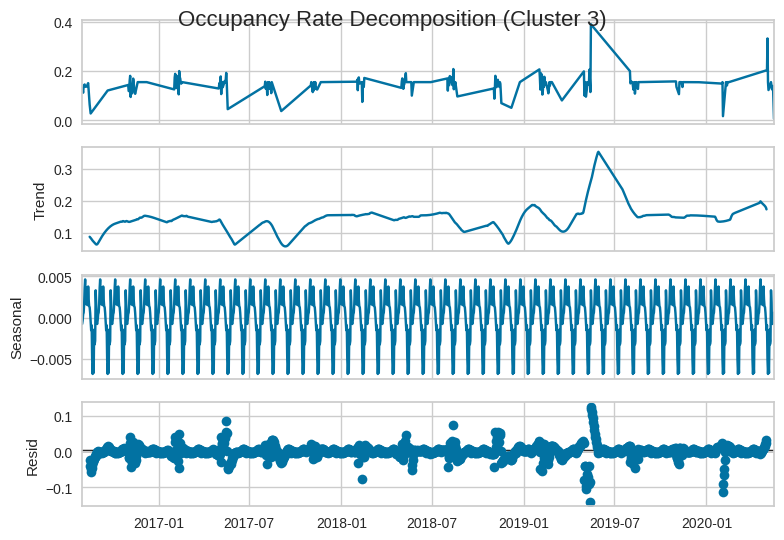

<Figure size 1000x600 with 0 Axes>

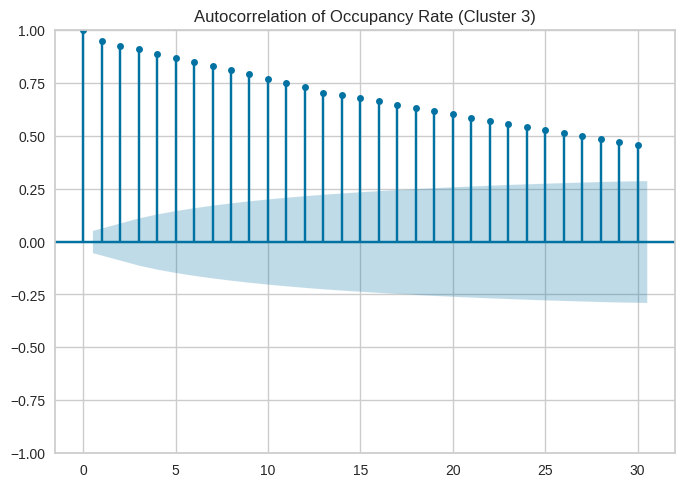

<Figure size 1000x600 with 0 Axes>

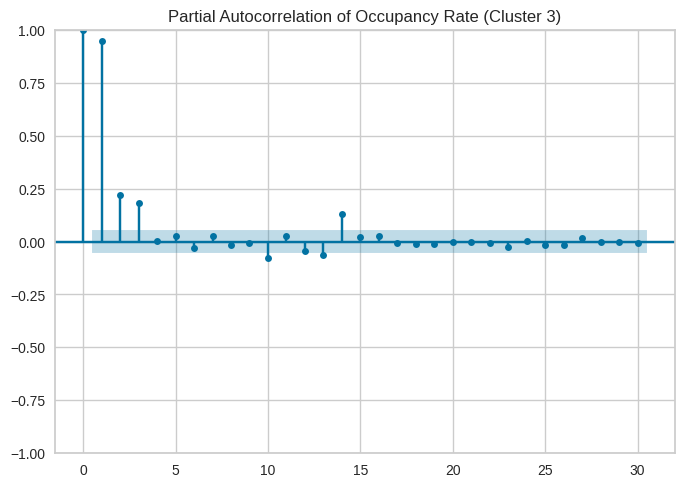


Forecasting Occupancy Rate with ARIMA for Cluster 3...


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


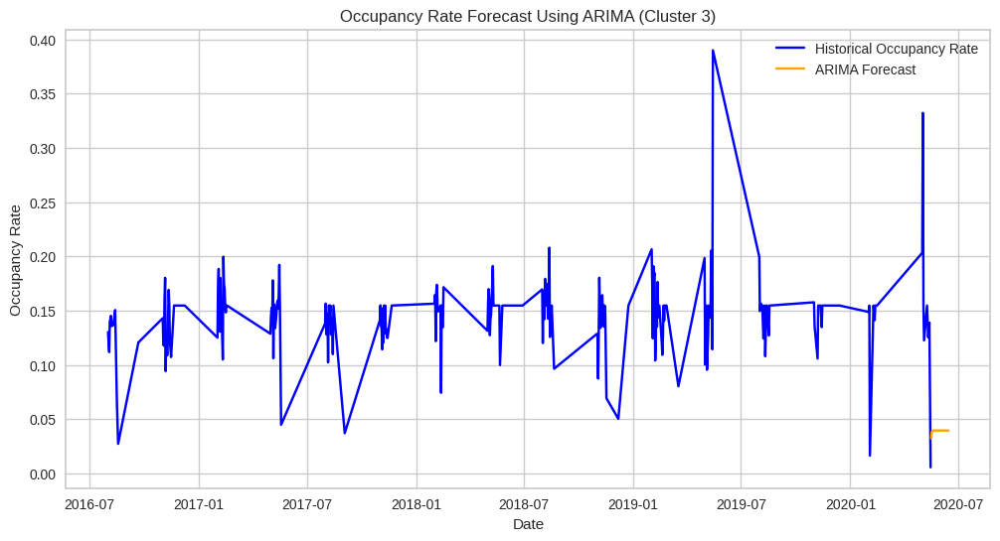

DEBUG:cmdstanpy:input tempfile: /tmp/tmpr8kxtro2/76lsn5uj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr8kxtro2/nzdea6_7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=46498', 'data', 'file=/tmp/tmpr8kxtro2/76lsn5uj.json', 'init=/tmp/tmpr8kxtro2/nzdea6_7.json', 'output', 'file=/tmp/tmpr8kxtro2/prophet_modeleteggh2w/prophet_model-20241207202933.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:29:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing



Forecasting Occupancy Rate with Prophet for Cluster 3...


20:29:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


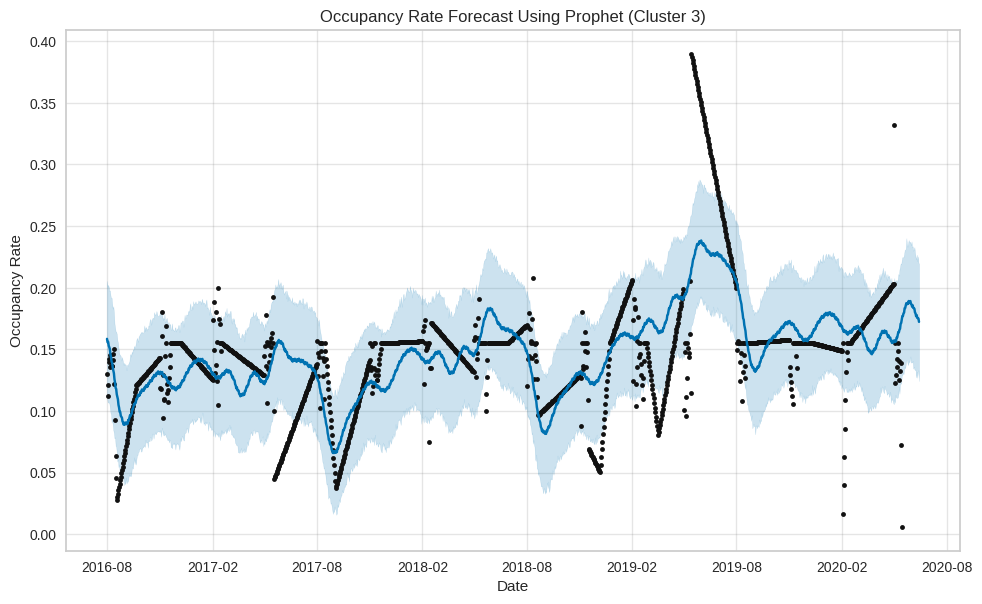


Decomposing Revenue for Cluster 3...


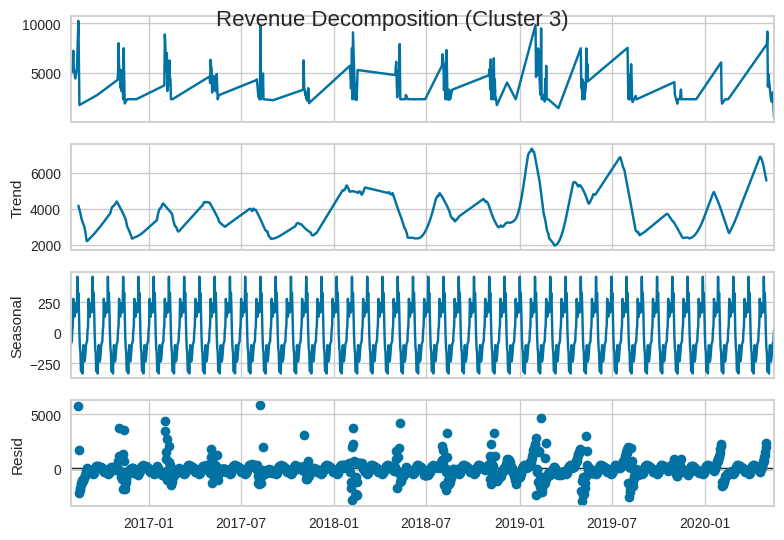

<Figure size 1000x600 with 0 Axes>

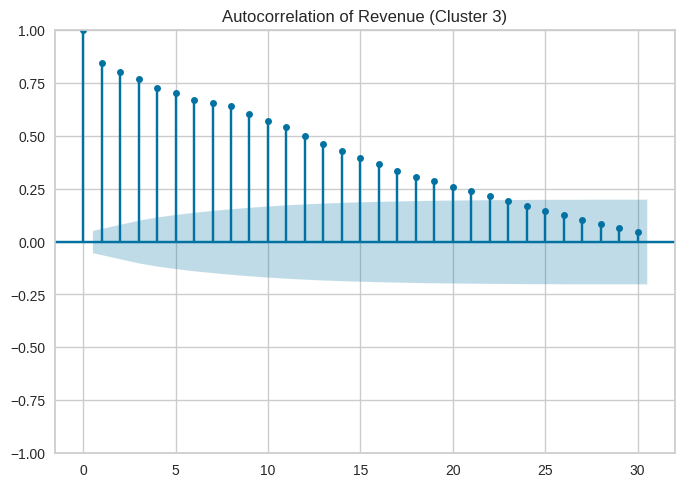

<Figure size 1000x600 with 0 Axes>

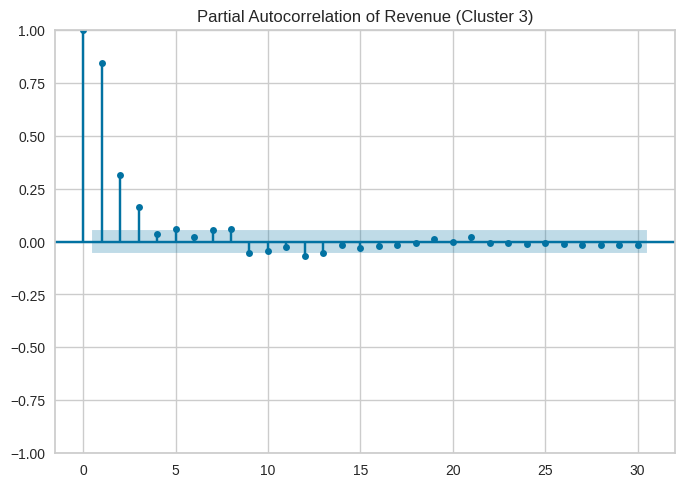


Forecasting Revenue with ARIMA for Cluster 3...


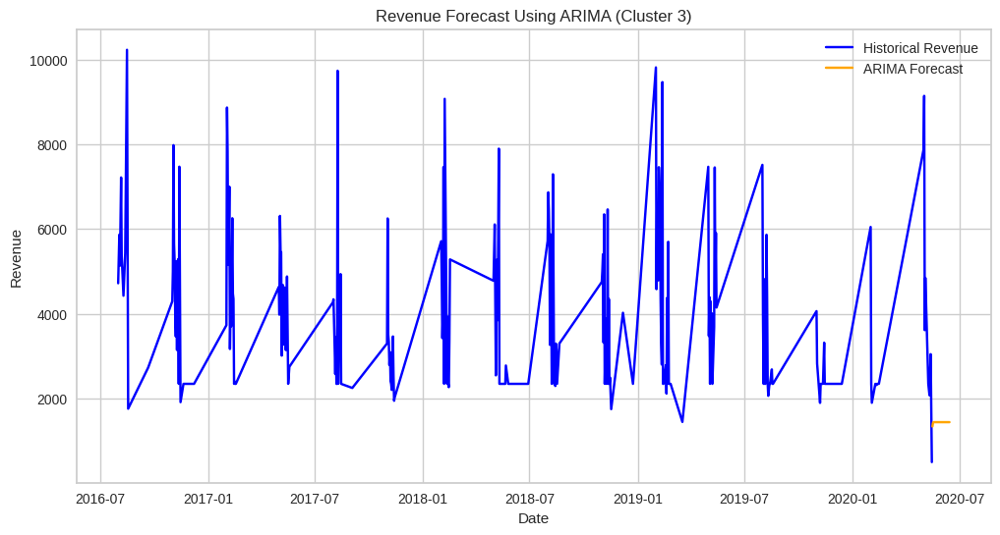

DEBUG:cmdstanpy:input tempfile: /tmp/tmpr8kxtro2/b1nyka3c.json



Forecasting Revenue with Prophet for Cluster 3...


DEBUG:cmdstanpy:input tempfile: /tmp/tmpr8kxtro2/aopzgr_p.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=3214', 'data', 'file=/tmp/tmpr8kxtro2/b1nyka3c.json', 'init=/tmp/tmpr8kxtro2/aopzgr_p.json', 'output', 'file=/tmp/tmpr8kxtro2/prophet_modelp26paw5p/prophet_model-20241207202938.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:29:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
20:29:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


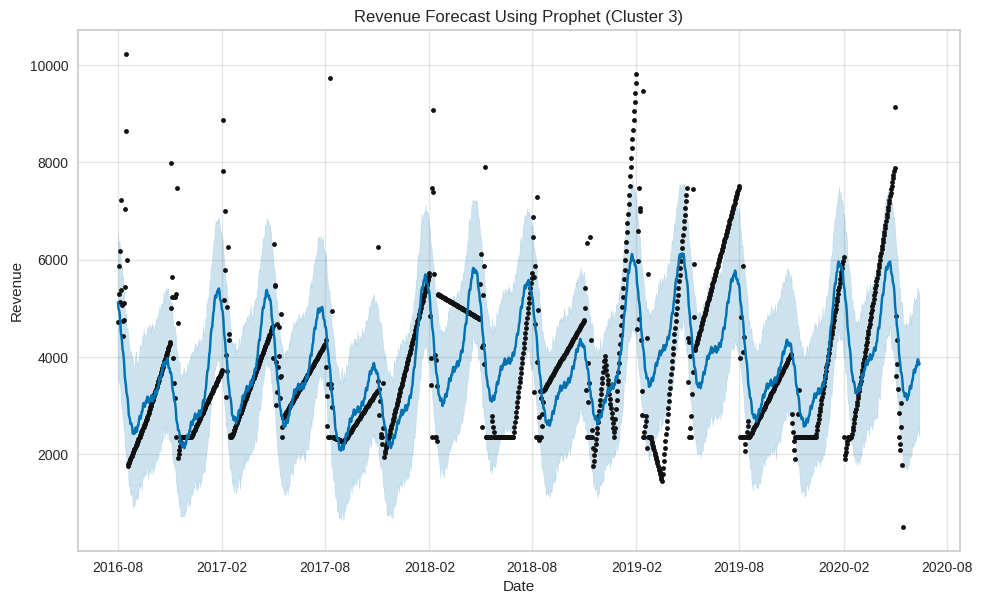


Decomposing Number of Superhosts for Cluster 3...


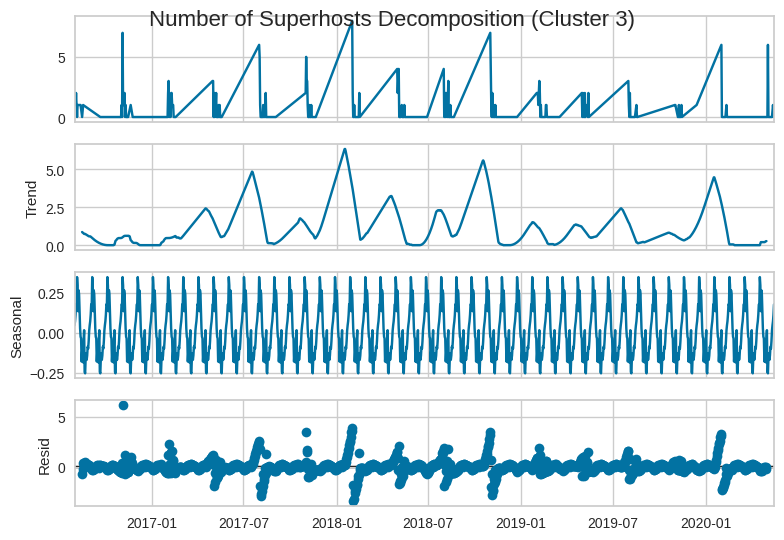

<Figure size 1000x600 with 0 Axes>

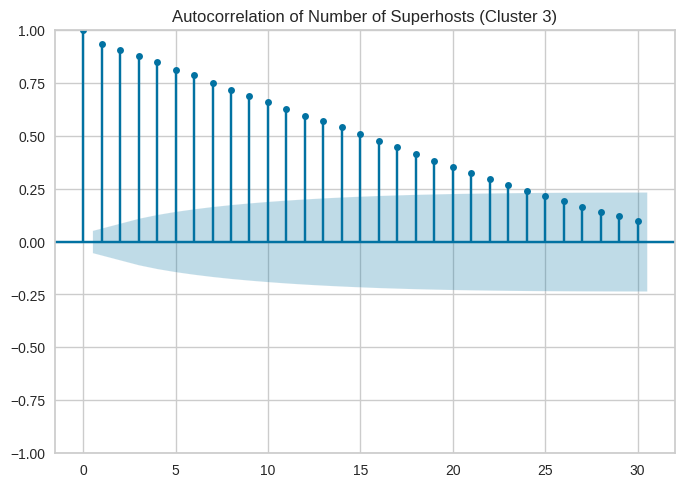

<Figure size 1000x600 with 0 Axes>

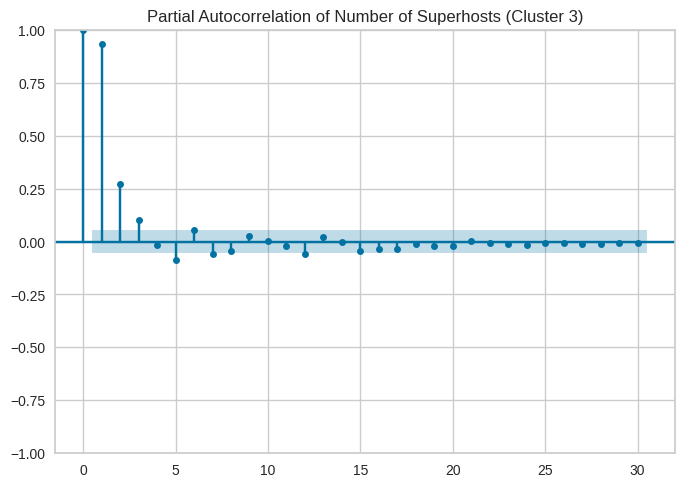


Forecasting Number of Superhosts with ARIMA for Cluster 3...


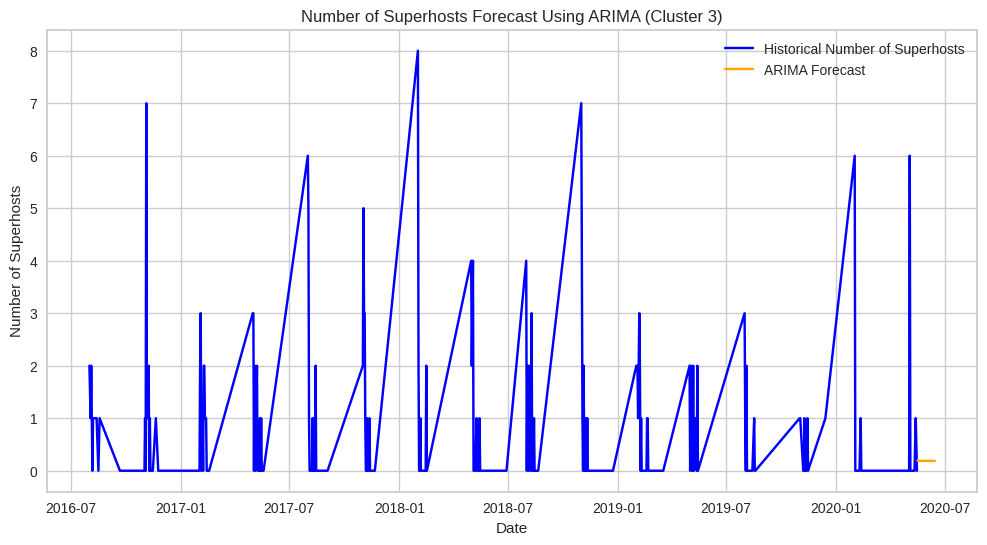

DEBUG:cmdstanpy:input tempfile: /tmp/tmpr8kxtro2/3ro7inii.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr8kxtro2/m3hu1py0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=51365', 'data', 'file=/tmp/tmpr8kxtro2/3ro7inii.json', 'init=/tmp/tmpr8kxtro2/m3hu1py0.json', 'output', 'file=/tmp/tmpr8kxtro2/prophet_model1ndgkdcu/prophet_model-20241207202944.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:29:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing



Forecasting Number of Superhosts with Prophet for Cluster 3...


20:29:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


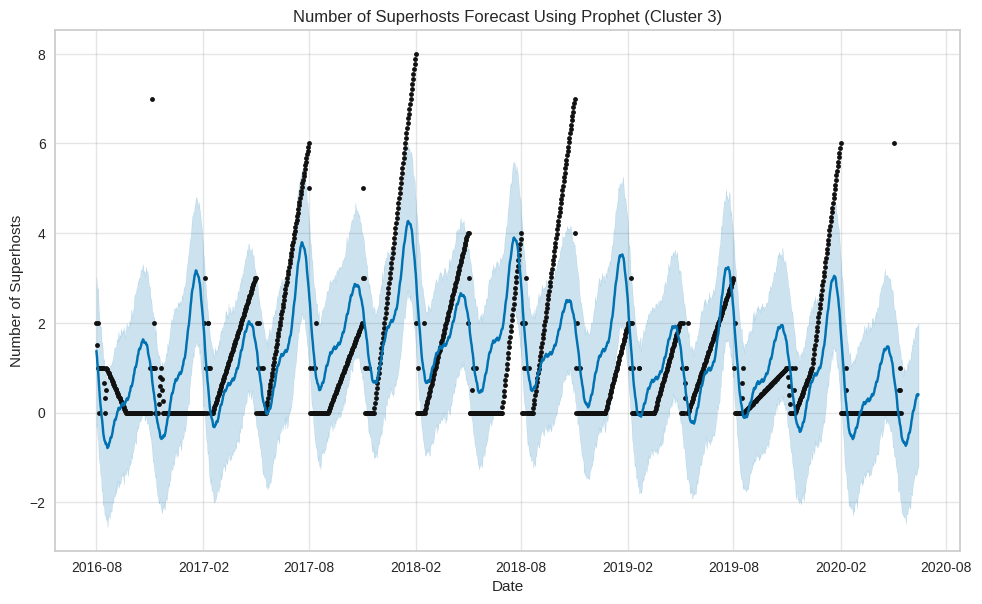


Analyzing Cluster 1

Decomposing Occupancy Rate for Cluster 1...


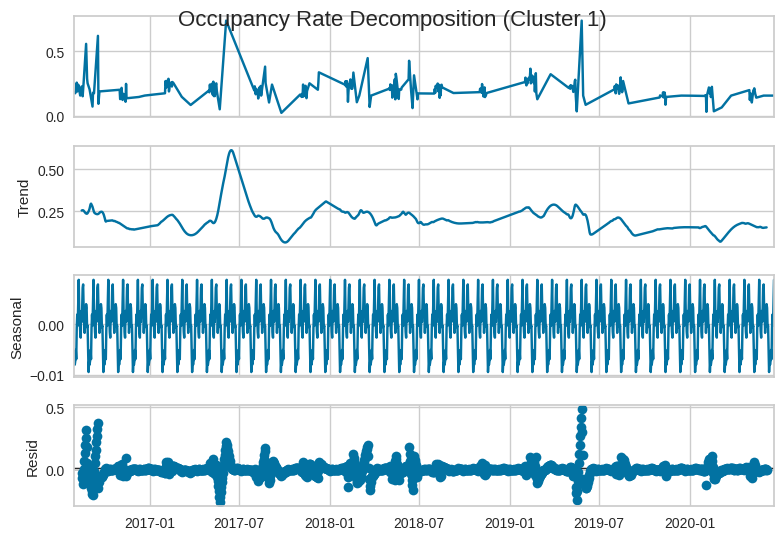

<Figure size 1000x600 with 0 Axes>

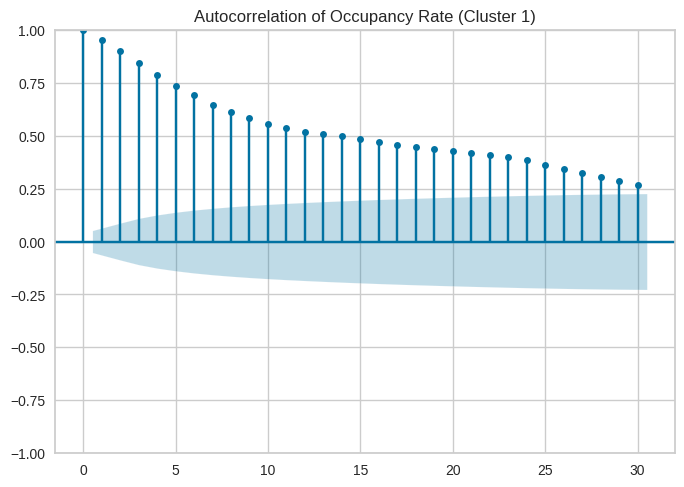

<Figure size 1000x600 with 0 Axes>

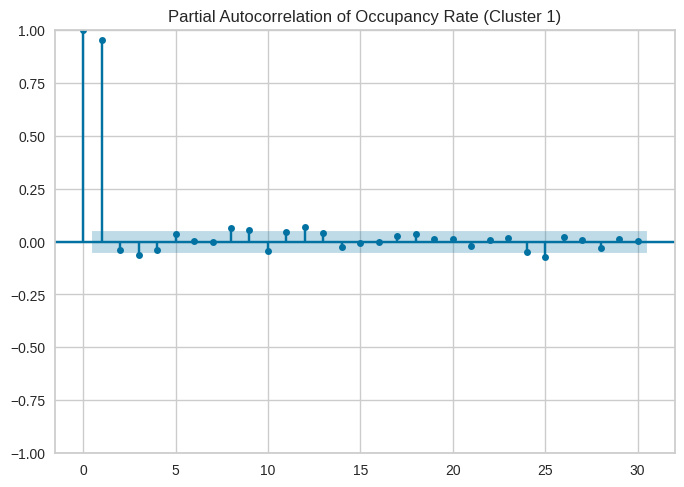


Forecasting Occupancy Rate with ARIMA for Cluster 1...


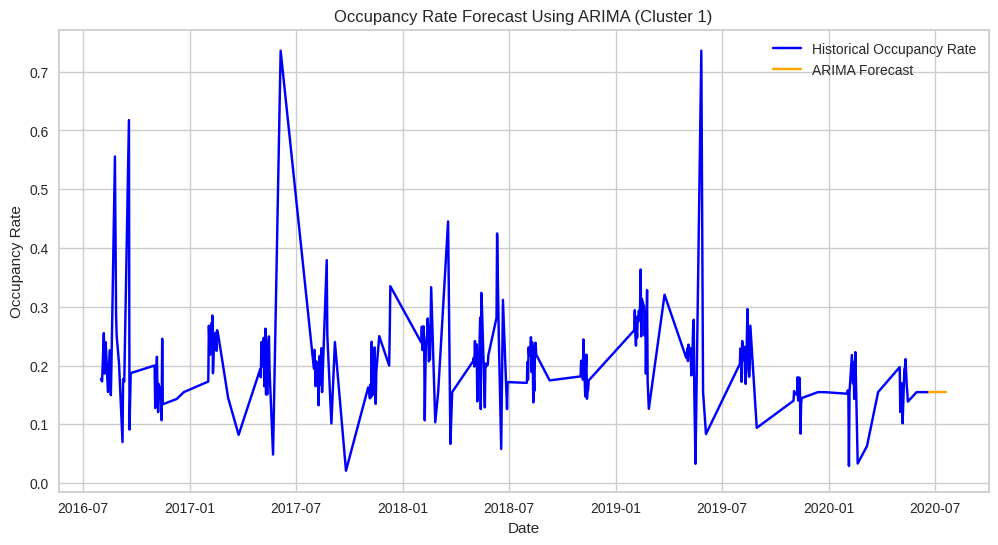

DEBUG:cmdstanpy:input tempfile: /tmp/tmpr8kxtro2/qv5_37ui.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr8kxtro2/jgkvdxef.json
DEBUG:cmdstanpy:idx 0



Forecasting Occupancy Rate with Prophet for Cluster 1...


DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22476', 'data', 'file=/tmp/tmpr8kxtro2/qv5_37ui.json', 'init=/tmp/tmpr8kxtro2/jgkvdxef.json', 'output', 'file=/tmp/tmpr8kxtro2/prophet_modelza0_7r1e/prophet_model-20241207202949.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:29:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
20:29:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


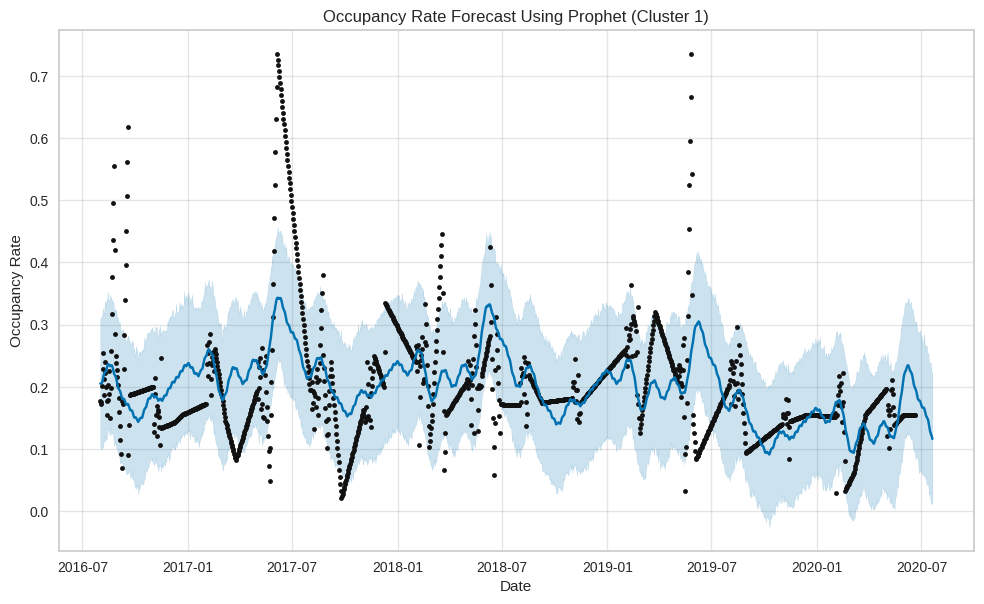


Decomposing Revenue for Cluster 1...


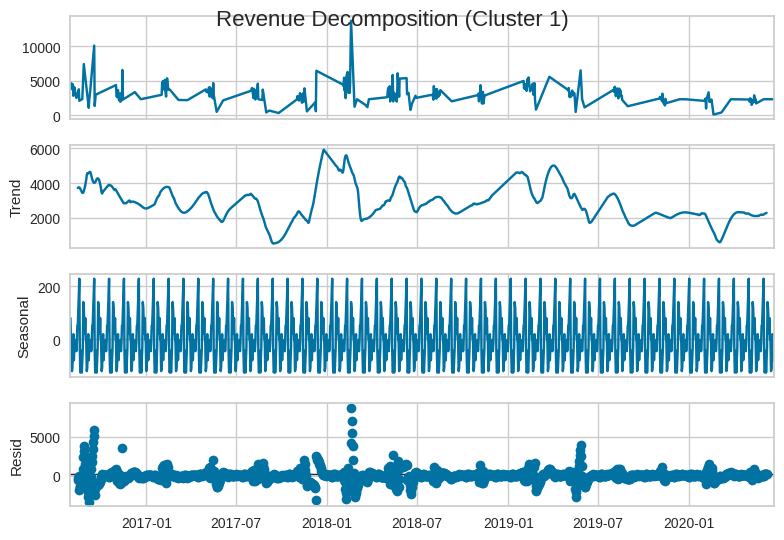

<Figure size 1000x600 with 0 Axes>

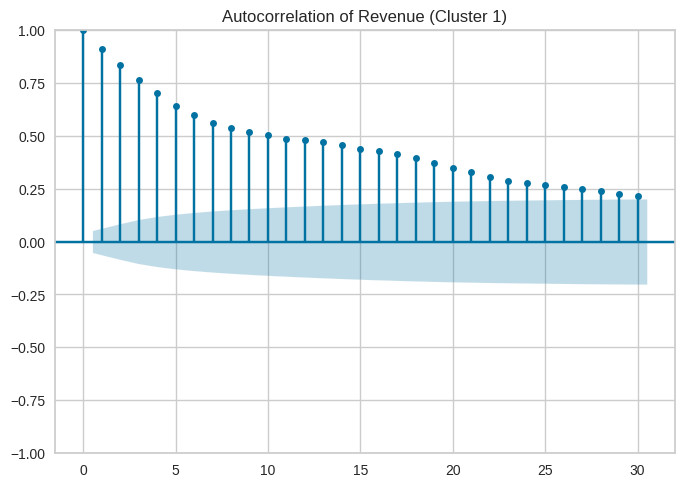

<Figure size 1000x600 with 0 Axes>

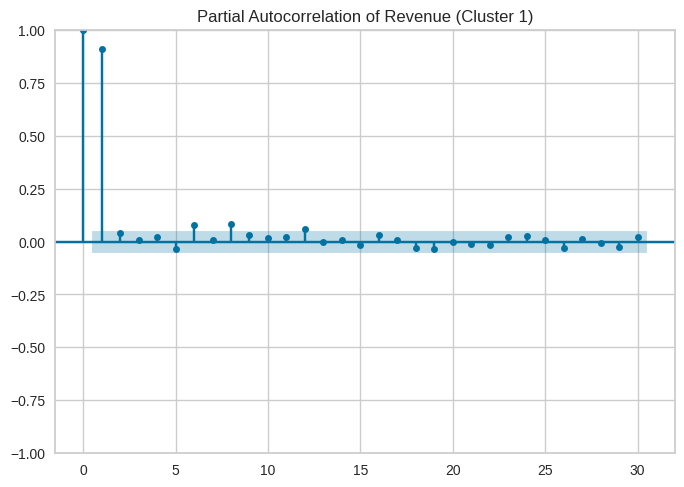


Forecasting Revenue with ARIMA for Cluster 1...


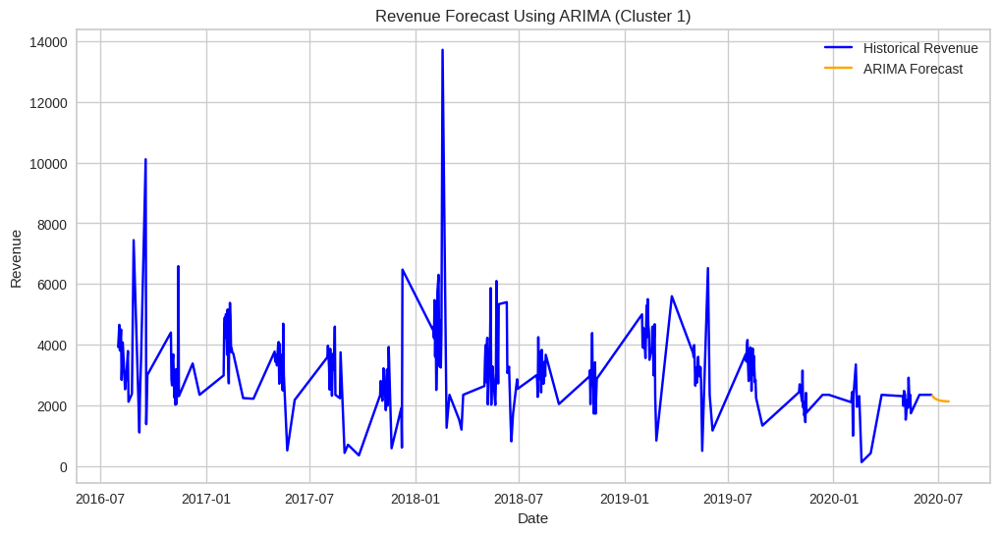

DEBUG:cmdstanpy:input tempfile: /tmp/tmpr8kxtro2/uhcthkhg.json



Forecasting Revenue with Prophet for Cluster 1...


DEBUG:cmdstanpy:input tempfile: /tmp/tmpr8kxtro2/jr38910u.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61909', 'data', 'file=/tmp/tmpr8kxtro2/uhcthkhg.json', 'init=/tmp/tmpr8kxtro2/jr38910u.json', 'output', 'file=/tmp/tmpr8kxtro2/prophet_model_c03dxsr/prophet_model-20241207202956.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:29:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
20:29:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


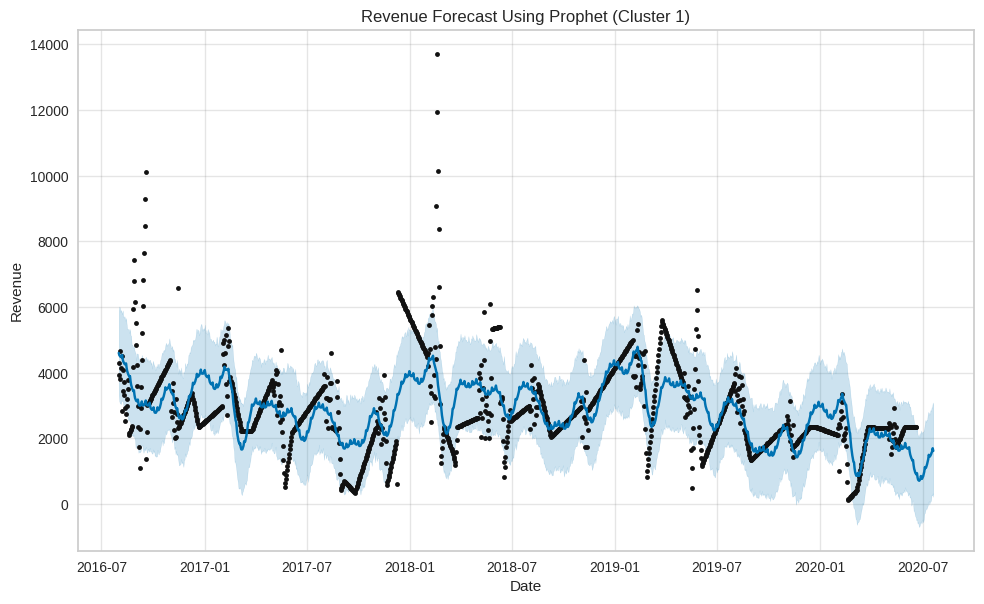


Decomposing Number of Superhosts for Cluster 1...


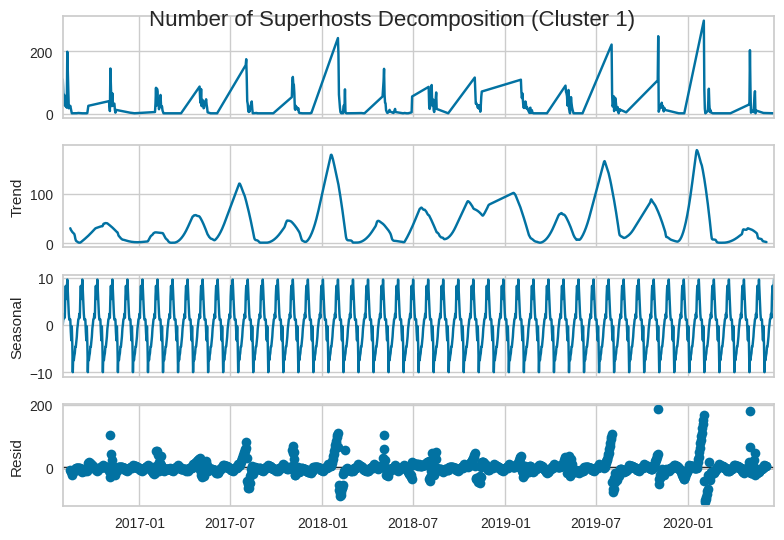

<Figure size 1000x600 with 0 Axes>

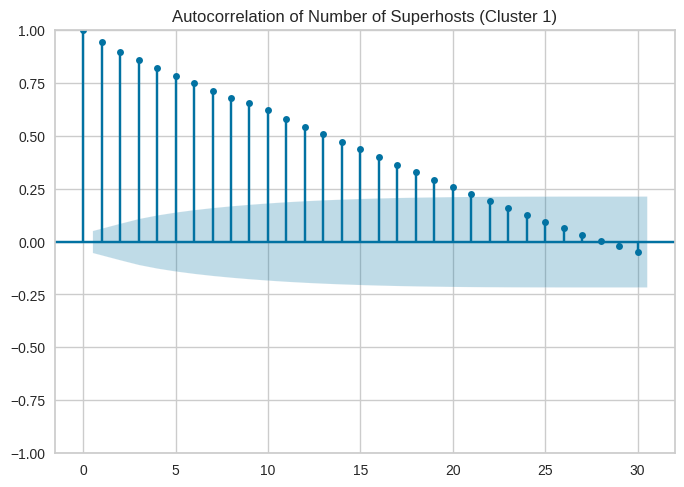

<Figure size 1000x600 with 0 Axes>

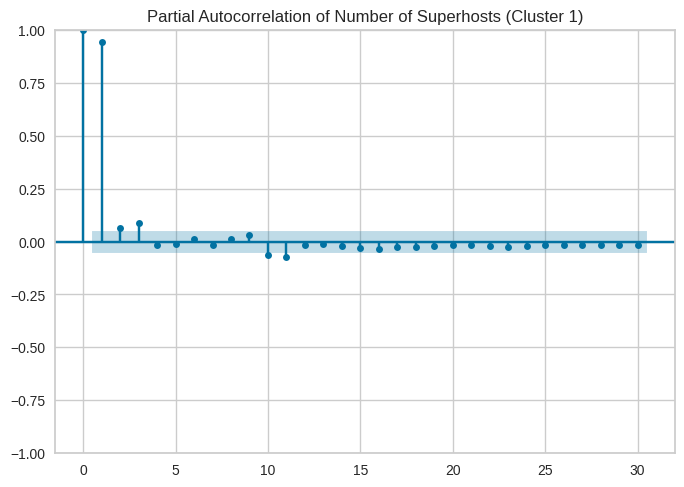


Forecasting Number of Superhosts with ARIMA for Cluster 1...


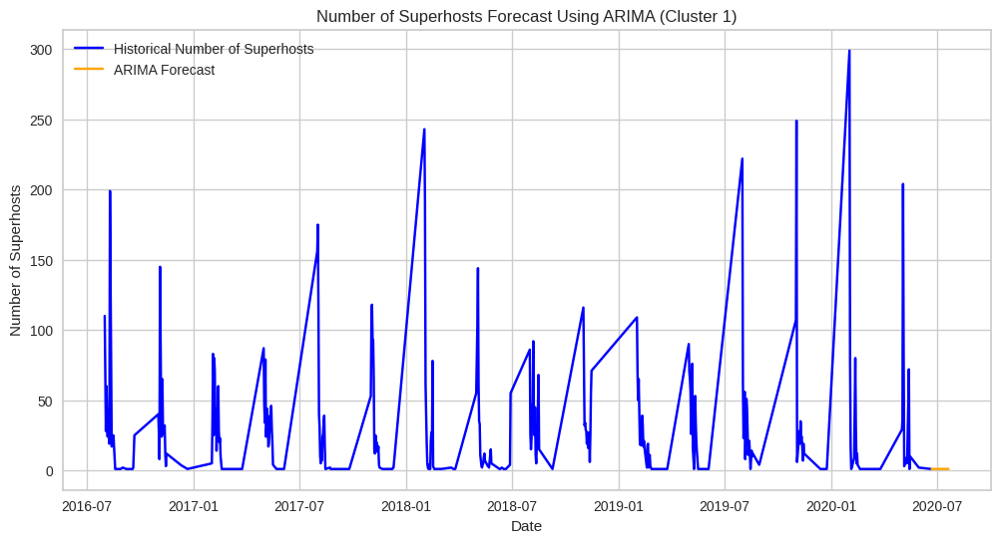

DEBUG:cmdstanpy:input tempfile: /tmp/tmpr8kxtro2/1t4k444h.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr8kxtro2/g68eiz__.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None



Forecasting Number of Superhosts with Prophet for Cluster 1...


DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=11982', 'data', 'file=/tmp/tmpr8kxtro2/1t4k444h.json', 'init=/tmp/tmpr8kxtro2/g68eiz__.json', 'output', 'file=/tmp/tmpr8kxtro2/prophet_model3e6jpsiw/prophet_model-20241207203002.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:30:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
20:30:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


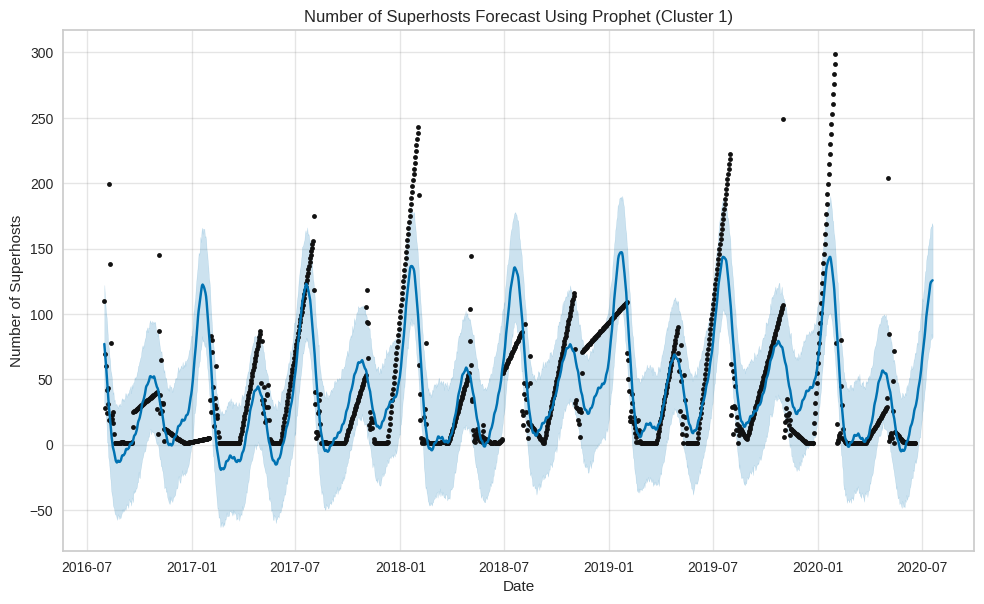

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from prophet import Prophet

# Load the clustered dataset
file_path = '/content/airbnb_Washington_clustered.csv'
airbnb_data = pd.read_csv(file_path)

# Ensure the 'Cluster' column exists
if 'Cluster' not in airbnb_data.columns:
    raise ValueError("Cluster column is missing. Perform clustering before running this analysis.")

# Define time series columns and grouping logic
time_series_columns = ['Scraped Date', 'occupancy_rate', 'revenue', 'host_is_superhost_in_period']
airbnb_data['Scraped Date'] = pd.to_datetime(airbnb_data['Scraped Date'])  # Ensure Scraped Date is in datetime format

# Iterate over each cluster
for cluster_id in airbnb_data['Cluster'].unique():
    print(f"\nAnalyzing Cluster {cluster_id}")

    # Filter data for the current cluster
    cluster_data = airbnb_data[airbnb_data['Cluster'] == cluster_id]

    # Group by Scraped Date for time series
    cluster_time_series = cluster_data.groupby('Scraped Date').agg({
        'occupancy_rate': 'mean',
        'revenue': 'mean',
        'host_is_superhost_in_period': 'sum'
    }).reset_index()

    # Define and preprocess individual time series
    time_series_dict = {
        'Occupancy Rate': cluster_time_series[['Scraped Date', 'occupancy_rate']],
        'Revenue': cluster_time_series[['Scraped Date', 'revenue']],
        'Number of Superhosts': cluster_time_series[['Scraped Date', 'host_is_superhost_in_period']]
    }

    for series_name, series_data in time_series_dict.items():
        # Fill missing dates and interpolate
        series_data.set_index('Scraped Date', inplace=True)
        series_data = series_data.asfreq('D')  # Daily frequency
        series_data.interpolate(method='time', inplace=True)

        # Decomposition
        print(f"\nDecomposing {series_name} for Cluster {cluster_id}...")
        decomposed = seasonal_decompose(series_data, model='additive', period=30)
        decomposed.plot()
        plt.suptitle(f'{series_name} Decomposition (Cluster {cluster_id})', fontsize=16)
        plt.show()

        # Autocorrelation and Partial Autocorrelation
        plt.figure(figsize=(10, 6))
        plot_acf(series_data.dropna(), lags=30)
        plt.title(f'Autocorrelation of {series_name} (Cluster {cluster_id})')
        plt.show()

        plt.figure(figsize=(10, 6))
        plot_pacf(series_data.dropna(), lags=30)
        plt.title(f'Partial Autocorrelation of {series_name} (Cluster {cluster_id})')
        plt.show()

        # Forecasting with ARIMA
        print(f"\nForecasting {series_name} with ARIMA for Cluster {cluster_id}...")
        arima_model = ARIMA(series_data.dropna(), order=(1, 1, 1))
        arima_result = arima_model.fit()
        arima_forecast = arima_result.forecast(steps=30)
        plt.figure(figsize=(12, 6))
        plt.plot(series_data.index, series_data, label=f'Historical {series_name}', color='blue')
        plt.plot(arima_forecast.index, arima_forecast, label='ARIMA Forecast', color='orange')
        plt.title(f'{series_name} Forecast Using ARIMA (Cluster {cluster_id})')
        plt.xlabel('Date')
        plt.ylabel(series_name)
        plt.legend()
        plt.show()

        # Forecasting with Prophet
        print(f"\nForecasting {series_name} with Prophet for Cluster {cluster_id}...")
        prophet_data = series_data.reset_index()
        prophet_data.columns = ['ds', 'y']  # Rename columns for Prophet
        prophet_model = Prophet(yearly_seasonality=True, daily_seasonality=False)
        prophet_model.fit(prophet_data)
        future = prophet_model.make_future_dataframe(periods=30)  # Forecast for the next 30 days
        forecast = prophet_model.predict(future)
        fig = prophet_model.plot(forecast)
        plt.title(f'{series_name} Forecast Using Prophet (Cluster {cluster_id})')
        plt.xlabel('Date')
        plt.ylabel(series_name)
        plt.show()

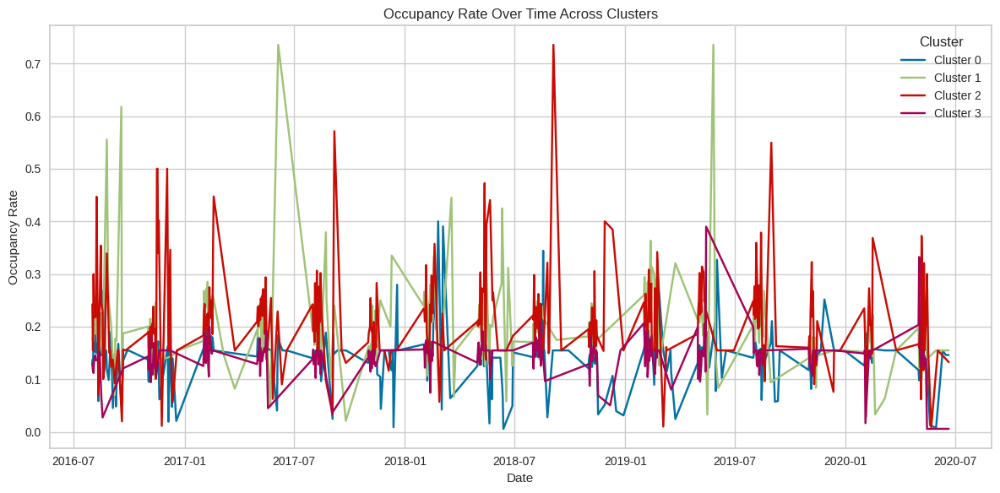

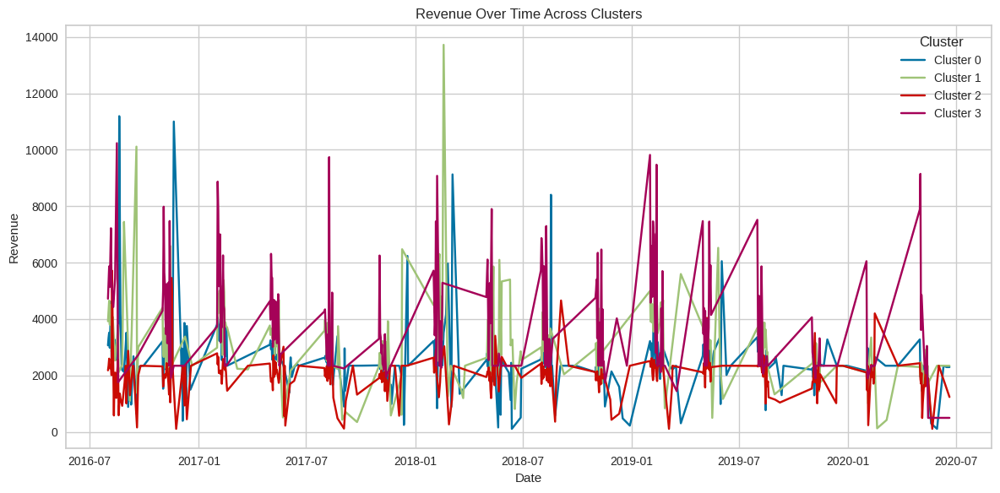

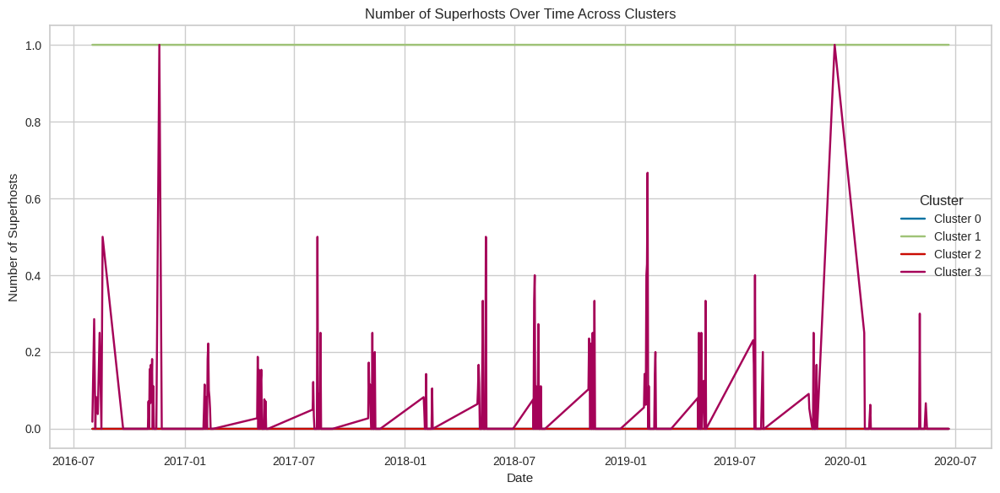

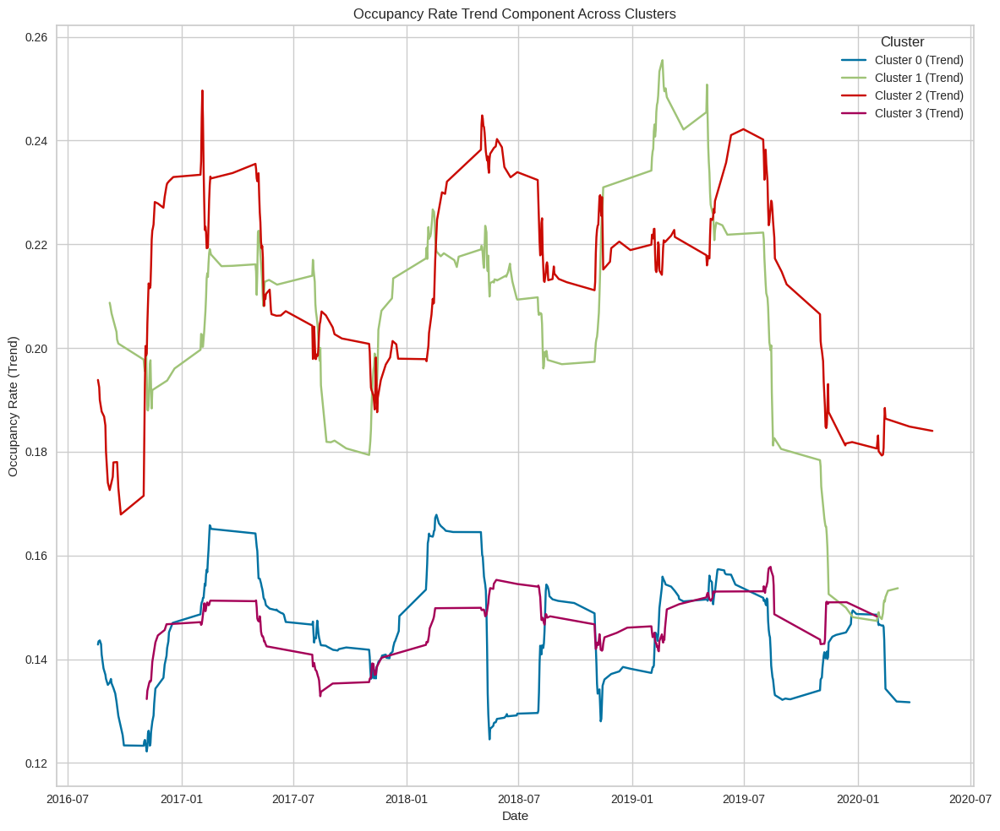

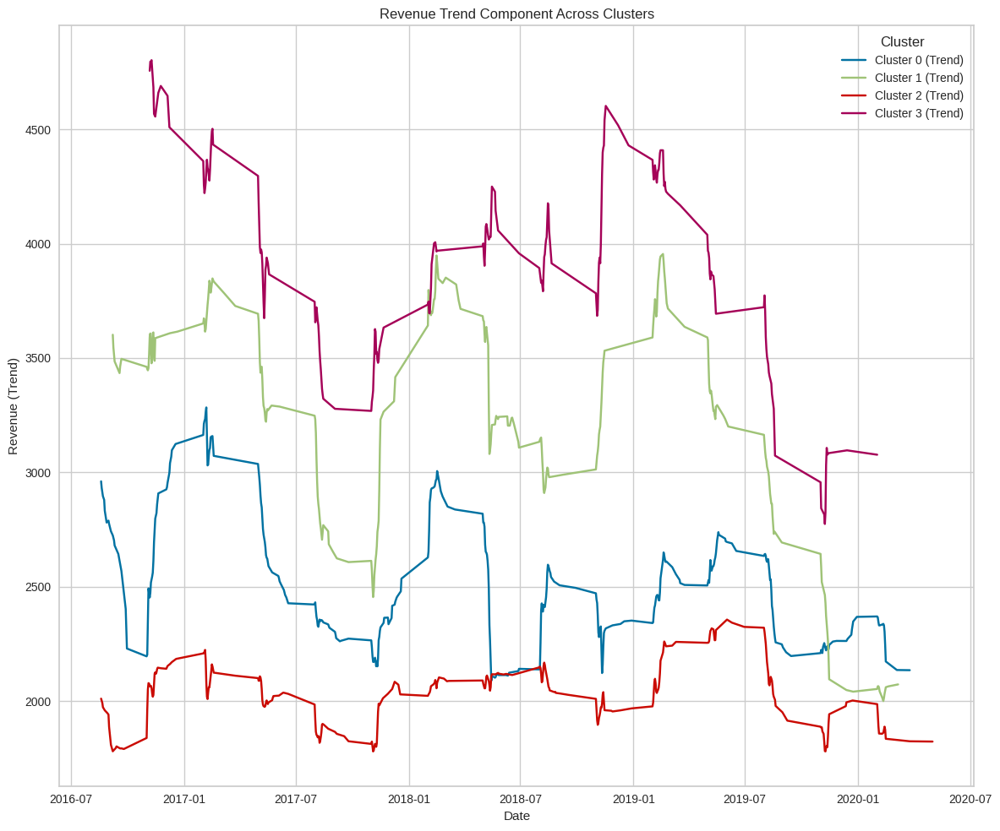

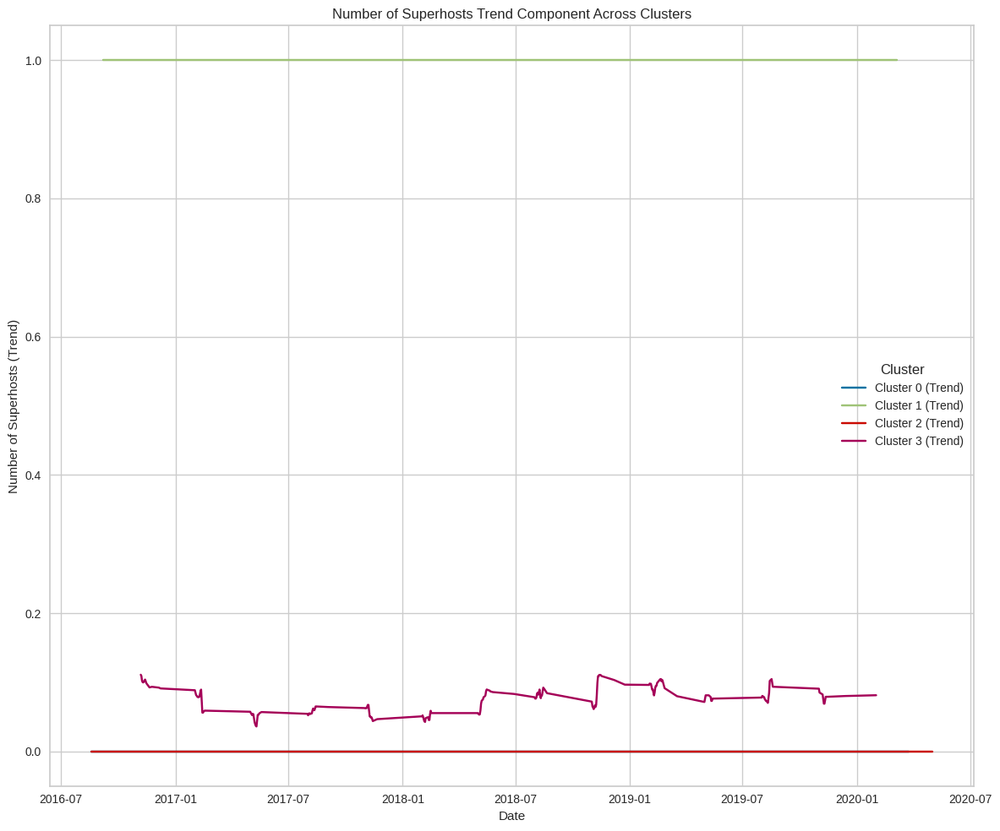

DEBUG:cmdstanpy:input tempfile: /tmp/tmpr8kxtro2/cs7k96_v.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr8kxtro2/n7vxpycx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=29597', 'data', 'file=/tmp/tmpr8kxtro2/cs7k96_v.json', 'init=/tmp/tmpr8kxtro2/n7vxpycx.json', 'output', 'file=/tmp/tmpr8kxtro2/prophet_modeluxg8ryf9/prophet_model-20241207203133.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:31:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
20:31:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr8kxtro2/3h2cjy8p.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr8kxtro2/s8hwq0il.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

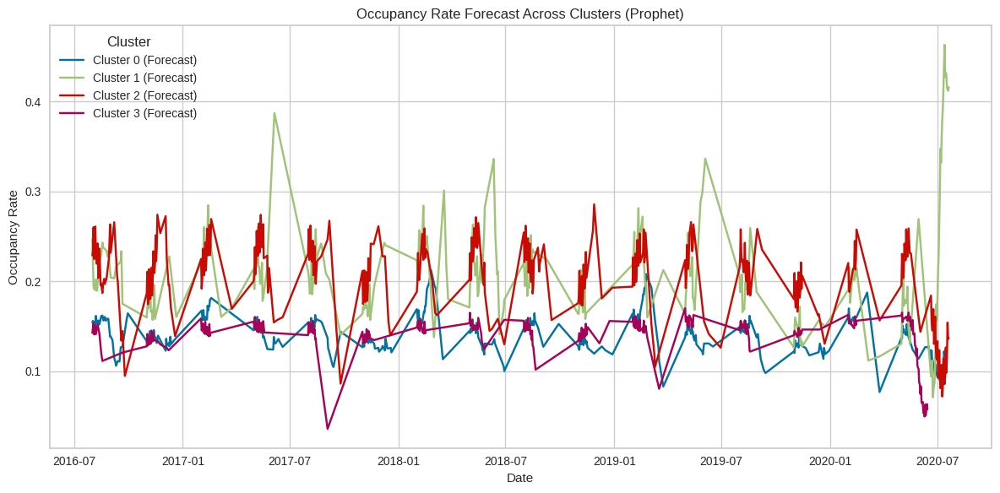

DEBUG:cmdstanpy:input tempfile: /tmp/tmpr8kxtro2/zn_9xpzu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr8kxtro2/ievgqwjs.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=2228', 'data', 'file=/tmp/tmpr8kxtro2/zn_9xpzu.json', 'init=/tmp/tmpr8kxtro2/ievgqwjs.json', 'output', 'file=/tmp/tmpr8kxtro2/prophet_modelvp5t83no/prophet_model-20241207203137.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:31:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
20:31:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr8kxtro2/dkp9qrrf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr8kxtro2/68p67aq9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

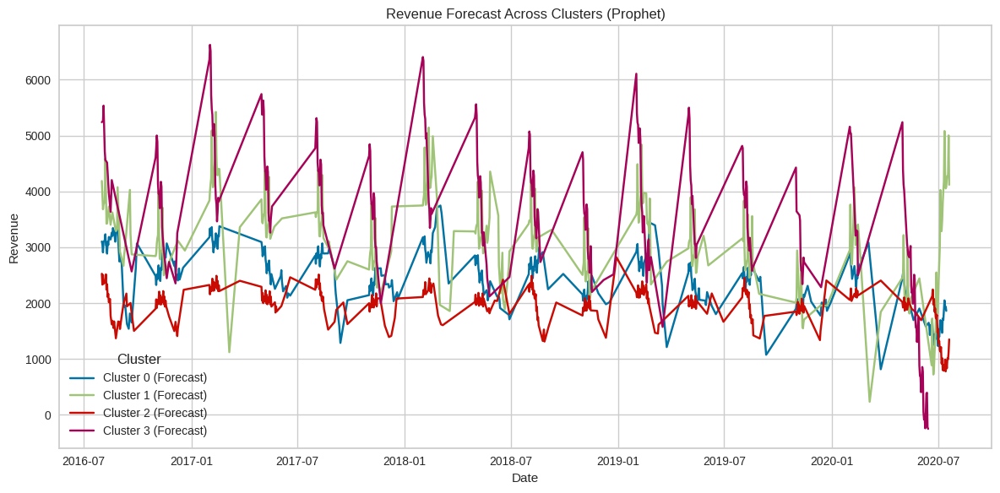

DEBUG:cmdstanpy:input tempfile: /tmp/tmpr8kxtro2/86v939zj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpr8kxtro2/rb3jbds3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=24241', 'data', 'file=/tmp/tmpr8kxtro2/86v939zj.json', 'init=/tmp/tmpr8kxtro2/rb3jbds3.json', 'output', 'file=/tmp/tmpr8kxtro2/prophet_modelfmfd_ec9/prophet_model-20241207203140.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:31:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
20:31:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


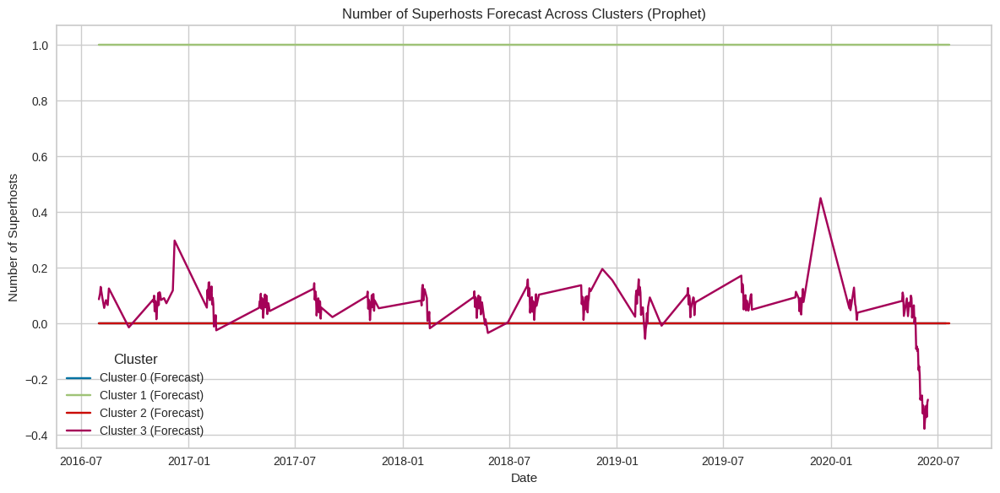

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose
from prophet import Prophet

# Load the dataset
file_path = '/content/airbnb_Washington_clustered.csv'
airbnb_data = pd.read_csv(file_path)

# Ensure clustering is done
features = ['Nightly Rate', 'available_days', 'host_is_superhost_in_period']
if 'Cluster' not in airbnb_data.columns:
    raise ValueError("Cluster column is missing. Perform clustering before running this analysis.")

# Ensure date column is in datetime format
airbnb_data['Scraped Date'] = pd.to_datetime(airbnb_data['Scraped Date'])

# Time series metrics for analysis
metrics = {
    'Occupancy Rate': 'occupancy_rate',
    'Revenue': 'revenue',
    'Number of Superhosts': 'host_is_superhost_in_period'
}

# Aggregate data for all clusters
aggregated_data = {}
for metric_name, metric_column in metrics.items():
    aggregated_data[metric_name] = (
        airbnb_data.groupby(['Scraped Date', 'Cluster'])[metric_column]
        .mean()
        .reset_index()
        .pivot(index='Scraped Date', columns='Cluster', values=metric_column)
    )

# Plot combined time series for each metric
for metric_name, metric_data in aggregated_data.items():
    # Fill missing dates and interpolate
    metric_data = metric_data.asfreq('D')
    metric_data.interpolate(method='time', inplace=True)

    # Plot all clusters in the same graph
    plt.figure(figsize=(12, 6))
    for cluster_id in metric_data.columns:
        plt.plot(
            metric_data.index,
            metric_data[cluster_id],
            label=f'Cluster {cluster_id}'
        )
    plt.title(f'{metric_name} Over Time Across Clusters')
    plt.xlabel('Date')
    plt.ylabel(metric_name)
    plt.legend(title='Cluster')
    plt.tight_layout()
    plt.show()

# Decomposition for each metric (combined for all clusters)
for metric_name, metric_data in aggregated_data.items():
    plt.figure(figsize=(12, 10))
    for cluster_id in metric_data.columns:
        try:
            # Perform decomposition on each cluster
            decomposed = seasonal_decompose(metric_data[cluster_id].dropna(), model='additive', period=30)

            # Plot only trend component (adjust as needed)
            plt.plot(
                decomposed.trend,
                label=f'Cluster {cluster_id} (Trend)'
            )
        except ValueError:
            print(f"Cluster {cluster_id} does not have enough data for decomposition in {metric_name}.")

    plt.title(f'{metric_name} Trend Component Across Clusters')
    plt.xlabel('Date')
    plt.ylabel(f'{metric_name} (Trend)')
    plt.legend(title='Cluster')
    plt.tight_layout()
    plt.show()

# Forecasting (Prophet) combined for each metric
for metric_name, metric_data in aggregated_data.items():
    plt.figure(figsize=(12, 6))
    for cluster_id in metric_data.columns:
        try:
            # Prepare data for Prophet
            prophet_data = metric_data[cluster_id].reset_index().rename(columns={cluster_id: 'y', 'Scraped Date': 'ds'})
            prophet_data.dropna(inplace=True)

            # Fit and forecast using Prophet
            prophet_model = Prophet(yearly_seasonality=True, daily_seasonality=False)
            prophet_model.fit(prophet_data)
            future = prophet_model.make_future_dataframe(periods=30)
            forecast = prophet_model.predict(future)

            # Plot forecasted values
            plt.plot(
                forecast['ds'],
                forecast['yhat'],
                label=f'Cluster {cluster_id} (Forecast)'
            )
        except Exception as e:
            print(f"Prophet could not forecast for Cluster {cluster_id} in {metric_name}: {e}")

    plt.title(f'{metric_name} Forecast Across Clusters (Prophet)')
    plt.xlabel('Date')
    plt.ylabel(metric_name)
    plt.legend(title='Cluster')
    plt.tight_layout()
    plt.show()

Neighborhood column found with unique values: ['Park View' 'Downtown/Penn Quarter' 'Shaw' 'Manor Park' 'Anacostia'
 'U Street Corridor' 'Buena Vista' 'Petworth' 'Mount Pleasant' 'Eckington'
 'Michigan Park' 'Capitol Hill' 'Kalorama' 'Crestwood' 'Eastland Gardens'
 'Adams Morgan' 'Brentwood' '16th Street Heights' 'Berkley'
 'Southwest Waterfront' 'Cathedral Heights' 'Logan Circle'
 'Columbia Heights' 'Unknown' 'Dupont Circle' 'Mount Vernon Square'
 'Foggy Bottom' 'Pleasant Plains' 'Judiciary Square' 'Bloomingdale'
 'Near Northeast/H Street Corridor' 'Woodley Park' 'Kingman Park'
 'LeDroit Park' 'Kent' 'Trinidad' 'Fairlawn' 'Georgetown' 'Takoma'
 'Central Northeast/Mahaning Heights' 'American University Park'
 'Brightwood' 'Palisades' 'Marshall Heights' 'Cleveland Park'
 'Washington Highlands' 'Brookland' 'Colonial Village' 'Barney Circle'
 'Lamond Riggs' 'Burleith' 'Shepherd Park' 'Edgewood' 'Friendship Heights'
 'Shipley Terrace' 'Benning' 'Navy Yard' 'Forest Hills' 'Douglass'
 'Wesley

<ipython-input-16-8db362b03140>:58: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=feature_importance, y=feature_importance.index, palette="viridis")


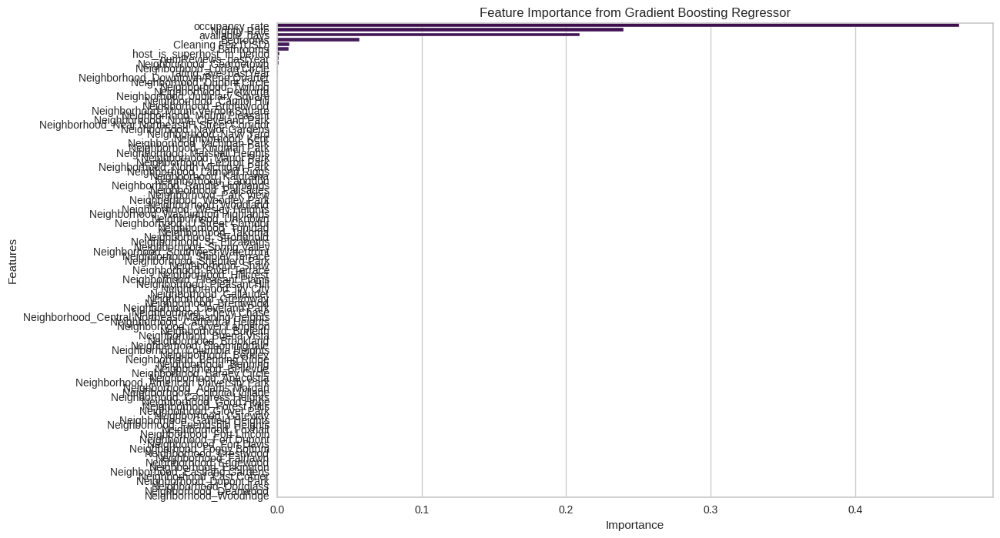


Pricing Recommendations:
   Nightly Rate  Predicted Revenue
0          50.0        -151.142389
1         100.0          96.576678
2         150.0         211.418854
3         200.0         385.165773
4         250.0         393.844230
5         300.0         345.401593
6         350.0         582.266804
7         400.0         776.495428
8         450.0         776.495428
9         500.0         776.495428

Pricing recommendations saved to /content/airbnb_Washington_pricing_recommendations.csv.


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns

# Load the final preprocessed dataset
file_path = '/content/airbnb_Washington_final_preprocessed.csv'
airbnb_data = pd.read_csv(file_path)

# Check for Neighborhood column and its content
if 'Neighborhood' not in airbnb_data.columns:
    raise KeyError("The column 'Neighborhood' is missing from the dataset.")
else:
    print(f"Neighborhood column found with unique values: {airbnb_data['Neighborhood'].unique()}")

# Select features and target for regression
features = [
    'Nightly Rate', 'available_days', 'occupancy_rate', 'Bedrooms',
    'Bathrooms', 'host_is_superhost_in_period', 'rating_ave_pastYear',
    'numReviews_pastYear', 'Cleaning Fee (USD)'
]

# Add one-hot encoding for Neighborhood
airbnb_data = pd.get_dummies(airbnb_data, columns=['Neighborhood'], drop_first=True)

# Update features to include encoded Neighborhood columns
neighborhood_columns = [col for col in airbnb_data.columns if col.startswith('Neighborhood_')]
features.extend(neighborhood_columns)

# Define target
target = 'revenue'

# Split the data into training and testing sets
X = airbnb_data[features]
y = airbnb_data[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a Gradient Boosting Regressor
gbr = GradientBoostingRegressor(random_state=42)
gbr.fit(X_train, y_train)

# Predict and evaluate the model
y_pred = gbr.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Gradient Boosting Regressor - MSE: {mse:.2f}, R2: {r2:.2f}")

# Feature Importance Visualization
feature_importance = pd.Series(gbr.feature_importances_, index=X_train.columns)
feature_importance = feature_importance.sort_values(ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(x=feature_importance, y=feature_importance.index, palette="viridis")
plt.title("Feature Importance from Gradient Boosting Regressor")
plt.xlabel("Importance")
plt.ylabel("Features")
plt.show()

# Recommend Optimal Pricing Strategy
def recommend_pricing(model, property_data, nightly_rates):
    recommendations = []
    for rate in nightly_rates:
        temp_data = property_data.copy()
        temp_data['Nightly Rate'] = rate
        predicted_revenue = model.predict(temp_data)
        recommendations.append((rate, predicted_revenue.mean()))
    return pd.DataFrame(recommendations, columns=['Nightly Rate', 'Predicted Revenue'])

# Example: Recommend optimal pricing for a sample property
sample_property = X_test.iloc[0:1]  # Take a sample property
nightly_rates = np.linspace(50, 500, 10)  # Example range of nightly rates

pricing_recommendations = recommend_pricing(gbr, sample_property, nightly_rates)

print("\nPricing Recommendations:")
print(pricing_recommendations)

# Save pricing recommendations to a CSV
pricing_recommendations_file = '/content/airbnb_Washington_pricing_recommendations.csv'
pricing_recommendations.to_csv(pricing_recommendations_file, index=False)
print(f"\nPricing recommendations saved to {pricing_recommendations_file}.")


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Load the final preprocessed dataset
file_path = '/content/airbnb_Washington_final_preprocessed.csv'
airbnb_data = pd.read_csv(file_path)

# Select features and target
features = [
    'Nightly Rate', 'available_days', 'occupancy_rate', 'Bedrooms',
    'Bathrooms', 'host_is_superhost_in_period', 'rating_ave_pastYear',
    'numReviews_pastYear', 'Cleaning Fee (USD)'
]
neighborhood_columns = [col for col in airbnb_data.columns if col.startswith('Neighborhood_')]
features.extend(neighborhood_columns)
target = 'revenue'

# Split the data into training and testing sets
X = airbnb_data[features]
y = airbnb_data[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the Gradient Boosting Regressor
gbr = GradientBoostingRegressor(random_state=42)
gbr.fit(X_train, y_train)

# Define function for pricing recommendation analysis
def pricing_recommendation_analysis(model, data, clusters_or_neighborhoods, feature_column='Neighborhood'):
    """
    Perform pricing recommendation analysis for multiple clusters or neighborhoods.
    """
    results = []
    for cluster in clusters_or_neighborhoods:
        cluster_data = data[data[feature_column] == cluster]
        sample_property = cluster_data.iloc[0:1].copy()
        if sample_property.empty:
            continue
        nightly_rates = np.linspace(50, 500, 10)
        for rate in nightly_rates:
            sample_property['Nightly Rate'] = rate
            predicted_revenue = model.predict(sample_property)
            results.append({
                'Cluster/Neighborhood': cluster,
                'Nightly Rate': rate,
                'Predicted Revenue': predicted_revenue[0]
            })
    return pd.DataFrame(results)

# Perform analysis for neighborhoods
neighborhoods = [col.split('_')[1] for col in neighborhood_columns]
pricing_results = pricing_recommendation_analysis(gbr, airbnb_data, neighborhoods, feature_column='Neighborhood')

# Print pricing recommendations
print("\nPricing Recommendation Results:")
print(pricing_results)

# Validation: Test Pricing Strategy Against Real Data
def validate_pricing_strategy(data, predicted_column, actual_column):
    """
    Compare predicted revenue with actual revenue to validate the pricing strategy.
    """
    mse = mean_squared_error(data[actual_column], data[predicted_column])
    r2 = r2_score(data[actual_column], data[predicted_column])
    print(f"\nValidation Results - MSE: {mse:.2f}, R2: {r2:.2f}")
    return mse, r2

# Add predicted revenue for actual nightly rates
airbnb_data['Predicted Revenue'] = gbr.predict(X)

# Validate against actual revenue
validate_pricing_strategy(airbnb_data, predicted_column='Predicted Revenue', actual_column='revenue')

# Print validation results
print("\nValidation Data with Predicted Revenue:")
print(airbnb_data[['Neighborhood', 'Nightly Rate', 'revenue', 'Predicted Revenue']].head())



Pricing Recommendation Results:
Empty DataFrame
Columns: []
Index: []

Validation Results - MSE: 761005.81, R2: 0.87

Validation Data with Predicted Revenue:
  Neighborhood  Nightly Rate  revenue  Predicted Revenue
0    Park View         125.0   2871.0        3027.348615
1    Park View         174.0   1089.0        1577.815457
2    Park View         174.0   2347.0        2574.590981
3    Park View         174.0   2347.0        2574.590981
4    Park View          60.0   2347.0        2128.243055


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Load the final preprocessed dataset
file_path = '/content/airbnb_Washington_final_preprocessed.csv'
airbnb_data = pd.read_csv(file_path)

# Select features and target
features = [
    'Nightly Rate', 'available_days', 'occupancy_rate', 'Bedrooms',
    'Bathrooms', 'host_is_superhost_in_period', 'rating_ave_pastYear',
    'numReviews_pastYear', 'Cleaning Fee (USD)'
]
neighborhood_columns = [col for col in airbnb_data.columns if col.startswith('Neighborhood_')]
features.extend(neighborhood_columns)
target = 'revenue'

# Split the data into training and testing sets
X = airbnb_data[features]
y = airbnb_data[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the Gradient Boosting Regressor
gbr = GradientBoostingRegressor(random_state=42)
gbr.fit(X_train, y_train)

# Revised function with debug statements
def pricing_recommendation_analysis_debug(model, data, neighborhood_columns):
    """
    Perform pricing recommendation analysis for multiple neighborhoods using one-hot encoding.
    Includes debug statements to verify the filtering process.
    """
    results = []
    for neighborhood_col in neighborhood_columns:
        # Filter properties where this neighborhood column is active (1)
        neighborhood_data = data[data[neighborhood_col] == 1]
        print(f"Processing {neighborhood_col}: {len(neighborhood_data)} properties found")

        if neighborhood_data.empty:
            print(f"No properties found for {neighborhood_col}, skipping.")
            continue

        # Take the first property as a sample
        sample_property = neighborhood_data.iloc[0:1].copy()
        nightly_rates = np.linspace(50, 500, 10)

        # Predict revenue for a range of nightly rates
        for rate in nightly_rates:
            sample_property['Nightly Rate'] = rate
            predicted_revenue = model.predict(sample_property)
            results.append({
                'Neighborhood': neighborhood_col.split('_')[1],  # Extract neighborhood name
                'Nightly Rate': rate,
                'Predicted Revenue': predicted_revenue[0]
            })

    return pd.DataFrame(results)

# Perform analysis for all one-hot encoded neighborhood columns
pricing_results_debug = pricing_recommendation_analysis_debug(gbr, airbnb_data, neighborhood_columns)

# Print debug outputs and results
if not pricing_results_debug.empty:
    print("\nPricing Recommendation Results (Debug):")
    print(pricing_results_debug)
else:
    print("\nNo pricing recommendations generated. Check the debug logs for issues.")

# Validation: Test Pricing Strategy Against Real Data
def validate_pricing_strategy(data, predicted_column, actual_column):
    """
    Compare predicted revenue with actual revenue to validate the pricing strategy.
    """
    mse = mean_squared_error(data[actual_column], data[predicted_column])
    r2 = r2_score(data[actual_column], data[predicted_column])
    print(f"\nValidation Results - MSE: {mse:.2f}, R2: {r2:.2f}")
    return mse, r2

# Add predicted revenue for actual nightly rates
airbnb_data['Predicted Revenue'] = gbr.predict(X)

# Validate against actual revenue
validate_pricing_strategy(airbnb_data, predicted_column='Predicted Revenue', actual_column='revenue')

# Print validation results
print("\nValidation Data with Predicted Revenue:")
print(airbnb_data[['Nightly Rate', 'revenue', 'Predicted Revenue']].head())



No pricing recommendations generated. Check the debug logs for issues.

Validation Results - MSE: 761005.81, R2: 0.87

Validation Data with Predicted Revenue:
   Nightly Rate  revenue  Predicted Revenue
0         125.0   2871.0        3027.348615
1         174.0   1089.0        1577.815457
2         174.0   2347.0        2574.590981
3         174.0   2347.0        2574.590981
4          60.0   2347.0        2128.243055
